## Miguel Baidal

### Import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
import shap
import os
import scienceplots # plt.style.use('science')
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, VotingClassifier
from sklearn.linear_model import LogisticRegression, LinearRegression, ElasticNet
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_val_predict, StratifiedKFold, KFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, r2_score, root_mean_squared_error
import scipy.stats as stats
from scipy.stats import pearsonr, ttest_ind
from xgboost import XGBClassifier, XGBRegressor
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import make_pipeline
from statsmodels.stats.contingency_tables import mcnemar
import torch

### Load data and merging

In [2]:
# Load XLSX
file_path = "df_dr_amplitude_and_fslnets_A4.xlsx"

# Get all Excel sheets in a dictionary
sheets = pd.read_excel(file_path, sheet_name=None)

# Convert them in a list of dataframes
dataframes = list(sheets.values())

# Check if 'BID' is a good identifier/key
no_issues = True
for i, df_i in enumerate(dataframes):
    nans = df_i['BID'].isnull().sum()
    dups = df_i['BID'].duplicated().sum()
    print(f"Sheet {i+1}: NaNs for BID = {nans}, Duplicates for BID = {dups}")
    if nans > 0 or dups > 0:
        no_issues = False

# Merge only if there are no NaNs or duplicates
if no_issues:
    df = dataframes[0]
    for df_i in dataframes[1:]:
        # Remove duplicate columns (except BID)
        shared_cols = [col for col in df_i.columns if col in df.columns and col != 'BID']
        df_i = df_i.drop(columns=shared_cols)
        df = pd.merge(df, df_i, on='BID', how='outer')
    
    output_path = "merged_A4.xlsx"
    df.to_excel(output_path, index=False)
    print(f"Merged file saved to {output_path}.")
    
else:
    print("Merging aborted: Some sheets have NaNs or duplicate BID values.")

Sheet 1: NaNs for BID = 0, Duplicates for BID = 0
Sheet 2: NaNs for BID = 0, Duplicates for BID = 0
Sheet 3: NaNs for BID = 0, Duplicates for BID = 0
Sheet 4: NaNs for BID = 0, Duplicates for BID = 0
Sheet 5: NaNs for BID = 0, Duplicates for BID = 0
Merged file saved to merged_A4.xlsx.


### Data Preprocessing and Exploratory Data Analysis (EDA)

**Science Plots**: Matplotlib styles to format figures for scientific papers, presentations and theses.

https://github.com/garrettj403/SciencePlots

In [3]:
plt.style.use('science')

#### Data types, variable categories, and sample values

In [4]:
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}\n")

Number of rows: 1292
Number of columns: 1655



In [5]:
# Main columns from the dataset
identifiers = ["BID"]
variables = ["group", "PTAGE", "PTGENDER", "centiloid", "PACCRN"]
fslnets_amp_ic = [col for col in df.columns if col.startswith("fslnets_amp_ic")]
fslnets_amp2_ic = [col for col in df.columns if col.startswith("fslnets_amp2_ic")]
fslnets_Fcorr_regres_ = [col for col in df.columns if col.startswith("fslnets_Fcorr_regres_")]
fslnets_Pcorr_regres_ = [col for col in df.columns if col.startswith("fslnets_Pcorr_regres_")]
fslnets_Fcorr_ = [col for col in df.columns if col.startswith("fslnets_Fcorr_") and "regres" not in col]
fslnets_Pcorr_ = [col for col in df.columns if col.startswith("fslnets_Pcorr_") and "regres" not in col]

# Count the number of columns in each group
column_counts = {
    "fslnets_amp_ic": len(fslnets_amp_ic),
    "fslnets_amp2_ic": len(fslnets_amp2_ic),
    "fslnets_Fcorr_": len(fslnets_Fcorr_),
    "fslnets_Pcorr_": len(fslnets_Pcorr_),
    "fslnets_Fcorr_regres_": len(fslnets_Fcorr_regres_),
    "fslnets_Pcorr_regres_": len(fslnets_Pcorr_regres_)
}

# Convert to dataframe and display
column_counts_df = pd.DataFrame(list(column_counts.items()), columns=["Group", "Number of columns"])
column_counts_df


,Group,Number of columns
0,fslnets_amp_ic,20
1,fslnets_amp2_ic,20
2,fslnets_Fcorr_,400
3,fslnets_Pcorr_,400
4,fslnets_Fcorr_regres_,400
5,fslnets_Pcorr_regres_,400


In [6]:
# See columns type
def summarize_variable_types(df, columns):
    classification = {}
    dtype = []
    samples = []

    for col in columns:
        unique_values = df[col].nunique()
        dtype.append(df[col].dtype)

        if unique_values == 2:
            var_type = "Binary Categorical"
        else:
            var_type = "Numerical"

        classification[col] = var_type

        # Extract 5 Not Null values for each variable and display them
        non_null_vals = df[col].dropna().unique()[:5]
        samples.append(", ".join(map(str, non_null_vals)))

    summary_df = pd.DataFrame({
        "Variable": columns,
        "Data type": dtype,
        "Variable Type": [classification[col] for col in columns],
        "Sample Values": samples
    })

    return summary_df

In [7]:
summary_variables = summarize_variable_types(df, variables)
print(summary_variables.to_string(index=False))

 Variable Data type      Variable Type                                                                                Sample Values
    group    object Binary Categorical                                                                                    A4, LEARN
    PTAGE   float64          Numerical                                                            67.79, 66.62, 69.37, 70.81, 78.25
 PTGENDER    object Binary Categorical                                                                                 Female, Male
centiloid   float64          Numerical                                                   36.9319, 58.9003, 42.424, 93.6836, 80.8687
   PACCRN   float64          Numerical 3.7917574579258, -1.17001134521875, -0.280458973950615, -1.37632730772086, -2.06824190687878


#### Missing values handling

In [8]:
null_counts = df.isna().sum() # Count NaNs by column
null_percent = (null_counts / len(df)) * 100 # Calculate percentage of NaNs

# Summary
summary = pd.DataFrame({
    "Nº of NaNs": null_counts,
    "% of NaNs": null_percent.round(2)
})

# See first columns with NaNs
print(summary[summary["Nº of NaNs"] > 0].head(20))

                      Nº of NaNs  % of NaNs
group                          1       0.08
centiloid                      1       0.08
PTAGE                          1       0.08
PTGENDER                       1       0.08
PACCRN                         1       0.08
PTGENDER_binary                1       0.08
group_a4                       1       0.08
PTAGE_demeaned                 1       0.08
centiloid_normalized           1       0.08
PTAGE_normalized               1       0.08
PACCRN_Z                       1       0.08


In [9]:
# Drop NaNs as the percentage is very low
df = df.dropna()

# Drop identifiers
df = df.drop(columns=identifiers)

#### Binary Variables Encoding

Binary/Categorical variables are encoded to integer for the rest of the notebook

In [10]:
# Encode 'group'
label_encoder_group = LabelEncoder()
df['group'] = label_encoder_group.fit_transform(df['group'])
group_mapping = dict(zip(label_encoder_group.transform(label_encoder_group.classes_), label_encoder_group.classes_))
print(f"Group mapping: {group_mapping}")
df['group_label'] = df['group'].map(group_mapping)

# Encode 'PTGENDER'
label_encoder_gender = LabelEncoder()
df['PTGENDER'] = label_encoder_gender.fit_transform(df['PTGENDER'])
gender_mapping = dict(zip(label_encoder_gender.transform(label_encoder_gender.classes_), label_encoder_gender.classes_))
print(f"Gender mapping: {gender_mapping}")
df['PTGENDER_label'] = df['PTGENDER'].map(gender_mapping)

Group mapping: {0: 'A4', 1: 'LEARN'}
Gender mapping: {0: 'Female', 1: 'Male'}


In [11]:
# A copy of the full dataframe is saved for further analysis (CNN and GNN)
df_original = df.copy()

### Connectivity matrices reconstruction, analysis, validation, and reduction

The 20×20 connectivity matrices given in the dataset are reconstructed, checking their completeness and symmetry, and removing redundant features by keeping only the lower triangle (excluding the diagonal).

Since models perform similarly with or without the duplicated half, this reduces computational cost without losing significant information, producing a cleaner and optimized dataset.

In [12]:
# Function to reconstruct a size_x_size matrix from flattened columns
# Column names follow the format: "fslnets_Pcorr_345", where 345 = i * 20 + j (in case of 20x20 matrices)
def reconstruct_matrix(df, columns, size=20):
    matrix = np.zeros((size, size))      # Initialize matrix with zeros
    for col in columns:
        val = df[col].values[0]          # Get the value from the DataFrame -> Only one row (the first subject: row=0) is analyzed
        index = int(col.split('_')[-1])  # Get the numeric index: fslnets_Pcorr_345 -> 345. The most right string separated by '_' is saved as integer
        i, j = divmod(index, size)       # Convert index back to 2D coordinates
        matrix[i, j] = val               # Assign the value to the position in the matrix
    return matrix

# Analyze the matrix: symmetry, diagonal, and return analysis + matrix
def analyze_matrix(df, columns, name, size=20):
    expected_cols = size * size # 20x20 matrix
    is_complete = len(columns) == expected_cols # Check if the number of columns is 400 (20x20 matrix)
    if not is_complete:
        return {"name": name, "complete": False, "symmetric": False, "diag_zero": False, "matrix": None}

    matrix = reconstruct_matrix(df, columns, size=size) # Reconstruct the matrix from the columns: 1D -> 2D
    is_symmetric = np.allclose(matrix, matrix.T) # Check if the matrix is symmetric: if matrix == matrix.T (if matrix[i][j] == matrix[j][i] for all i, j)
    diag_zero = np.allclose(np.diag(matrix), 0) # Check if the diagonal is zero: if matrix[i][i] == 0 for all i

    return {
        "name": name,
        "complete": True,
        "symmetric": is_symmetric,
        "diag_zero": diag_zero,
        "matrix": matrix
    }

# Print summary table with results
def summarize_matrix_analyses(results):
    summary = pd.DataFrame([{
        "Matrix": r["name"],
        "Complete": r["complete"],
        "Symmetric": r["symmetric"],
        "Zero Diagonal": r["diag_zero"]
    } for r in results])
    return summary

# Plot all 4 matrices in a single row
def plot_matrices(results):
    _, axes = plt.subplots(1, len(results), figsize=(14, 4)) # Create a single row of subplots
    for ax, result in zip(axes, results):
        matrix = result["matrix"] # Get the matrix from the result
        np.fill_diagonal(matrix, np.nan) # Fill the diagonal with NaN to avoid showing it in the heatmap
        sns.heatmap(matrix, cmap="viridis", square=True, cbar=False, ax=ax, xticklabels=False, yticklabels=False, mask=np.isnan(matrix))   # Plot the matrix as a heatmap
        ax.set_title(result["name"], fontsize=16)
    plt.tight_layout()
    plt.savefig("example_matrices.pdf") # Save the figure
    plt.show()

In [13]:
# Run the analysis for each group of columns
matrix_analyses_results = [
    analyze_matrix(df, fslnets_Fcorr_, "fslnets_Fcorr_"),
    analyze_matrix(df, fslnets_Pcorr_, "fslnets_Pcorr_"),
    analyze_matrix(df, fslnets_Fcorr_regres_, "fslnets_Fcorr_regres_"),
    analyze_matrix(df, fslnets_Pcorr_regres_, "fslnets_Pcorr_regres_")
]

# Print summary table
matrix_analyses_results_df = summarize_matrix_analyses(matrix_analyses_results)
print(matrix_analyses_results_df.to_string(index=False))

               Matrix  Complete  Symmetric  Zero Diagonal
       fslnets_Fcorr_      True       True           True
       fslnets_Pcorr_      True       True           True
fslnets_Fcorr_regres_      True       True           True
fslnets_Pcorr_regres_      True       True           True


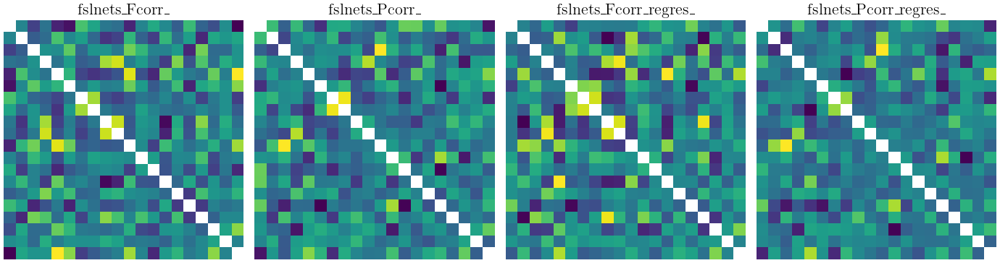

In [14]:
# Plot all matrices in a single row
plot_matrices(matrix_analyses_results)

In [15]:
# Function to identify columns corresponding to the lower triangle (i > j) and excluding the diagonal (i == j)
def get_lower_triangle_columns(columns, size=20):
    lower_cols = [] # List to store lower triangle columns
    for col in columns:
        try:
            index = int(col.split('_')[-1])   # Get the numeric index: fslnets_Pcorr_345 -> 345
            i, j = divmod(index, size)        # Convert index back to 2D coordinates
            if i > j:  # strictly lower triangle (excluding diagonal)
                lower_cols.append(col)
        except:
            continue # Skip if the column name does not match the expected format
    return lower_cols

# Filter original column lists to keep only lower triangle values without the diagonal (190 features in 20x20 matrices cases)
filtered_Fcorr = get_lower_triangle_columns(fslnets_Fcorr_)
filtered_Pcorr = get_lower_triangle_columns(fslnets_Pcorr_)
filtered_Fcorr_regres = get_lower_triangle_columns(fslnets_Fcorr_regres_)
filtered_Pcorr_regres = get_lower_triangle_columns(fslnets_Pcorr_regres_)

# Check for original columns that are not original Fcorr neither Pcorr
cols_to_exclude = [col for col in df.columns if col.startswith("fslnets_Fcorr_") or col.startswith("fslnets_Pcorr_")]  # Exclude original Fcorr and Pcorr columns
other_columns = [col for col in df.columns if col not in cols_to_exclude] # Keep other columns that are not in the excluded list

# Construct the new dataframe
columns_to_keep = other_columns + filtered_Fcorr + filtered_Pcorr + filtered_Fcorr_regres + filtered_Pcorr_regres

# Create the new dataframe
df = df[columns_to_keep]

# Check the new dataframe
print("Verifying number of columns per type (expecting 190 each):\n")
print(f"fslnets_Fcorr_:         {len(filtered_Fcorr)} columns")
print(f"fslnets_Pcorr_:         {len(filtered_Pcorr)} columns")
print(f"fslnets_Fcorr_regres_:  {len(filtered_Fcorr_regres)} columns")
print(f"fslnets_Pcorr_regres_:  {len(filtered_Pcorr_regres)} columns")
print(f"\nTotal columns in new reduced dataframe: {df.shape[1]} (original: {df_original.shape[1]})")

Verifying number of columns per type (expecting 190 each):

fslnets_Fcorr_:         190 columns
fslnets_Pcorr_:         190 columns
fslnets_Fcorr_regres_:  190 columns
fslnets_Pcorr_regres_:  190 columns

Total columns in new reduced dataframe: 816 (original: 1656)


### Clinical variables distributions

#### Histograms for numerical variables

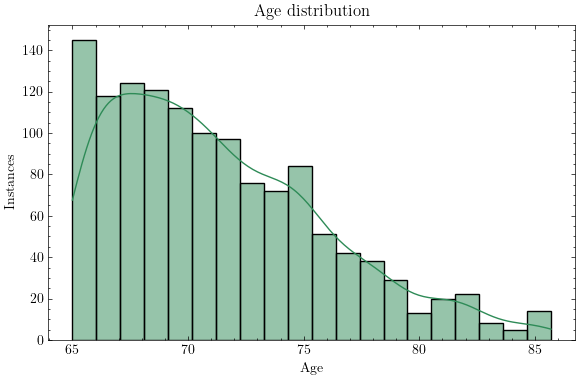

In [16]:
plt.figure(figsize=(6, 4))
sns.histplot(df["PTAGE"], kde=True, bins=20, color="seagreen")
plt.title("Age distribution")
plt.xlabel("Age")
plt.ylabel("Instances")
plt.tight_layout()
plt.savefig("hist_age.pdf")

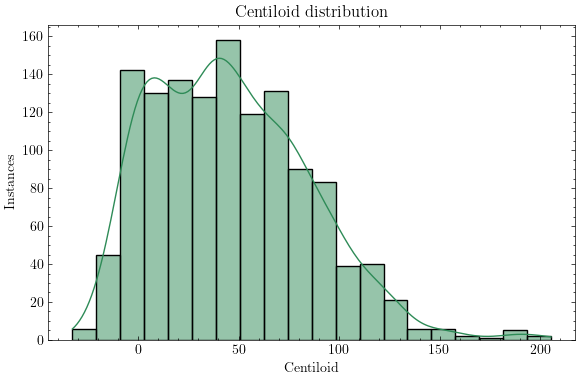

In [17]:
plt.figure(figsize=(6, 4))
sns.histplot(df["centiloid"], kde=True, bins=20, color="seagreen")
plt.title("Centiloid distribution")
plt.xlabel("Centiloid")
plt.ylabel("Instances")
plt.tight_layout()
plt.savefig("hist_centiloid.pdf")

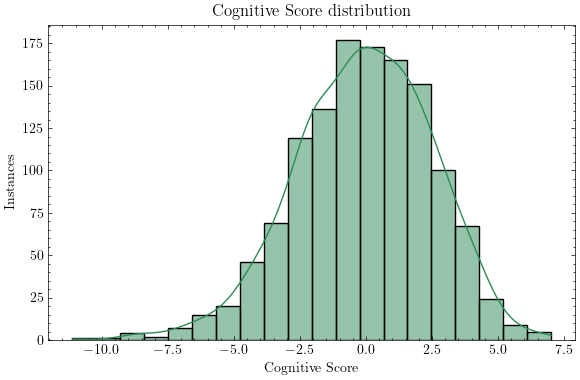

In [18]:
plt.figure(figsize=(6, 4))
sns.histplot(df["PACCRN"], kde=True, bins=20, color="seagreen")
plt.title("Cognitive Score distribution")
plt.xlabel("Cognitive Score")
plt.ylabel("Instances")
plt.tight_layout()
plt.savefig("hist_cognitive_score.pdf")

#### Boxplots for numerical variables for each group/gender

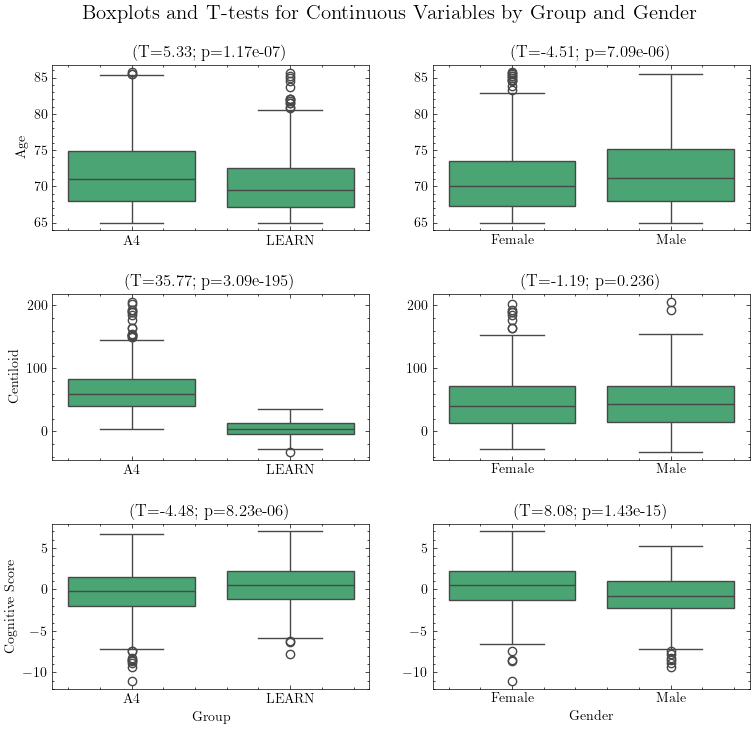

In [19]:
# Mapping technical variable names to human-readable names
clean_names = {
    "PTAGE": "Age",
    "centiloid": "Centiloid",
    "PACCRN": "Cognitive Score",
    "group_label": "Group",
    "PTGENDER_label": "Gender"
}

continuous_variables = ["PTAGE", "centiloid", "PACCRN"]
n_rows = len(continuous_variables)
n_cols = 2  # Group, Gender

t_results = []

fig, axes = plt.subplots(n_rows, n_cols, figsize=(9, 8))
# Place the global title closer to the plots
fig.suptitle("Boxplots and T-tests for Continuous Variables by Group and Gender", fontsize=15, y=0.965)

for i, var in enumerate(continuous_variables):
    # --- By Group (left column) ---
    ax = axes[i, 0]
    sns.boxplot(x='group_label', y=var, data=df, color='mediumseagreen', ax=ax)
    values_0 = df[df['group'] == 0][var]
    values_1 = df[df['group'] == 1][var]
    t_stat, p_val = ttest_ind(values_0, values_1, nan_policy="omit")
    t_results.append({'Variable': clean_names[var], 'Comparison': 'Group', 'T': t_stat, 'p': p_val})
    ax.set_title(f"(T={t_stat:.2f}; p={p_val:.3g})", fontsize=12, color="black")
    ax.set_ylabel(clean_names[var])
    if i == n_rows - 1:
        ax.set_xlabel(clean_names['group_label'])
    else:
        ax.set_xlabel("")
    ax.tick_params(axis='x', rotation=0)

    # --- By Gender (right column) ---
    ax = axes[i, 1]
    sns.boxplot(x='PTGENDER_label', y=var, data=df, color='mediumseagreen', ax=ax)
    values_f = df[df['PTGENDER'] == 0][var]
    values_m = df[df['PTGENDER'] == 1][var]
    t_stat, p_val = ttest_ind(values_f, values_m, nan_policy="omit")
    t_results.append({'Variable': clean_names[var], 'Comparison': 'Gender', 'T': t_stat, 'p': p_val})
    ax.set_title(f"(T={t_stat:.2f}; p={p_val:.3g})", fontsize=12, color="black")
    ax.set_ylabel("")
    if i == n_rows - 1:
        ax.set_xlabel(clean_names['PTGENDER_label'])
    else:
        ax.set_xlabel("")
    ax.tick_params(axis='x', rotation=0)

# Increase vertical spacing between subplot rows, and bring subplots closer to the suptitle
plt.subplots_adjust(
    top=0.89,   # Lower value brings the suptitle closer to first row (default is ~0.92-0.94)
    hspace=0.39 # Increase vertical space between rows (default is ~0.2)
)
plt.savefig("boxplots_ttest_in_title.pdf")
plt.show()

#### Distributions by Gender and Group

In [20]:
gender_counts = df['PTGENDER'].map(gender_mapping).value_counts().rename_axis('Gender').reset_index(name='Count')
group_counts = df['group'].map(group_mapping).value_counts().rename_axis('Group').reset_index(name='Count')

print("Gender distribution:")
print(gender_counts.to_string(index=False))
print("\nGroup distribution:")
print(group_counts.to_string(index=False))

Gender distribution:
Gender  Count
Female    799
  Male    492

Group distribution:
Group  Count
   A4    896
LEARN    395


In [21]:
continuous_variables = ["PTAGE", "centiloid", "PACCRN"]

#### Pairplots

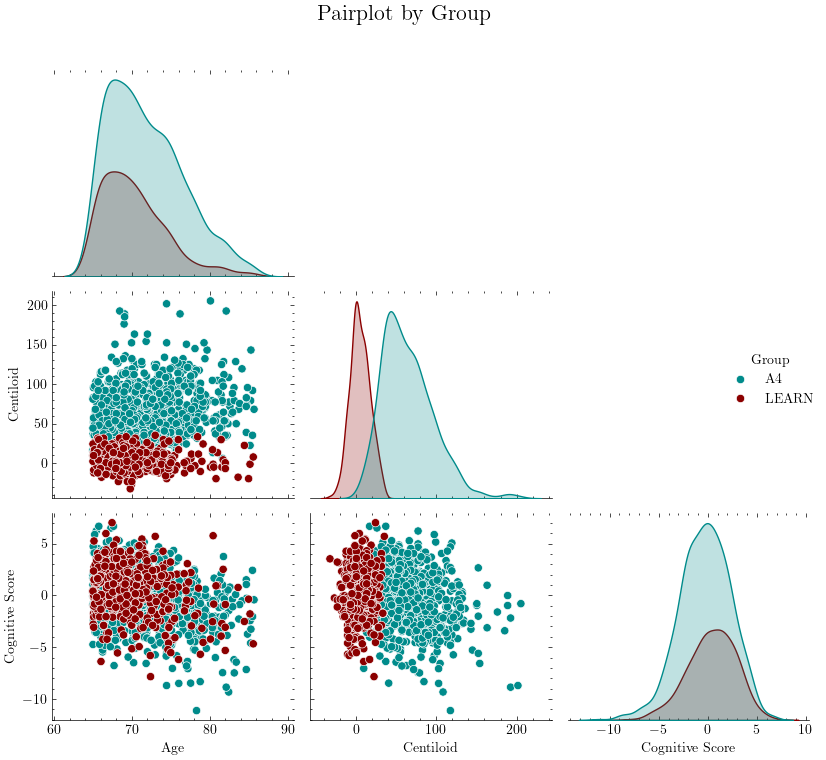

In [22]:
# Colors for the two groups
custom_palette = ["darkcyan", "darkred"]

# Dictionary to rename columns for better axis labels
rename_dict = {
    'PTAGE': 'Age',
    'centiloid': 'Centiloid',
    'PACCRN': 'Cognitive Score',
    'group_label': 'Group',
    'PTGENDER_label': 'Gender'
}

# Select and rename only the relevant columns for plotting
df_plot = df[continuous_variables + ['group_label']].rename(columns=rename_dict)

# Pairplot
g = sns.pairplot(
    df_plot,
    hue='Group',
    corner=True,
    diag_kind='kde',
    height=2.5,
    palette=custom_palette
)

g.fig.suptitle("Pairplot by Group", fontsize=16, y=1.02)

# Change the legend title to 'Group'
if g._legend is not None:
    g._legend.set_title("Group")

plt.tight_layout()
plt.savefig("pairplot_by_group.pdf")

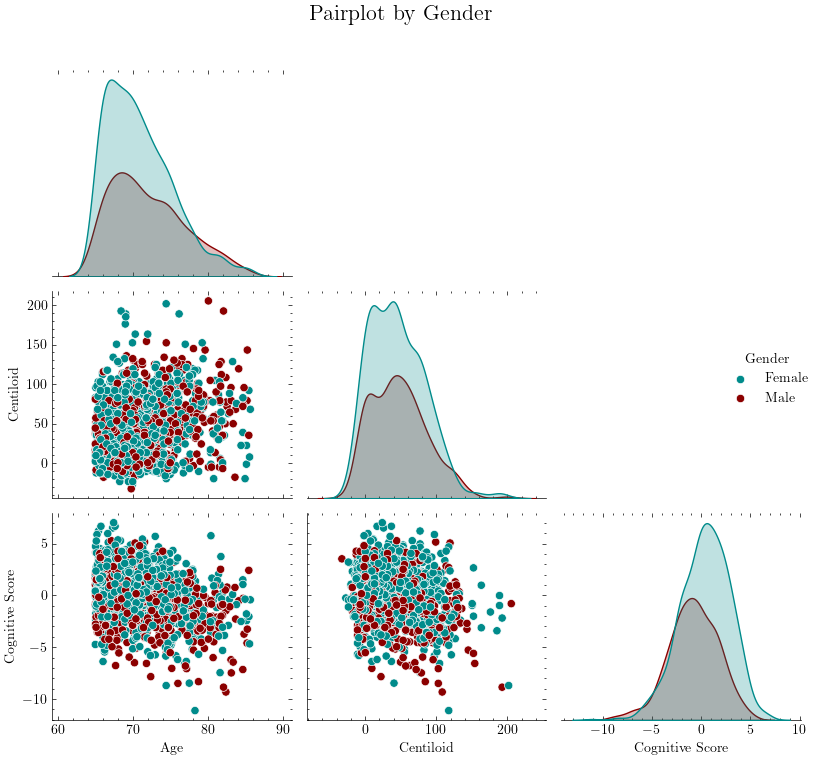

In [23]:
df_plot = df[continuous_variables + ['PTGENDER_label']].rename(columns=rename_dict)

g = sns.pairplot(
    df_plot,
    hue='Gender',
    corner=True,
    diag_kind='kde',
    height=2.5,
    palette=custom_palette
)

g.fig.suptitle("Pairplot by Gender", fontsize=16, y=1.02)

if g._legend is not None:
    g._legend.set_title("Gender")

plt.tight_layout()
plt.savefig("pairplot_by_gender.pdf")

### Outliers handling

Potential outliers are detected in the continuous variables using the interquartile range (IQR) method, by identifying values beyond 1.5×IQR from the first and third quartiles.

In [24]:
def detect_potential_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    return (data < lower) | (data > upper)

In [25]:
for col in continuous_variables:
    outliers = detect_potential_outliers(df[col]) # Detect potential outliers
    outliers_info = df.loc[outliers, ["group_label", "PTGENDER_label", "PTAGE", "centiloid", "PACCRN"]] # Get the information of the outliers
    print(f"\npotential outliers in '{col}' ({outliers_info.shape[0]} instances):")
    print(outliers_info.sort_values(by=col).to_string(index=False))


potential outliers in 'PTAGE' (14 instances):
group_label PTGENDER_label  PTAGE  centiloid    PACCRN
         A4         Female  84.70    38.7626  1.497849
         A4           Male  84.70    71.7152 -7.156489
         A4         Female  84.71    82.6994  1.056735
         A4           Male  84.73    73.5459 -0.291105
         A4           Male  84.86    95.5143 -3.738302
      LEARN         Female  85.00   -19.8198 -0.366495
      LEARN         Female  85.18    -1.5128 -1.791123
         A4         Female  85.19    22.2863 -2.445305
         A4           Male  85.26    79.0380 -4.603553
         A4           Male  85.30   143.1130 -3.260823
         A4           Male  85.50    35.1012  2.414170
         A4         Female  85.51    91.8529 -2.045277
      LEARN         Female  85.60     7.6407 -4.676836
         A4         Female  85.70    68.0538 -0.430455

potential outliers in 'centiloid' (10 instances):
group_label PTGENDER_label  PTAGE  centiloid    PACCRN
         A4         Fe

The instances that may be determined as outliers fit to the general ranges and expected values.

Any of them has an strange value and they make sense (they have the most extreme values, as it can be seen in the previous boxplots, but in a reasonable range).

#### Numerical variables further analysis

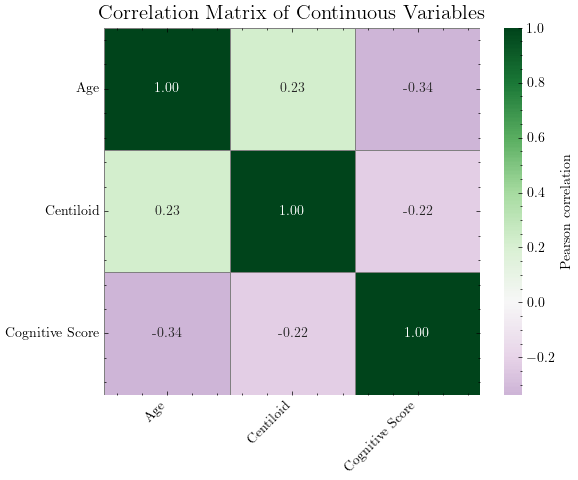

In [26]:
# Correlation matrix for numerical variables

corr = df[continuous_variables].rename(columns=rename_dict).corr()

plt.figure(figsize=(6, 5))
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="PRGn",
    center=0,
    linewidths=0.5,
    linecolor='grey',
    cbar_kws={'label': 'Pearson correlation'}
)
plt.title("Correlation Matrix of Continuous Variables", fontsize=15, weight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig("correlation_matrix_continuous_variables.pdf")
plt.show()

The correlation matrix shows that **older people tend to have lower cognitive scores**, meaning their thinking and memory skills might be reduced with age. Higher centiloid levels (which measure amyloid buildup in the brain) are linked to both being older and having slightly lower cognitive scores. This fits with what it is known about how amyloid growing is related to memory problems as people get older.

After looking at these basic connections, **linear regression is applied** a way to measure relationships between two things) to look more closely at how age, centiloid levels, and cognitive scores are related, both in the whole group and in smaller groups.

For these models, the values of age, centiloid, or cognitive scores, aren't scaled because it doesn’t affect the results and the graphs are easier to understand when we use the original numbers.

In [27]:
def groupwise_regression(df, x_var, y_var, group_col, ax, palette, rename_dict, annot_position):
    # Get pretty and more understandable axis labels
    x_label = rename_dict.get(x_var, x_var)
    y_label = rename_dict.get(y_var, y_var)
    group_label = rename_dict.get(group_col, group_col)
    groups = df[group_col].unique()
    # Assign a color to each group
    colors = {g: palette[i % len(palette)] for i, g in enumerate(groups)}
    # Scatterplot of points colored by group
    sns.scatterplot(data=df, x=x_var, y=y_var, hue=group_col, palette=palette, alpha=0.6, ax=ax, legend=True)
    text_lines = [] # List to store regression equations and statistics

    for i, g in enumerate(groups):
        # Fit regression for each group
        subset = df[df[group_col] == g] # Subset the data for the current group
        xg = subset[[x_var]]
        yg = subset[y_var]
        model_g = LinearRegression() # Create a linear regression model
        model_g.fit(xg, yg) # Fit the model to the data
        y_pred_g = model_g.predict(xg) # Predict y values using the fitted model
        r2_g = r2_score(yg, y_pred_g) # Calculate R²
        coef_g = model_g.coef_[0] # Get the coefficient of the model
        intercept_g = model_g.intercept_ # Get the intercept of the model
        _, pval_g = pearsonr(subset[x_var], subset[y_var]) # Calculate p-value for the correlation
        # Regression line for this group
        x_range = pd.Series(sorted(subset[x_var]))
        y_line = model_g.predict(x_range.values.reshape(-1, 1))
        ax.plot(x_range, y_line, color=colors[g], linewidth=2)
        # Store regression stats as a text block
        text_lines.append(f"{g}: y = {intercept_g:.2f} + {coef_g:.2f}·x\n   R²={r2_g:.2f}, p={pval_g:.2e}")
    
    # Decide annotation position
    if annot_position == "top":
        xy = (0.05, 0.95)
        va = "top"
    else:  # "bottom"
        xy = (0.05, 0.05)
        va = "bottom"

    # Annotate equations
    ax.annotate(
        "\n\n".join(text_lines), # Double newline to separate groups
        xy=xy, xycoords="axes fraction", color="black",
        fontsize=12, ha="left", va=va,
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", alpha=0.8)
    )
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_title(f"By {group_label}")
    ax.grid(True)
    leg = ax.legend(title=group_label, frameon=True) # Add legend
    leg.get_frame().set_facecolor('white') # Set legend background color
    leg.get_frame().set_edgecolor('black') # Set legend border color
    leg.get_frame().set_alpha(0.85) # Set legend transparency

In [28]:
def continuous_variables_regression(df, x_var, y_var, annot_position, group_col="group_label", group_col_2="PTGENDER_label", rename_dict=rename_dict, palette=custom_palette):
    # Get pretty and more understandable axis labels
    x_label = rename_dict.get(x_var, x_var)
    y_label = rename_dict.get(y_var, y_var)

    # Make 3 subplots (global, by group, by gender)
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

    # GLOBAL regression (all data)
    x = df[[x_var]]
    y = df[y_var]
    model = LinearRegression()
    model.fit(x, y)
    y_pred = model.predict(x)
    r2 = r2_score(y, y_pred)
    coef = model.coef_[0]
    intercept = model.intercept_
    _, p_value = pearsonr(df[x_var], df[y_var])
    # Scatter and regression line (black)
    sns.regplot(x=x_var, y=y_var, data=df, ax=axes[0],
                scatter_kws={'alpha': 0.6, 'color': 'grey'},
                line_kws={'color': 'black'})  # <-- black regression line
    axes[0].set_xlabel(x_label)
    axes[0].set_ylabel(y_label)
    axes[0].set_title("Global")
    axes[0].grid(True)
    # Decide annotation position
    if annot_position == "top":
        xy = (0.05, 0.95)
        va = "top"
    else:  # "bottom"
        xy = (0.05, 0.05)
        va = "bottom"
    axes[0].annotate(
        f"y = {intercept:.2f} + {coef:.2f}·x\nR² = {r2:.2f}, p = {p_value:.2e}",
        xy=xy, xycoords="axes fraction", ha="left", va=va, fontsize=12,
        color="black", bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", alpha=0.8)
    )

    # GROUPWISE regression
    groupwise_regression(df, x_var, y_var, group_col, axes[1], palette, rename_dict, annot_position)
    groupwise_regression(df, x_var, y_var, group_col_2, axes[2], palette, rename_dict, annot_position)

    # Add main title and layout, save as PDF
    plt.suptitle(f"Linear Regression: {y_label} vs {x_label}", fontsize=20, weight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.97])

    pdf_name = f"linear_regression_{y_var}_vs_{x_var}.pdf"
    plt.savefig(pdf_name)

c:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


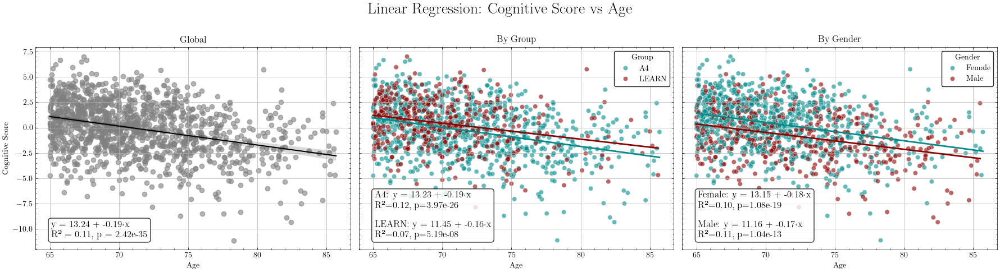

In [29]:
continuous_variables_regression(df, "PTAGE", "PACCRN", annot_position="bottom")

There is a clear and meaningful link between age and cognitive performance: **as people get older, their cognitive scores tend to go down**, which suggests some decline in thinking skills with age.

Even though this connection is real, **age alone only explains about 11% of the differences in cognitive performance**, so there are other important factors at play.

Looking at different groups:

- Clinical groups: Both groups show the same downward trend with age. However, people in the A4 group start off with higher cognitive scores compared to those in the LEARN group.

- Gender: Men and women both show the same pattern—cognitive scores decrease with age. But women generally start out with higher scores than men at any given age. The rate at which scores decline is about the same for both.

These results show that while age does matter for cognitive performance, it isn’t the only thing that counts. Both the clinical group and gender affect starting levels of cognitive ability, but don’t really change how much age impacts cognitive decline.

c:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


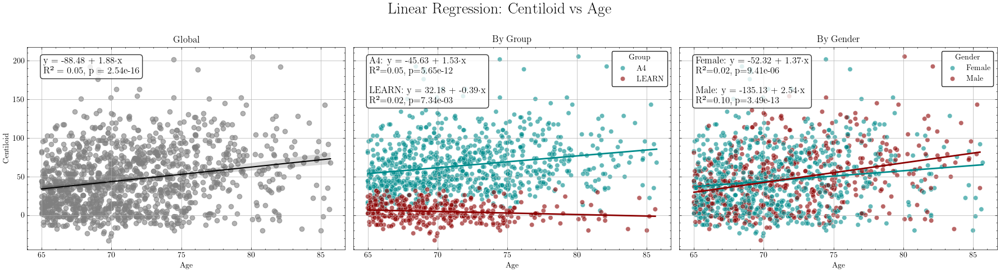

In [30]:
continuous_variables_regression(df, "PTAGE", "centiloid", annot_position="top")

There is a clear link between age and Centiloid values: **as people get older, amyloid tends to increase**.

However, age alone only explains about 5% of the differences in amyloid levels, so most of the variation is due to other factors.

Looking at different groups:

- Clinical groups: The A4 group shows the same increase in amyloid with age as the overall group. In contrast, the LEARN group doesn’t show this pattern as strongly, which suggests that rising amyloid with age is more common in the A4 group.

- Gender: Both men and women show amyloid increasing with age, but the pattern is stronger in men (age explains 10% of the variation for men, but only 2% for women). Women tend to start off with higher amyloid levels at younger ages, but their increase with age is not as steep as it is for men.

In summary, age plays a role in amyloid buildup, but it’s not the only factor. Both clinical group and gender also affect amyloid levels, but they don’t fully explain why people’s amyloid changes the way it does with age.

c:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


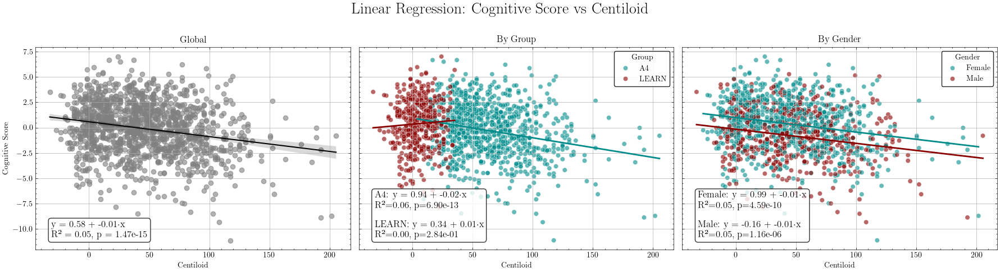

In [31]:
continuous_variables_regression(df, "centiloid", "PACCRN", annot_position="bottom")

There is a clear relationship between Centiloid and cognitive scores: **as amyloid goes up, cognitive performance tends to go down**. This means that having more amyloid is linked to worse thinking and memory.

However, this relationship is not very strong—Centiloid only explains about 5% of the differences in cognitive scores. So, while amyloid matters, there are many other factors that affect cognitive performance.

Looking at different groups:

- Clinical groups (A4 vs LEARN): In the A4 group, the link between more amyloid and lower cognitive scores is a bit stronger. In the LEARN group, there’s basically no clear relationship between amyloid and cognition.

- Gender: Both men and women show the same trend—higher amyloid is linked to lower cognitive scores, and the strength of the relationship is similar for both. Women tend to have slightly better cognitive scores when amyloid levels are low.

Overall, higher amyloid is connected to worse cognitive performance, but the connection is pretty weak on its own. The effect is clearer in some groups than others, and gender mainly affects starting levels of cognition rather than how amyloid impacts scores.

The global p-value is smaller than the group-specific p-values.

- The global model uses more data, which increases statistical power.

- Even if each group has weak or noisy correlations, the combined trend can appear stronger.

- Larger sample size → smaller standard error → smaller p-value.

### Centiloid vs. Group - Further Analysis

A bit further analysis on the definition of group based on centiloid values.

Regarding the bibliography, A4 group shouldn't have values near 0. But it can be seen that there are some of them.

C:\Users\satcr\AppData\Local\Temp\ipykernel_8772\1439406790.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_plot, x="Group", y="Centiloid", inner="box", palette=custom_palette)


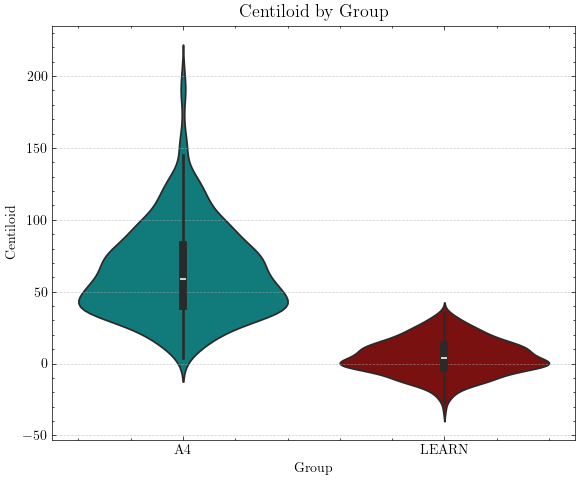

In [32]:
rename_dict_violin = {"group_label": "Group", "centiloid": "Centiloid"}
df_plot = df.rename(columns=rename_dict_violin)

plt.figure(figsize=(6, 5))
sns.violinplot(data=df_plot, x="Group", y="Centiloid", inner="box", palette=custom_palette)
plt.title("Centiloid by Group", fontsize=13, weight='bold')
plt.xlabel("Group")
plt.ylabel("Centiloid")
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("violinplot_centiloid_by_group.pdf")

Check if centiloid is a good predictor of group classification applying a t-test (statistical analysis).

In [33]:
# Get the two groups
groups = df["group_label"].unique()
g1, g2 = groups[0], groups[1]

# Extract centiloid values for each group
v1 = df[df["group_label"] == g1]["centiloid"]
v2 = df[df["group_label"] == g2]["centiloid"]

# Check if the two groups have equal variance using Levene's test
_, p_val_var = stats.levene(v1, v2)
if p_val_var < 0.05: # If the result of the Levene's test is < 0.05, the variance between both groups is not equal
    equal_var = False
else:
    equal_var = True

# T-test
t_stat, p_val = ttest_ind(v1, v2, equal_var=equal_var) # Welch's t-test (unequal variance)

print("Group Summary")
print(f"{g1}: N = {len(v1)}, Mean = {v1.mean():.2f}, SD = {v1.std():.2f}")
print(f"{g2}: N = {len(v2)}, Mean = {v2.mean():.2f}, SD = {v2.std():.2f}")
print(f"Difference in means: {v1.mean() - v2.mean():.2f}")

print("\nStatistical Test Results")
print(f"Levene’s test for equal variance: p = {p_val_var:.4f} → Equal variance assumed: {equal_var}")
print(f"T-statistic: {t_stat:.4f}")
print(f"p-value: {p_val:.2e}")

Group Summary
A4: N = 896, Mean = 64.19, SD = 32.08
LEARN: N = 395, Mean = 4.62, SD = 12.23
Difference in means: 59.57

Statistical Test Results
Levene’s test for equal variance: p = 0.0000 → Equal variance assumed: False
T-statistic: 48.2088
p-value: 4.42e-289


The centiloid measure almost perfectly separates the two groups.
It's a highly predictive variable and ideal for use in a classification model

#### Classification of Group Using Centiloid as Predictor

For these first analysis that use a single classification model, SVM is the one applied, as it is the most simple and one of the best ones, as it is seen in further steps.

In [34]:
class_labels = [group_mapping[i] for i in sorted(group_mapping.keys())]

In [35]:
def group_classification_based_centiloid(df, group_mapping, title):
    X = df[["centiloid"]]
    y = df["group_label"]

    model = SVC()
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=44)

    # Get predicted probabilities from CV
    y_pred_cv = cross_val_predict(model, X, y, cv=cv)

    # Get predicted labels
    class_labels = [group_mapping.get(cls, cls) for cls in sorted(df["group_label"].unique())]

    # Classification metrics
    print("Classification Report:")
    print(classification_report(y, y_pred_cv, target_names=class_labels))

    # Confusion matrix
    cm = confusion_matrix(y, y_pred_cv)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap="YlGn",
                xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel("Predicted Group")
    plt.ylabel("True Group")
    plt.title(title, fontsize=13, weight='bold')
    plt.tight_layout()
    plt.savefig(title+".pdf")

Classification Report:
              precision    recall  f1-score   support

          A4       0.96      0.94      0.95       896
       LEARN       0.87      0.92      0.90       395

    accuracy                           0.93      1291
   macro avg       0.92      0.93      0.92      1291
weighted avg       0.94      0.93      0.94      1291



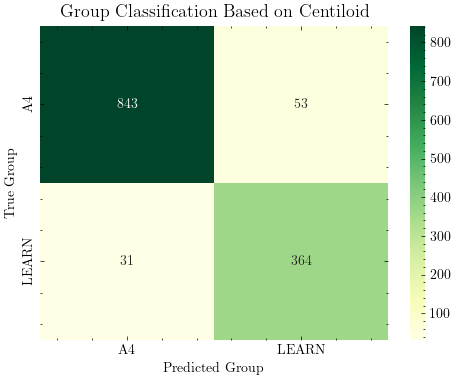

In [36]:
group_classification_based_centiloid(df, group_mapping, title="Group Classification Based on Centiloid")

It can be seen that the different metrics are great. However, it will be seen if it can be improved a bit.

#### Combination of features as predictors

It is checked if the sum/combination of different features of the same type (continous) improves the model's performance.


Accuracy for Centiloid (alone): 0.93

Accuracy for Centiloid + Cognition Score: 0.93

Accuracy for Centiloid + Age: 0.93

Accuracy for Centiloid + Cognition Score + Age: 0.93


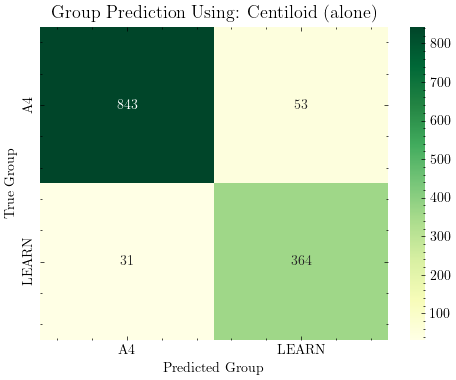

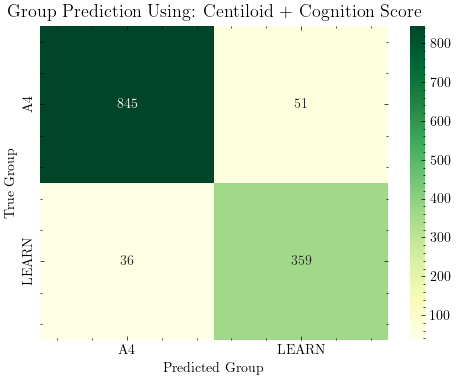

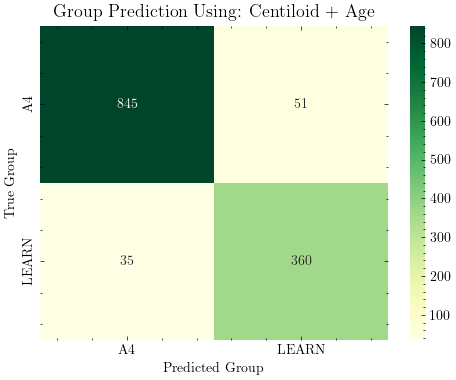

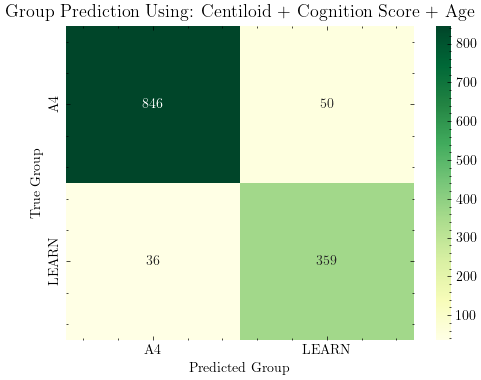

In [37]:
# Define combinations of features
feature_sets = {
    "Centiloid (alone)": ["centiloid"],
    "Centiloid + Cognition Score": ["centiloid", "PACCRN"],
    "Centiloid + Age": ["centiloid", "PTAGE"],
    "Centiloid + Cognition Score + Age": ["centiloid", "PACCRN", "PTAGE"]
}

results = []
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=44)

# Loop through each feature set
for label, features in feature_sets.items():
    df_sets = df[["group_label"] + features]
    X = df_sets[features]  # It's already [[]]
    y = df_sets["group_label"]

    model = SVC()

    # Cross-validated predictions
    y_pred = cross_val_predict(model, X, y, cv=cv)

    # Accuracy
    acc = accuracy_score(y, y_pred)
    print(f"\nAccuracy for {label}: {acc:.2f}")

    # Plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap="YlGn",
                xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel("Predicted Group")
    plt.ylabel("True Group")
    plt.title(f"Group Prediction Using: {label}", fontsize=13, weight='bold')
    plt.tight_layout()
    
    # Save each confusion matrix as PDF
    label_clean = label.replace(" ", "_").replace("+", "plus").replace("(", "").replace(")", "").replace("-", "")
    plt.savefig(f"confusion_matrix_{label_clean}.pdf")

It can be seen that adding features doesn't improve the model (results are more or less the same), but increases its computational cost.

So this alternative is discarded.

#### Overlapping handling

Now it is checked if eliminating the overlapping of groups in histogram boosts the performance.

Overlapping visualization. In this case sample size is not taken into account, as both classes are a bit unbalanced.

In [38]:
def plot_histogram_overlapping(df, title):

    # Rename columns for prettier axis and legend labels
    df_plot = df.rename(columns=rename_dict)
    plt.figure(figsize=(7, 5))
   
    # Plot overlapping histograms of 'Centiloid' by 'Group', using density to compare distributions
    ax = sns.histplot(
        data=df_plot,
        x="Centiloid",
        hue="Group",
        bins=40,
        kde=True,              # Add kernel density estimate
        element="step",        # Use step style
        stat="density",        # Area under each histogram = 1, making group sizes comparable
        palette=custom_palette
    )

    plt.title(title)
    plt.xlabel("Centiloid")
    plt.ylabel("Density")
    plt.grid(True)

    leg = ax.get_legend()
    leg.set_title("Group")
    leg.get_frame().set_facecolor('white')
    leg.get_frame().set_edgecolor('black')
    leg.get_frame().set_alpha(0.85)

    plt.tight_layout()
    plt.savefig(title+".pdf")

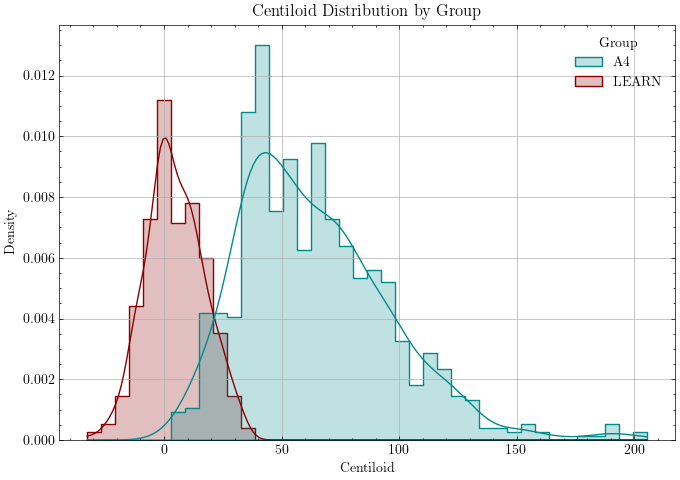

In [39]:
plot_histogram_overlapping(df, title="Centiloid Distribution by Group")

Different cut-off values for both groups are set and computed to search for the best possible combination

In [40]:
# Cutoff values to explore
min_cut_values = [0, 5, 10, 15, 20, 25, 30] # for A4
max_cut_values = [25, 30, 35, 40] # for LEARN

overlapping_results = []
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=44)

for min_cut in min_cut_values:
    for max_cut in max_cut_values:

        # Filter data
        # Keep:
        # - A4 with centiloid ≥ min_cut
        # - LEARN with centiloid ≤ max_cut
        df_filtered = df[
            ((df["group_label"] == "A4") & (df["centiloid"] >= min_cut)) |
            ((df["group_label"] == "LEARN") & (df["centiloid"] <= max_cut))
        ]

        # Count eliminations
        total = len(df)
        total_filtered = len(df_filtered)

        a4_total = (df["group_label"] == "A4").sum()
        learn_total = (df["group_label"] == "LEARN").sum()

        a4_remaining = (df_filtered["group_label"] == "A4").sum()
        learn_remaining = (df_filtered["group_label"] == "LEARN").sum()

        a4_removed = a4_total - a4_remaining
        learn_removed = learn_total - learn_remaining
        total_removed = total - total_filtered

        # Classification
        X = df_filtered[["centiloid"]]
        y = df_filtered["group"]

        model = SVC()
        y_pred_cv = cross_val_predict(model, X, y, cv=cv)
        acc = accuracy_score(y, y_pred_cv)

        # Store in the results
        overlapping_results.append({
            "Min": min_cut,
            "Max": max_cut,
            "Total Removed": total_removed,
            "A4% Rem": round(100 * a4_removed / a4_total, 1),
            "LEARN% Rem": round(100 * learn_removed / learn_total, 1),
            "Total% Rem": round(100 * total_removed / total, 1),
            "Accuracy": round(acc, 3)
        })

        # Plot confusion matrix
        '''
        plt.figure(figsize=(4, 3))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                    xticklabels=label_order, yticklabels=label_order)
        plt.title(f"Confusion Matrix\nMin: {min_cut}, Max: {max_cut}")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.tight_layout()
        plt.show()
        '''



# Create summary table
overlapping_df = pd.DataFrame(overlapping_results)
print("Summary by Group and Accuracy:")
print(overlapping_df.sort_values(by="Total% Rem", ascending=False).head(20).to_string(index=False))


Summary by Group and Accuracy:
 Min  Max  Total Removed  A4% Rem  LEARN% Rem  Total% Rem  Accuracy
  30   25            120     10.7         6.1         9.3     1.000
  30   30            104     10.7         2.0         8.1     0.997
  30   35             97     10.7         0.3         7.5     0.991
  30   40             96     10.7         0.0         7.4     0.990
  25   25             87      7.0         6.1         6.7     1.000
  25   30             71      7.0         2.0         5.5     0.984
  25   35             64      7.0         0.3         5.0     0.980
  20   25             63      4.4         6.1         4.9     0.980
  25   40             63      7.0         0.0         4.9     0.976
  15   25             50      2.9         6.1         3.9     0.969
  20   30             47      4.4         2.0         3.6     0.969
  20   35             40      4.4         0.3         3.1     0.963
  20   40             39      4.4         0.0         3.0     0.962
  15   30        

Based on the elimination percentages and accuracy, a threshold of Centiloid ≥ 30 is set for the A4 group: all A4 participants with Centiloid below 30 are excluded, while all LEARN participants are kept regardless of their Centiloid values.

The final sample includes every LEARN subject and only those A4 subjects with Centiloid 30 or higher.

Classification Report:
              precision    recall  f1-score   support

          A4       0.99      1.00      0.99       800
       LEARN       1.00      0.97      0.98       395

    accuracy                           0.99      1195
   macro avg       0.99      0.98      0.99      1195
weighted avg       0.99      0.99      0.99      1195



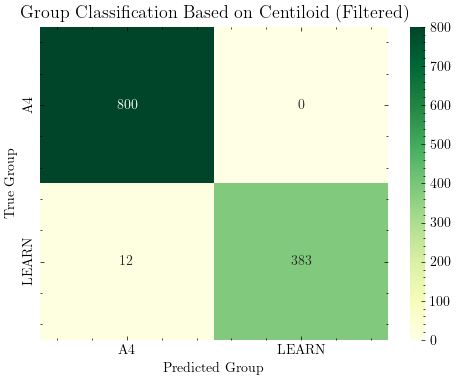

In [41]:
df_filtered = df[
    ((df["group_label"] == "A4") & (df["centiloid"] >= 30)) |
    (df["group_label"] == "LEARN")
]

group_classification_based_centiloid(df_filtered, group_mapping, title="Group Classification Based on Centiloid (Filtered)")

It improves it.

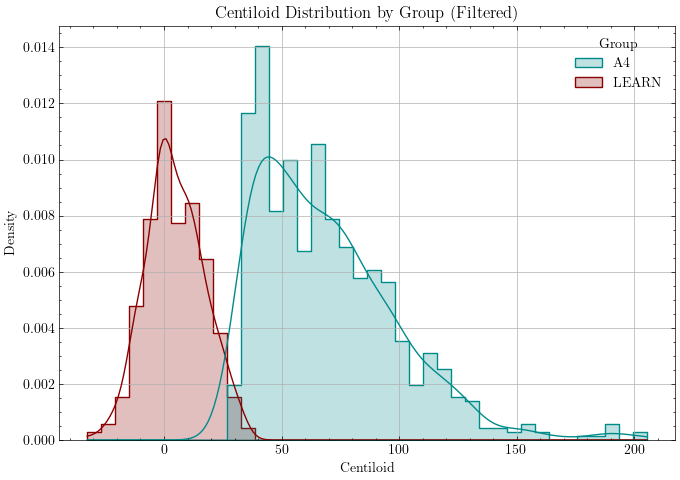

In [42]:
plot_histogram_overlapping(df_filtered, title="Centiloid Distribution by Group (Filtered)")

In further steps it will be verified if it improves the classification and regression methods.

### Continuous variables normalization

In [43]:
scaler = StandardScaler()
df[continuous_variables] = scaler.fit_transform(df[continuous_variables]) # continuous_variables already defined previously

Apply the same to the filtered one

In [44]:
scaler = StandardScaler()
df_filtered[continuous_variables] = scaler.fit_transform(df_filtered[continuous_variables])

C:\Users\satcr\AppData\Local\Temp\ipykernel_8772\2931369755.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered[continuous_variables] = scaler.fit_transform(df_filtered[continuous_variables])


### Classification and Regression Pipeline

Lists with the different features sets that will be used later are defined

In [45]:
individual_feature_set = [
    'Fcorr',
    'Pcorr',
    'Fcorr_regres',
    'Pcorr_regres',
    'amp',
    'amp2'
]

aggregated_feature_set = [
    'Fcorr_amp',
    'Pcorr_amp',
    'Fcorr_Pcorr_amp',
    'Fcorr_Pcorr_amp_amp2'
]

binary_variables = ["group", "PTGENDER"]

Functions to extract the features defined before are defined

In [46]:
def select_sum_features(df, feature_set):

    fcorr = [col for col in df.columns if col.startswith("fslnets_Fcorr_") and "regres" not in col]
    pcorr = [col for col in df.columns if col.startswith("fslnets_Pcorr_") and "regres" not in col]
    amp = [col for col in df.columns if col.startswith("fslnets_amp_")]
    amp2 = [col for col in df.columns if col.startswith("fslnets_amp2_")]

    if feature_set == 'Fcorr_amp':
        cols = fcorr + amp
    elif feature_set == 'Pcorr_amp':
        cols = pcorr + amp
    elif feature_set == 'Fcorr_Pcorr_amp':
        cols = fcorr + pcorr + amp
    elif feature_set == 'Fcorr_Pcorr_amp_amp2':
        cols = fcorr + pcorr + amp + amp2
    else:
        cols = []
    return df[cols].values

In [47]:
# Check the shape of the selected features
for fs in ['Fcorr_amp', 'Pcorr_amp', 'Fcorr_Pcorr_amp', 'Fcorr_Pcorr_amp_amp2']:
    X = select_sum_features(df, fs)
    print(f"{fs} → shape: {X.shape}")

Fcorr_amp → shape: (1291, 210)
Pcorr_amp → shape: (1291, 210)
Fcorr_Pcorr_amp → shape: (1291, 400)
Fcorr_Pcorr_amp_amp2 → shape: (1291, 420)


In [48]:
def select_individual_features(df, feature_set):

    if feature_set == 'Fcorr':
        cols = [col for col in df.columns if col.startswith("fslnets_Fcorr_") and not col.startswith("fslnets_Fcorr_regres_")]
    elif feature_set == 'Pcorr':
        cols = [col for col in df.columns if col.startswith("fslnets_Pcorr_") and not col.startswith("fslnets_Pcorr_regres_")]
    elif feature_set == 'Fcorr_regres':
        cols = [col for col in df.columns if col.startswith("fslnets_Fcorr_regres_")]
    elif feature_set == 'Pcorr_regres':
        cols = [col for col in df.columns if col.startswith("fslnets_Pcorr_regres_")]
    elif feature_set == 'amp':
        cols = [col for col in df.columns if col.startswith("fslnets_amp_ic")]
    elif feature_set == 'amp2':
        cols = [col for col in df.columns if col.startswith("fslnets_amp2_ic")]
    else:
        cols = []

    return df[cols].values

In [49]:
def compare_datasets(df1, df2, classification_targets, regression_targets, feature_set):
    '''
    A function to compare the performance on classification (SVM) and regression (LR) of two different datasets, one of them filtered.
    For regression, R2 is also computed.
    '''
    
    datasets = {"Original": df1, "Filtered": df2}
    results = []

    for name, df in datasets.items():
        X = select_individual_features(df, feature_set)

        # Classification
        for target_class in classification_targets:
            y_class = df[target_class]
            skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=44)
            svm = SVC()
            score = cross_val_score(svm, X, y_class, cv=skf, scoring='accuracy')
            acc = score.mean()
            std = score.std()
            results.append({
                "Task": "Classification",
                "Target": target_class,
                "Model": "SVM",
                "Metric": "Accuracy",
                "Mean": acc,
                "Std": std,
                "Dataset": name,
                "FeatureSet": feature_set,
                "R2_Mean": "",
                "R2_Std": ""
            })

        if regression_targets != None:
            # Regression
            for target_reg in regression_targets:
                y_reg = df[target_reg]
                kf = KFold(n_splits=5, shuffle=True, random_state=44)
                rfr = LinearRegression()

                # RMSE
                neg_rmse_scores = cross_val_score(rfr, X, y_reg, cv=kf, scoring="neg_root_mean_squared_error")
                rmse_scores = -neg_rmse_scores
                rmse_mean = rmse_scores.mean()
                rmse_std = rmse_scores.std()

                # R2
                r2_scores = cross_val_score(rfr, X, y_reg, cv=kf, scoring="r2")
                r2_mean = r2_scores.mean()
                r2_std = r2_scores.std()

                results.append({
                    "Task": "Regression",
                    "Target": target_reg,
                    "Model": "Linear Regression",
                    "Metric": "RMSE",
                    "Mean": rmse_mean,
                    "Std": rmse_std,
                    "Dataset": name,
                    "FeatureSet": feature_set,
                    "R2_Mean": r2_mean,
                    "R2_Std": r2_std
                })

    return pd.DataFrame(results)

#### Overall Performance Comparison of the Filtered Dataset

The performance of the previously filtered dataset is compared with the original one.

In [50]:
comparison_results = []

for feature_set in individual_feature_set:
    result = compare_datasets(
        df, df_filtered,
        binary_variables,
        continuous_variables,
        feature_set
    )
    comparison_results.append(result)

comparison_results_df = pd.concat(comparison_results, ignore_index=True)

In [51]:
clean_names = {
        "PTAGE": "Age",
        "centiloid": "Centiloid",
        "PACCRN": "Cognitive Score",
        "group": "Group",
        "PTGENDER": "Gender"
    }

In [52]:
def plot_comparison_dataframes(comparison_df, hue_order, palette):

    for (task, target), df_t in comparison_df.groupby(["Task", "Target"]):
        # Pivot
        mean_pivot = df_t.pivot(index="FeatureSet", columns="Dataset", values="Mean")
        std_pivot  = df_t.pivot(index="FeatureSet", columns="Dataset", values="Std")
        r2_pivot   = df_t.pivot(index="FeatureSet", columns="Dataset", values="R2_Mean")
        r2std_pivot= df_t.pivot(index="FeatureSet", columns="Dataset", values="R2_Std")

        feature_sets = mean_pivot.index.tolist()
        datasets     = hue_order
        x = np.arange(len(feature_sets))
        width = 0.8 / len(datasets)

        fig, ax = plt.subplots(figsize=(10, 5))
        for i, ds in enumerate(datasets):
            means = mean_pivot[ds]
            errs = std_pivot[ds]
            r2s = r2_pivot[ds] if task == "Regression" else ["" for _ in means]
            r2_errs = r2std_pivot[ds] if task == "Regression" else ["" for _ in means]

            bars = ax.bar(
                x + i * width,
                means,
                width,
                label=ds,
                yerr=errs,
                capsize=4,
                color=palette[i],
                zorder=2
            )

            # Annotate inside each bar, vertical and near base
            for bar, m, e, r2, r2e in zip(bars, means, errs, r2s, r2_errs):
                cx = bar.get_x() + bar.get_width()/2
                y_label = bar.get_y() + 0.05 * bar.get_height()  # Slightly above the bottom of the bar

                if task == "Regression" and r2 != "":
                    label = f"{m:.3f}±{e:.3f} ($R^2$ = {float(r2):.3f}±{float(r2e):.3f})"
                else:
                    label = f"{m:.3f}±{e:.3f}"

                ax.text(
                    cx, y_label,
                    label,
                    ha="center", va="bottom",
                    rotation=90,
                    color="black",
                    fontsize=10,
                    clip_on=True,
                    zorder=5
                )

        # Formatting
        ax.set_xticks(x + width * (len(datasets) - 1) / 2)
        ax.set_xticklabels(feature_sets, rotation=45, ha="right")

        if task == "Classification":
            ax.set_ylim(0, 1)
            ylabel = "Accuracy"
            metric = "Accuracy"
        else:
            ylabel = "RMSE"
            metric = "RMSE"
            y0, y1 = ax.get_ylim()
            ax.set_ylim(y0, y1 * 1.15)

        # Clean target name
        pretty_target = clean_names.get(target, str(target))
        ax.set_ylabel(ylabel)
        ax.set_title(f"{metric} for '{pretty_target}' (Mean ± Std over 5 folds)")
        ax.grid(axis="y", linestyle="--", alpha=0.6)
        ax.legend(title="Dataset", loc="upper right")
        plt.tight_layout()
        safe_target = str(target).replace(" ", "_").replace("/", "_")
        plt.savefig(f"comparison_{task}_{safe_target}.pdf")
        plt.show()


In [53]:
comparison_palette = ["MediumAquamarine", "LightSalmon"]

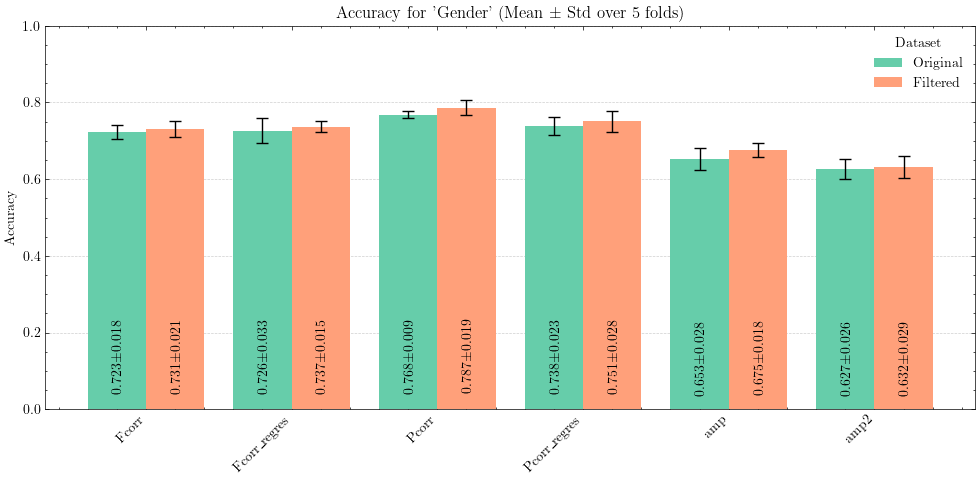

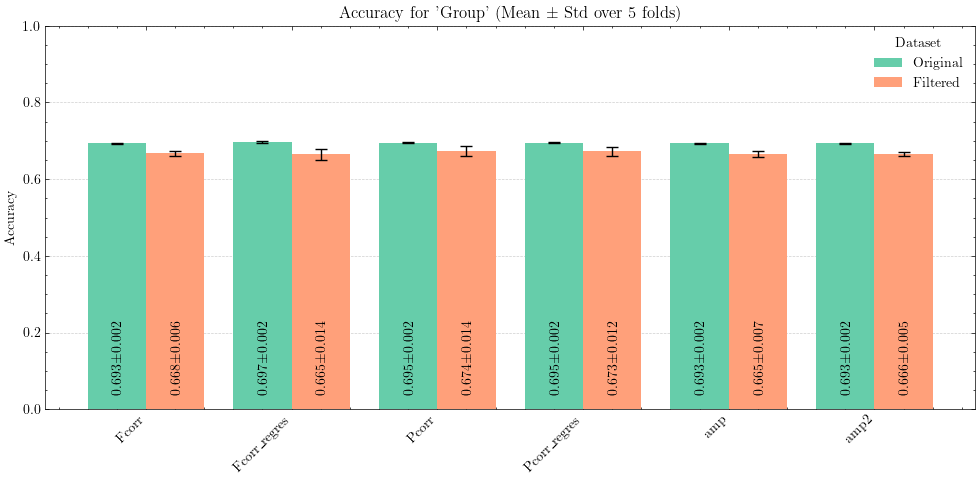

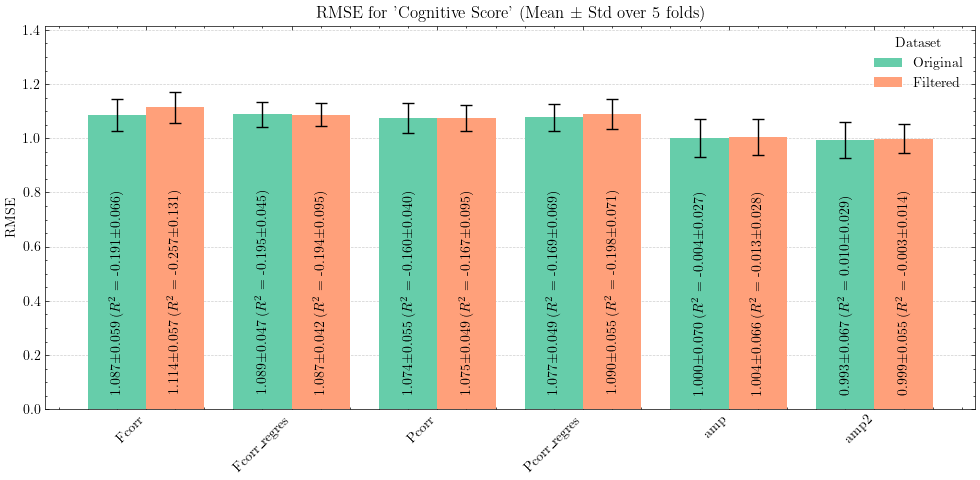

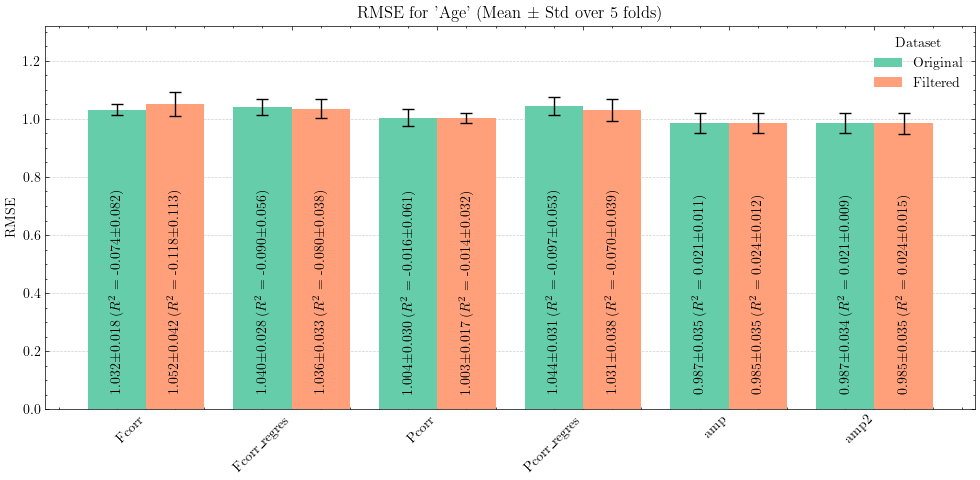

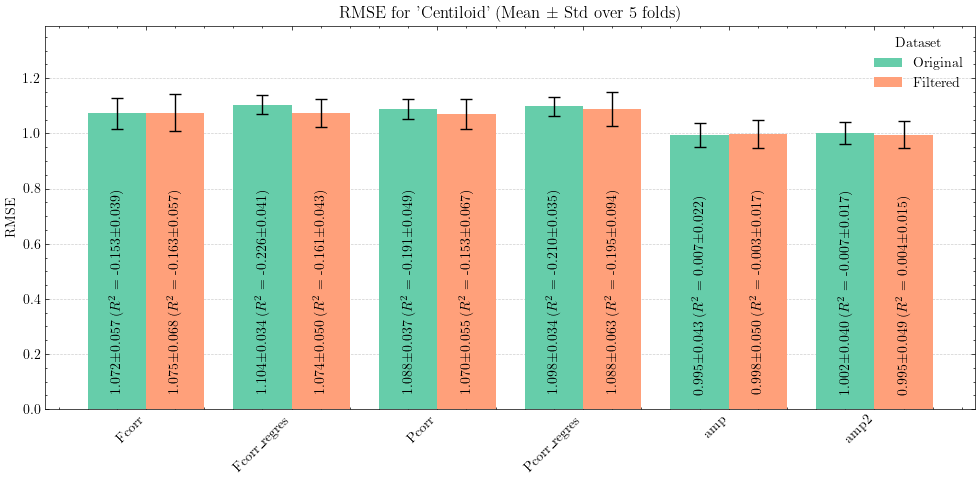

In [54]:
plot_comparison_dataframes(comparison_results_df, hue_order = ["Original", "Filtered"], palette=comparison_palette)

It doesn't imporve the model overally. However, it can be seen that in the case of gender, accuracy is improved very slightly.

This filtered dataframe is discarded for further analysis while the original dataframe is maintained.

In [55]:
# df = df_filtered.copy()  # Update df to the filtered version for further analysis

#### Undersampling and Oversampling

Verify if applying over and undersampling improves the performance of classification (imbalanced dataset).

In [56]:
def compare_sampling_vs_original(df, classification_targets, feature_set):
    
    sampling_strategies = {
        "Original (No Sampling)": None,
        "Oversampling (SMOTE)": SMOTE(random_state=44),
        "Undersampling (RandomUnderSampler)": RandomUnderSampler(random_state=44)
    }

    results = []

    X = select_individual_features(df, feature_set)

    for target_class in classification_targets:
        y = df[target_class]

        for sampling_name, sampler in sampling_strategies.items():
            skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=44)
            svm = SVC()

            if sampler is not None:
                model = make_pipeline(sampler, svm)
            else:
                model = svm

            scores = cross_val_score(model, X, y, cv=skf, scoring='accuracy')
            acc = scores.mean()
            std = scores.std()

            results.append({
                "Target": target_class,
                "Accuracy": acc,
                "FeatureSet": feature_set,
                "Sampling": sampling_name,
                "Std": std
            })

    return pd.DataFrame(results)

In [57]:
comparison_sampling_results = []

for feature_set in individual_feature_set:
    result = compare_sampling_vs_original(
        df,
        binary_variables,
        feature_set
    )
    comparison_sampling_results.append(result)

comparison_sampling_df = pd.concat(comparison_sampling_results, ignore_index=True)

In [58]:
def plot_sampling_results_grid(results_df):

    metric = "Accuracy" if "Accuracy" in results_df.columns else "RMSE"
    y_label = metric

    targets = results_df["Target"].unique()
    for target in targets:
        df_t = results_df[results_df["Target"] == target]
        
        # Pivot means and stds
        mean_pivot = df_t.pivot(index="FeatureSet", columns="Sampling", values=metric)
        std_pivot = df_t.pivot(index="FeatureSet", columns="Sampling", values="Std")
        
        feature_sets = mean_pivot.index.tolist()
        strategies = mean_pivot.columns.tolist()
        x = np.arange(len(feature_sets))
        width = 0.8 / len(strategies)
        
        fig, ax = plt.subplots(figsize=(10, 5))
        for i, strat in enumerate(strategies):
            means = mean_pivot[strat]
            errs = std_pivot[strat]
            bars = ax.bar(
                x + i*width,
                means,
                width,
                label=strat,
                yerr=errs,
                capsize=4,
                zorder=2,
                color=sns.color_palette("Set2")[i]
            )
            
            for bar, m, e in zip(bars, means, errs):
                cx = bar.get_x() + bar.get_width() / 2
                ax.text(
                    cx, 0.05 if metric == "Accuracy" else m + e + 0.01,
                    f"{m:.3f}±{e:.3f}",
                    ha="center", va="bottom",
                    rotation=90,
                    color="black",
                    fontsize=10,
                    clip_on=True,
                    zorder=5
                )
        
        # Formatting
        ax.set_xticks(x + width*(len(strategies)-1)/2)
        ax.set_xticklabels(feature_sets, rotation=45, ha="right")
        if metric == "Accuracy":
            ax.set_ylim(0, 1)
        else:
            max_y = (mean_pivot.values + std_pivot.values).max()
            ax.set_ylim(0, max_y * 1.2)
        ax.set_ylabel(y_label)

        # Title
        pretty_target = clean_names.get(target, str(target))
        ax.set_title(f"{y_label} by Sampling Strategy for '{pretty_target}' (Mean ± Std over 5 folds)")
        ax.grid(axis="y", linestyle="--", alpha=0.6)
        ax.legend(title="Sampling")
        safe_target = str(target).replace(" ", "_").replace("/", "_")
        plt.savefig(f"sampling_strategies_{safe_target}.pdf")
        plt.tight_layout()
        plt.show()

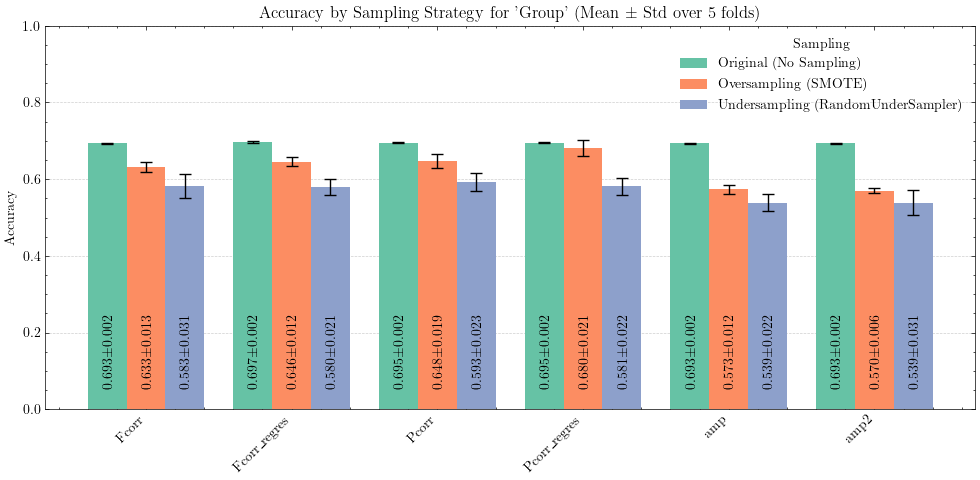

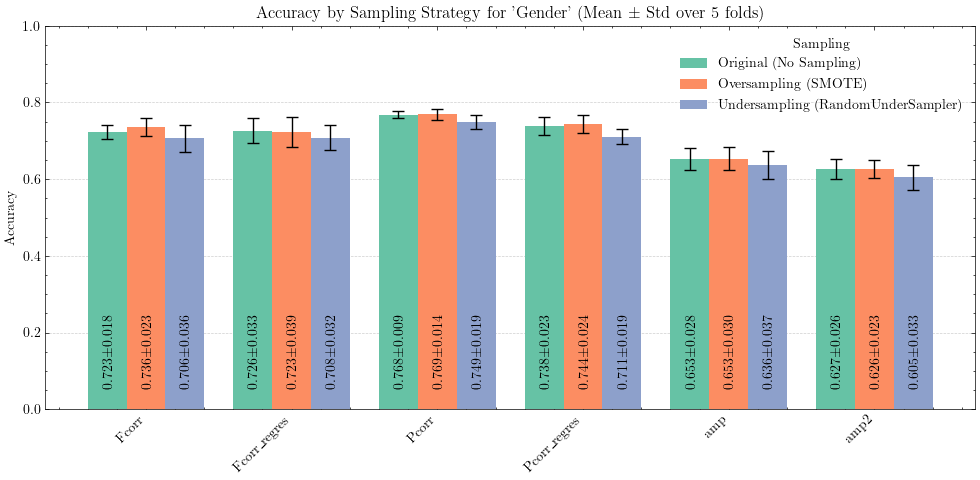

In [59]:
plot_sampling_results_grid(comparison_sampling_df)

Similarly to the previous step, using group as a variable does not improve results—in fact, performance gets worse.

For gender, results remain the same or decline.

It’s also observed that the oversampling method consistently outperforms undersampling.

The original dataset is retained for further analysis.

#### Features adding

See if making summatories of features improves the model

In [60]:
def features_adding_comparison(df, classification_targets, regression_targets, feature_sets):
    results = []

    # Classification targets
    for target in classification_targets:
        for feature_set in feature_sets:
            X = select_sum_features(df, feature_set)
            y = df[target]
            cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=44)
            model = SVC()
            score = cross_val_score(model, X, y, cv=cv, scoring="accuracy")
            acc = score.mean()
            std = score.std()
            results.append({
                'Target': target,
                'feature_set': feature_set,
                'accuracy': acc,
                'std': std
            })
    
    # Regression targets
    for target in regression_targets:
        for feature_set in feature_sets:   
            X = select_sum_features(df, feature_set)
            y = df[target]
            cv = KFold(n_splits=5, shuffle=True, random_state=44)
            model = LinearRegression()
            score = -cross_val_score(model, X, y, cv=cv, scoring="neg_mean_absolute_error")
            mae = score.mean()
            std = score.std()
            results.append({
                'Target': target,
                'feature_set': feature_set,
                'mae': mae,
                'std': std
            })

    return pd.DataFrame(results)

In [61]:
features_adding_results = features_adding_comparison(df, binary_variables, continuous_variables, aggregated_feature_set)

In [62]:
print(features_adding_results.to_string())

       Target           feature_set  accuracy       std       mae
0       group             Fcorr_amp  0.693260  0.001730       NaN
1       group             Pcorr_amp  0.694810  0.001504       NaN
2       group       Fcorr_Pcorr_amp  0.695585  0.001760       NaN
3       group  Fcorr_Pcorr_amp_amp2  0.695585  0.001760       NaN
4    PTGENDER             Fcorr_amp  0.723453  0.017507       NaN
5    PTGENDER             Pcorr_amp  0.768391  0.009438       NaN
6    PTGENDER       Fcorr_Pcorr_amp  0.741274  0.012342       NaN
7    PTGENDER  Fcorr_Pcorr_amp_amp2  0.741274  0.012342       NaN
8       PTAGE             Fcorr_amp       NaN  0.029672  0.843959
9       PTAGE             Pcorr_amp       NaN  0.011870  0.820106
10      PTAGE       Fcorr_Pcorr_amp       NaN  0.020970  0.913294
11      PTAGE  Fcorr_Pcorr_amp_amp2       NaN  0.029317  0.922466
12  centiloid             Fcorr_amp       NaN  0.050030  0.854774
13  centiloid             Pcorr_amp       NaN  0.021552  0.870179
14  centil

As it can be seen in the results, there is no improvement adding features, so it is discarded for further analysis.

#### PCA (Dimensionality reduction)

PCA helps reduce the number of features in the data, making models less likely to overfit or be affected by noise, aiming to keep most of the important information while making the data more manageable.

The process includes:

- Running PCA on different feature sets to reduce dimensionality.

- Comparing how various PCA strategies (keeping enough components to explain 95% of variance, or keeping just the top 2 components) affect the performance of models.

- Visualizing how much variance is explained by each principal component using scree plots.

- Summarizing the results of different PCA strategies across tasks and feature sets.

In [63]:
def plot_scree_overlay_connectivity(pca_objs, feature_names, n_max=20):
    """
    Scree plots with explained variance ratio for the first 20 PCs of the connectivity (big ones) feature sets.
    """
    plt.figure(figsize=(8, 6))
    for pca_obj, fname in zip(pca_objs, feature_names):
        # Get explained variance by each PC for that feature set
        var_ratio = pca_obj.explained_variance_ratio_
        n_plot = min(n_max, len(var_ratio))
        pcs = np.arange(1, n_plot+1)
        # Plot the variance ratios for the first PCs
        plt.plot(pcs, var_ratio[:n_plot], marker='o', label=fname)
    plt.title(f"Scree Plot (First {n_max} PCs) — Connectivity Features")
    plt.xlabel("Principal Component")
    plt.ylabel("Explained Variance Ratio")
    plt.xticks(np.arange(1, n_max+1))
    plt.legend()
    plt.tight_layout()
    plt.savefig("scree_overlay_connectivity.pdf")
    plt.show()


In [64]:
def plot_scree_overlay_amplitude(pca_objs, feature_names):
    """
    Scree plots for all PCs (16) of the amplitude feature sets.
    """
    plt.figure(figsize=(8, 6))
    for pca_obj, fname in zip(pca_objs, feature_names):
        # Get all explained variance ratios
        var_ratio = pca_obj.explained_variance_ratio_
        n_plot = len(var_ratio)
        pcs = np.arange(1, n_plot+1)
        # Plot all PCs' variance ratios
        plt.plot(pcs, var_ratio, marker='o', label=fname)
    plt.title(f"Scree Plot — Amplitude Features")
    plt.xlabel("Principal Component")
    plt.ylabel("Explained Variance Ratio")
    plt.xticks(np.arange(1, n_plot+1))
    plt.legend()
    plt.tight_layout()
    plt.savefig("scree_overlay_amplitude.pdf")
    plt.show()

In [65]:
def apply_pca(df, n_components=0.95):
    '''
    Apply PCA to the given DataFrame. Returns the transformed data and the PCA object.
    '''
    # Instantiate PCA, specifying number of components (or variance threshold if it is 0.95)
    pca = PCA(n_components=n_components)
    # Fit and transform data to lower dimension
    X_pca = pca.fit_transform(df)
    # Name the new PC columns
    cols = [f"PC{i+1}" for i in range(X_pca.shape[1])]
    df_pca = pd.DataFrame(X_pca, columns=cols, index=df.index)
    # Print summary info
    print(
        f"PCA(n_components={n_components}) → "
        f"{X_pca.shape[1]} components; explained variance: "
        f"{pca.explained_variance_ratio_.sum():.3f}"
    )
    # Return the PCA-transformed dataframe and the PCA object
    return df_pca, pca

In [66]:
def compare_pca_strategies(df, classification_targets, regression_targets, feature_set):
    '''
    Compares different PCA approaches (none, 0.95 variance, 2 PCs) for a given feature set,
    Evaluates performance using cross-validation.
    Returns the results as a DataFrame.
    '''
    # Define PCA strategies: no PCA, enough PCs to explain 95% variance, just 2 PCs
    pca_variants = {
        "Original": None,
        "PCA 0.95": 0.95,
        "PCA 2PCs": 2
    }
    results = []
    # Select features for current set
    X_orig = pd.DataFrame(select_individual_features(df, feature_set), index=df.index)
    for pca_name, n_comp in pca_variants.items():
        # Apply PCA if 0.95 or 2 are the ones
        if n_comp is None:
            X = X_orig
        else:
            pca = PCA(n_components=n_comp)
            X = pca.fit_transform(X_orig)
            # Print info for 95% variance case
            if n_comp == 0.95:
                print(f"{feature_set}: {pca.n_components_} components cover {pca.explained_variance_ratio_.sum():.3f} variance")
        # Classification
        for target_class in classification_targets:
            y = df[target_class]
            skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=44)
            svm = SVC()
            scores = cross_val_score(svm, X, y, cv=skf, scoring='accuracy')
            acc = scores.mean()
            std = scores.std()
            results.append({
                "Task": "Classification",
                "Target": target_class,
                "FeatureSet": feature_set,
                "PCA": pca_name,
                "Metric": "Accuracy",
                "Mean": acc,
                "Std": std
                })
        # Regression
        for target_reg in regression_targets:
            y = df[target_reg]
            kf = KFold(n_splits=5, shuffle=True, random_state=44)
            reg = LinearRegression()
            rmse_scores = -cross_val_score(reg, X, y, cv=kf, scoring="neg_root_mean_squared_error")
            rmse = rmse_scores.mean()
            rmse_std = rmse_scores.std()
            results.append({
                "Task": "Regression",
                "Target": target_reg,
                "FeatureSet": feature_set,
                "PCA": pca_name,
                "Metric": "RMSE",
                "Mean": rmse,
                "Std": rmse_std
            })
    return pd.DataFrame(results)

In [67]:
def plot_pca_comparison_grid(results_df):
    '''
    Creates bar plots comparing model performance for each PCA strategy and feature set, for both classification and regression tasks.
    '''
    targets = results_df["Target"].unique()
    for target in targets:
        df_t = results_df[results_df["Target"] == target]
        tasks = df_t["Task"].unique()
        for task in tasks:
            df_tt = df_t[df_t["Task"] == task]
            mean_pivot = df_tt.pivot(index="FeatureSet", columns="PCA", values="Mean")
            std_pivot  = df_tt.pivot(index="FeatureSet", columns="PCA", values="Std")
            feature_sets = mean_pivot.index.tolist()
            strategies = mean_pivot.columns.tolist()
            x = np.arange(len(feature_sets))
            width = 0.8 / len(strategies)
            fig, ax = plt.subplots(figsize=(10, 5))
            for i, strat in enumerate(strategies):
                means = mean_pivot[strat]
                errs = std_pivot[strat]
                bars = ax.bar(
                    x + i*width,
                    means,
                    width,
                    label=strat,
                    yerr=errs,
                    capsize=4,
                    zorder=2,
                    color=sns.color_palette("Set2")[i]
                )
                # Annotate mean±std only (no R2, no line break)
                for bar, m, e in zip(bars, means, errs):
                    cx = bar.get_x() + bar.get_width() / 2
                    ax.text(
                        cx, 0.05 if task == "Classification" else m + e + 0.01,
                        f"{m:.3f}±{e:.3f}",
                        ha="center", va="bottom",
                        rotation=90,
                        color="black",
                        fontsize=10,
                        clip_on=True,
                        zorder=5
                    )
            # Formatting
            ax.set_xticks(x + width*(len(strategies)-1)/2)
            ax.set_xticklabels(feature_sets, rotation=45, ha="right")
            if task == "Classification":
                ax.set_ylim(0, 1)
                ylabel = "Accuracy"
            else:
                max_y = mean_pivot.values.max() + std_pivot.values.max()
                ax.set_ylim(0, max_y * 1.3)
                ylabel = "RMSE"
            ax.set_ylabel(ylabel)
            pretty_target = clean_names.get(target, str(target))
            ax.set_title(f"{ylabel} by PCA Strategy for '{pretty_target}' (Mean ± Std over 5 folds)")
            ax.grid(axis="y", linestyle="--", alpha=0.6)
            ax.legend(title="PCA")
            safe_target = str(target).replace(" ", "_").replace("/", "_")
            plt.tight_layout()
            plt.savefig(f"pca_strategies_{task}_{safe_target}.pdf")
            plt.show()

In [68]:
def run_full_pca_analysis(df, individual_feature_set, binary_variables, continuous_variables):
    '''
    Runs PCA analyses and comparisons across the different feature sets, creates scree plots, and summarizes/plots the comparison of PCA strategies.
    Returns summary results.
    '''
    # Storage for results and PCA objects
    comparison_pca_results = []
    pca_objs_connectivity = []
    connectivity_names = []
    pca_objs_amplitude = []
    amplitude_names = []

    # Loop over all feature sets
    for feature_set in individual_feature_set:
        # Run PCA strategies and store comparison results
        result = compare_pca_strategies(
            df,
            binary_variables,
            continuous_variables,
            feature_set
        )
        comparison_pca_results.append(result)
        # Fit PCA (0.95) and store PCA object for scree plots
        X = pd.DataFrame(select_individual_features(df, feature_set), index=df.index)
        _, pca_obj = apply_pca(X, n_components=0.95)
        # Store connectivity/amplitude PCA objects for later scree plotting
        if feature_set in ["Fcorr", "Pcorr", "Fcorr_regres", "Pcorr_regres"]:
            pca_objs_connectivity.append(pca_obj)
            connectivity_names.append(feature_set)
        elif feature_set in ["amp", "amp2"]:
            pca_objs_amplitude.append(pca_obj)
            amplitude_names.append(feature_set)

    # Plot scree overlays for connectivity and amplitude sets
    if pca_objs_connectivity:
        plot_scree_overlay_connectivity(pca_objs_connectivity, connectivity_names, n_max=20)
    if pca_objs_amplitude:
        plot_scree_overlay_amplitude(pca_objs_amplitude, amplitude_names)
    # Combine and plot overall PCA strategy comparisons
    comparison_pca_df = pd.concat(comparison_pca_results, ignore_index=True)
    plot_pca_comparison_grid(comparison_pca_df)
    # Return results as DataFrame
    return comparison_pca_df

Fcorr: 114 components cover 0.951 variance
PCA(n_components=0.95) → 114 components; explained variance: 0.951
Pcorr: 150 components cover 0.950 variance
PCA(n_components=0.95) → 150 components; explained variance: 0.950
Fcorr_regres: 129 components cover 0.951 variance
PCA(n_components=0.95) → 129 components; explained variance: 0.951
Pcorr_regres: 154 components cover 0.951 variance
PCA(n_components=0.95) → 154 components; explained variance: 0.951
amp: 16 components cover 0.961 variance
PCA(n_components=0.95) → 16 components; explained variance: 0.961
amp2: 16 components cover 0.958 variance
PCA(n_components=0.95) → 16 components; explained variance: 0.958


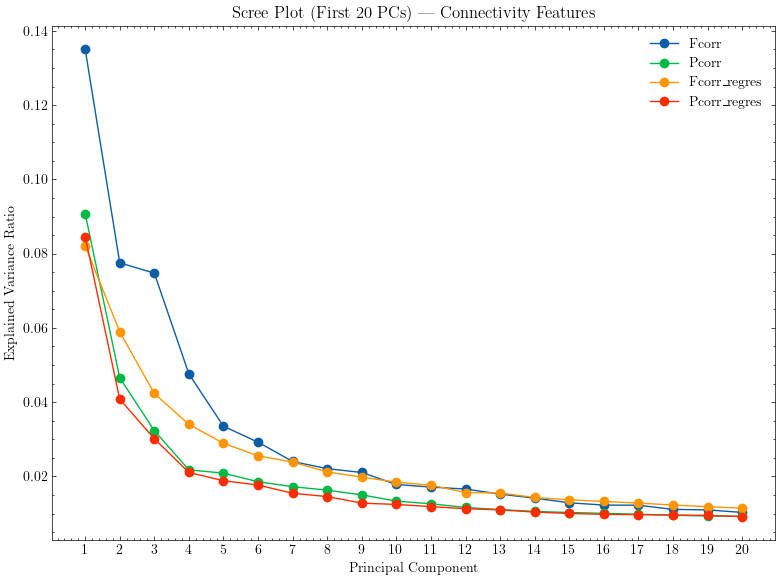

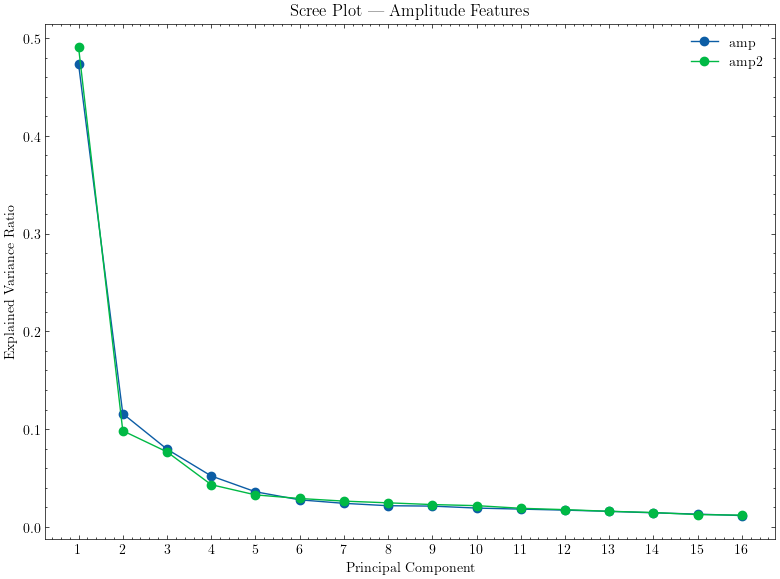

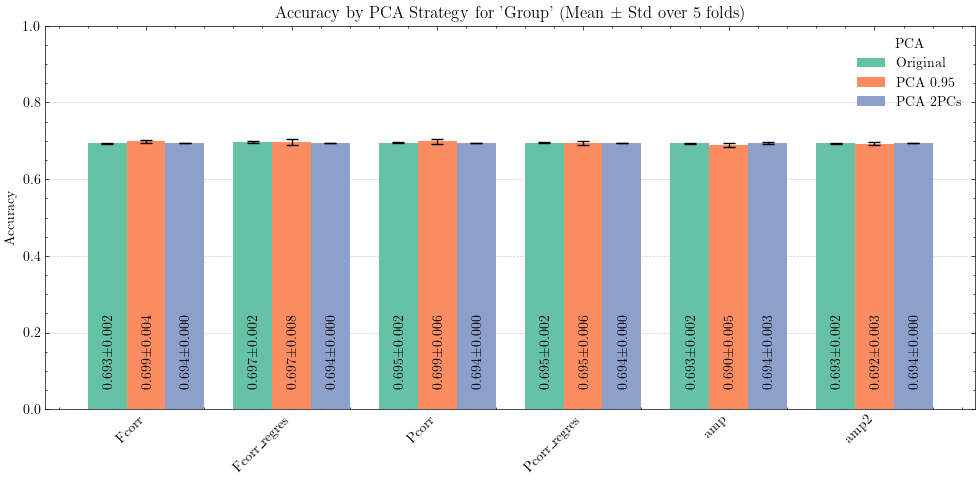

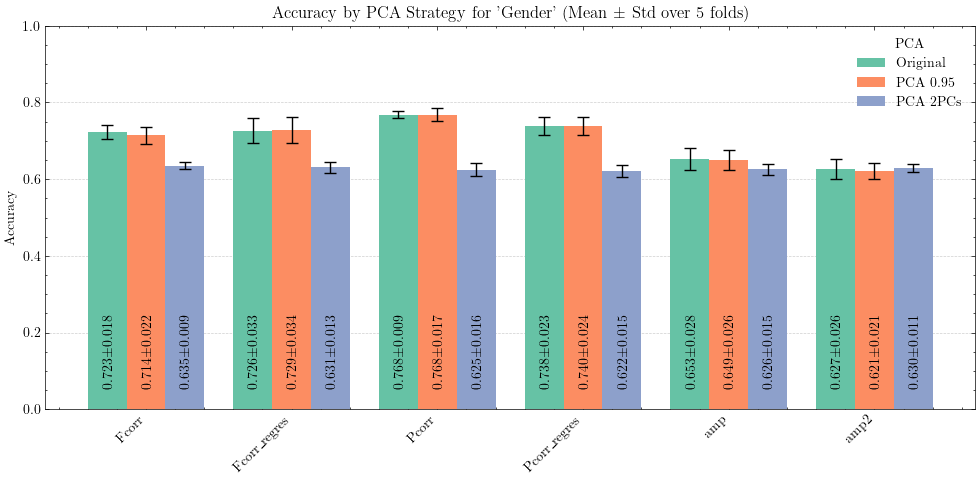

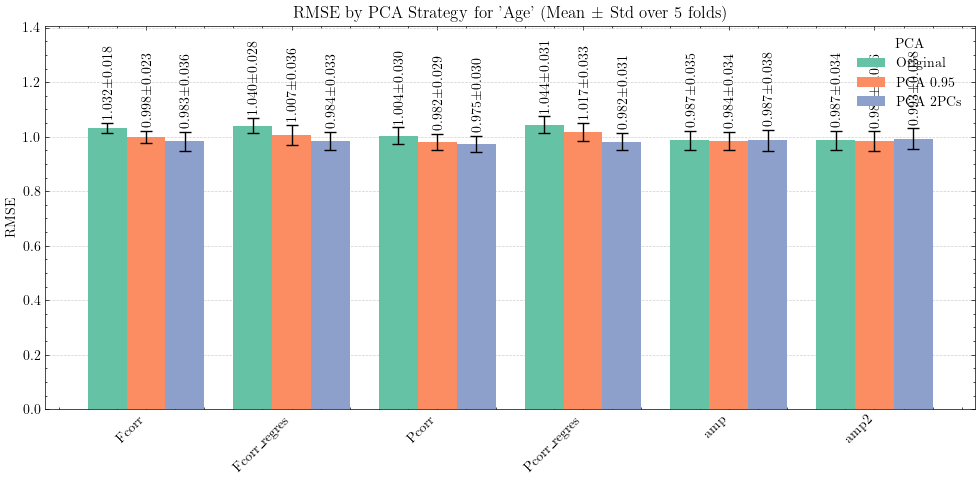

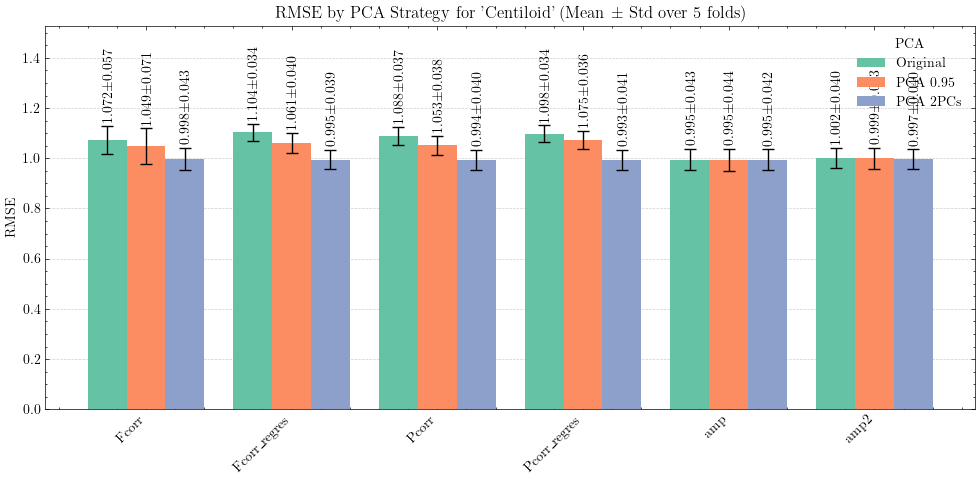

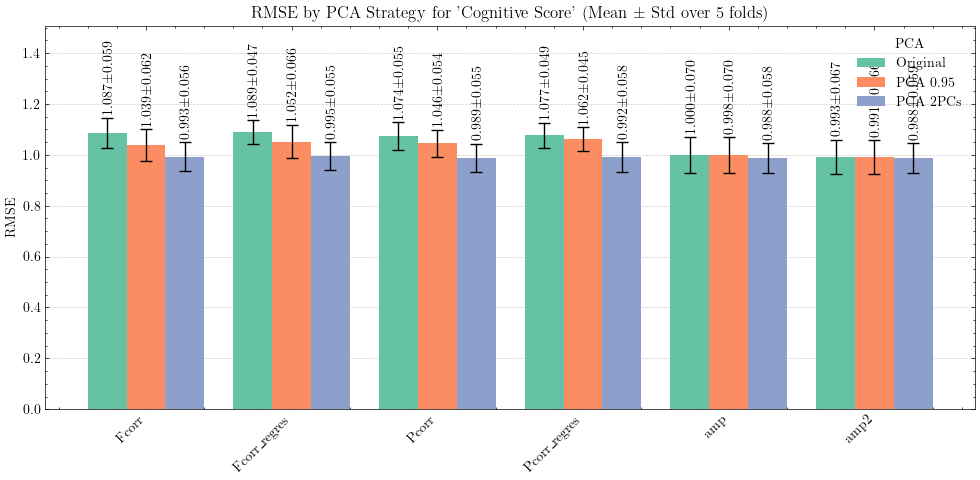

In [69]:
results = run_full_pca_analysis(df, individual_feature_set, binary_variables, continuous_variables)

#### GridSearch

In [70]:
def run_grid_search(X, y, models, param_grids, task):
    '''
    Runs a grid search with cross-validation for multiple models, using the provided parameter grids, and returns their best results.
    '''
    # Choose cross-validation and scoring metric based on task
    if task == "classification":
        cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=44)
        scoring = "accuracy"
    elif task == "regression":
        cv = KFold(n_splits=5, shuffle=True, random_state=44)
        scoring = "neg_root_mean_squared_error"

    results = []
    # Iterate over each model
    for model_name, model in models.items():
        # Set up the grid search for this model and parameter grid
        grid = GridSearchCV(
            estimator=model,
            param_grid=param_grids.get(model_name, {}),
            scoring=scoring,
            cv=cv,
            n_jobs=-1
        )
        # Fit grid search to the data
        grid.fit(X, y)

        best_estimator = grid.best_estimator_
        best_params = grid.best_params_

        # Re-evaluate best estimator with cross-validation for score and std
        if task == "classification":
            score = cross_val_score(best_estimator, X, y, cv=cv, scoring="accuracy")
            mean_score = score.mean()
            std_score = score.std()
        elif task == "regression":
            score = -cross_val_score(best_estimator, X, y, cv=cv, scoring="neg_root_mean_squared_error") # negative RMSE for scoring
            mean_score = score.mean()
            std_score = score.std()
        
        results.append({
            "Model": model_name,
            "Score": mean_score,
            "Std": std_score,
            "BestParams": best_params
        })

    return pd.DataFrame(results)

In [71]:
def evaluate_grid_search(df, feature_sets, targets, models, param_grids, task):
    '''
    Runs grid search for all combinations of feature sets and targets.
    '''
    frames = []
    # Loop over feature sets and targets
    for fs in feature_sets:
        X = select_individual_features(df, fs)
        for target in targets:
            y = df[target]
            # Run grid search for current feature set and target
            res = run_grid_search(X, y, models, param_grids, task)
            # Add identifiers for context
            res["FeatureSet"] = fs
            res["Target"] = target
            frames.append(res)
    # Combine all results into one DataFrame
    return pd.concat(frames, ignore_index=True)

In [72]:
def summarize_results(results_df, task):
    '''
    Formats and summarizes grid search results for easier reporting.
    '''
    # Metric name based on task
    if task == "classification":
        metric = "Accuracy"
    elif task == "regression":
        metric = "RMSE"

    records = []
    # Reformat each row for the summary table
    for _, row in results_df.iterrows():
        records.append({
            "Target":          row["Target"],
            "FeatureSet":      row["FeatureSet"],
            "Model":           row["Model"],
            "Hyperparameters": row["BestParams"],
            metric:            row["Score"],
            "Std":             row["Std"]
        })
    return pd.DataFrame(records)

In [73]:
def plot_grid_search_results(results_df, task):

    palette = "Set2"
    y_label = "Accuracy" if task == "classification" else "RMSE"

    for target in results_df["Target"].unique():
        df_t = results_df[results_df["Target"] == target]

        # Pivot means and stds for plotting
        mean_pivot = df_t.pivot(index="FeatureSet", columns="Model", values="Score")
        std_pivot = df_t.pivot(index="FeatureSet", columns="Model", values="Std")

        feature_sets = mean_pivot.index.tolist()
        models = mean_pivot.columns.tolist()
        x = np.arange(len(feature_sets))
        width = 0.85 / len(models)

        fig, ax = plt.subplots(figsize=(12, 6))
        for i, model in enumerate(models):
            means = mean_pivot[model]
            errs = std_pivot[model]
            bars = ax.bar(
                x + i * width,
                means,
                width,
                label=model,
                yerr=errs,
                capsize=4,
                zorder=2,
                color=sns.color_palette(palette)[i]
            )

            # Annotate mean±std inside each bar, vertical
            for bar, m, e in zip(bars, means, errs):
                cx = bar.get_x() + bar.get_width() / 2
                ax.text(
                    cx, 0.05,
                    f"{m:.3f}±{e:.3f}",
                    ha="center", va="bottom",
                    rotation=90,
                    color="black",
                    fontsize=8,
                    clip_on=True,
                    zorder=5
                )

        ax.set_xticks(x + width * (len(models)-1)/2)
        ax.set_xticklabels(feature_sets, rotation=45, ha="right")
        if task == "regression":
            ax.set_ylim(top=1.5)
        else:
            ax.set_ylim(top=1.0)
        ax.set_ylabel(y_label)
        pretty_target = clean_names.get(target, str(target))
        ax.set_title(f"{y_label} by Model for '{pretty_target}' (Mean ± Std over 5 folds)")
        ax.grid(axis="y", linestyle="--", alpha=0.6)
        
        # Legend outside
        ax.legend(title="Model", bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
        safe_target = str(target).replace(" ", "_").replace("/", "_")
        plt.tight_layout()
        plt.savefig(f"grid_search_{task}_{safe_target}.pdf", bbox_inches='tight')
        plt.show()

##### Classification

In [74]:
classification_models = {
    "SVM": SVC(),
    "Random Forest": RandomForestClassifier(random_state=44),
    "Logistic Regression": LogisticRegression(max_iter=500),
    "Naive Bayes": GaussianNB(),
    "XGBoost": XGBClassifier(random_state=44),
    "MLP": MLPClassifier(max_iter=1000, random_state=44)
}

In [75]:
# Hyperparameter grids for each model
param_grids_classification = {
    "SVM": {
        "C": [0.1, 1, 10],
        "kernel": ["linear", "rbf"]
    },
    "Random Forest": {
        "n_estimators": [100, 200],
        "max_depth": [None, 10]
    },
    "Logistic Regression": {
        "C": [0.1, 1, 10]
    },
    "Naive Bayes": {
        "var_smoothing": [1e-9, 1e-8]
    },
    "XGBoost": {
        "n_estimators": [100, 200],
        "max_depth": [3, 6]
    },
    "MLP": {
        "hidden_layer_sizes": [(64, 32), (128, 64)]
    }
}

In [76]:
classification_results_df = evaluate_grid_search(df, individual_feature_set, binary_variables, classification_models, param_grids_classification, "classification")
print(classification_results_df.to_string(index=False))

              Model    Score      Std                               BestParams   FeatureSet   Target
                SVM 0.694035 0.000473              {'C': 0.1, 'kernel': 'rbf'}        Fcorr    group
      Random Forest 0.696357 0.006372 {'max_depth': None, 'n_estimators': 200}        Fcorr    group
Logistic Regression 0.642890 0.015850                               {'C': 0.1}        Fcorr    group
        Naive Bayes 0.539891 0.032093                 {'var_smoothing': 1e-09}        Fcorr    group
            XGBoost 0.669256 0.017806    {'max_depth': 6, 'n_estimators': 200}        Fcorr    group
                MLP 0.650651 0.027863        {'hidden_layer_sizes': (128, 64)}        Fcorr    group
                SVM 0.725782 0.019210           {'C': 0.1, 'kernel': 'linear'}        Fcorr PTGENDER
      Random Forest 0.687061 0.010309   {'max_depth': 10, 'n_estimators': 200}        Fcorr PTGENDER
Logistic Regression 0.726563 0.025126                               {'C': 0.1}        Fcorr

In [77]:
summary_classification_results_df = summarize_results(classification_results_df, "classification")
print(summary_classification_results_df.to_string(index=False))

  Target   FeatureSet               Model                          Hyperparameters  Accuracy      Std
   group        Fcorr                 SVM              {'C': 0.1, 'kernel': 'rbf'}  0.694035 0.000473
   group        Fcorr       Random Forest {'max_depth': None, 'n_estimators': 200}  0.696357 0.006372
   group        Fcorr Logistic Regression                               {'C': 0.1}  0.642890 0.015850
   group        Fcorr         Naive Bayes                 {'var_smoothing': 1e-09}  0.539891 0.032093
   group        Fcorr             XGBoost    {'max_depth': 6, 'n_estimators': 200}  0.669256 0.017806
   group        Fcorr                 MLP        {'hidden_layer_sizes': (128, 64)}  0.650651 0.027863
PTGENDER        Fcorr                 SVM           {'C': 0.1, 'kernel': 'linear'}  0.725782 0.019210
PTGENDER        Fcorr       Random Forest   {'max_depth': 10, 'n_estimators': 200}  0.687061 0.010309
PTGENDER        Fcorr Logistic Regression                               {'C': 0.1}

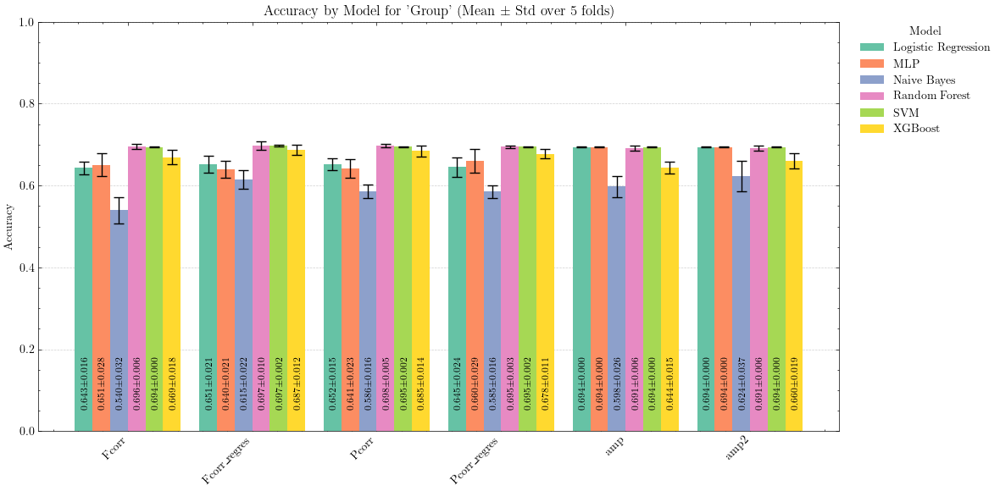

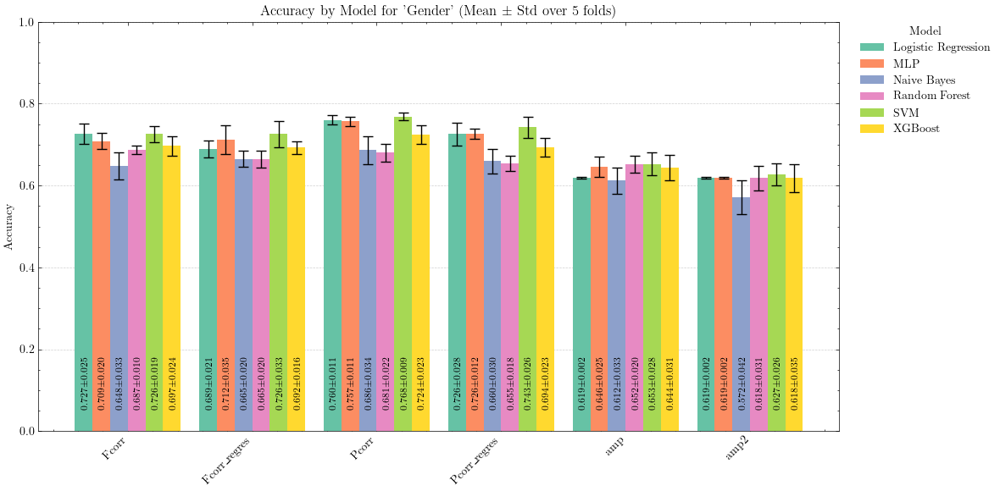

In [78]:
plot_grid_search_results(classification_results_df, "classification")

In [79]:
# Save the classification results to a CSV file
# classification_results_df.to_csv("classification_results.csv", index=False)

#### Explainability: SHAP - Random Forest for 'group'

In [80]:
def plot_feature_importance_matrix(importances, title, output_path):
    '''
    Plots a heatmap of feature importances arranged in a symmetric (region x region) matrix.
    '''
    n_regions=20
    expected_len = (n_regions * (n_regions - 1)) // 2  # 190 for 20 regions
    # Check if the number of importances matches expectation
    if len(importances) != expected_len:
        print(f"Error: Expected {expected_len} importances, but got {len(importances)}.")
        return

    # Initialize an n_regions x n_regions matrix filled with NaN
    mat = np.full((n_regions, n_regions), np.nan)
    # Get lower triangle indices (excluding diagonal)
    tril_indices = np.tril_indices(n_regions, k=-1)
    # Place importances into the lower triangle
    mat[tril_indices] = importances

    # Plot heatmap, masking NaN entries, with region labels on axes
    region_labels = [f'R{i+1}' for i in range(n_regions)]
    plt.figure(figsize=(8, 6))
    sns.heatmap(mat, xticklabels=region_labels, yticklabels=region_labels,
                cmap="viridis", mask=np.isnan(mat), square=True, cbar=True)
    plt.title(title)
    plt.xlabel("Region")
    plt.ylabel("Region")
    plt.tight_layout()
    plt.savefig(output_path)
    plt.show()


In [81]:
def explain_shap(df, summary_df, target="group", k_top=20, output_dir="shap_outputs"):
    """
    For each feature set, trains a RF (with best hyperparameters from GridSearch), computes SHAP values, and generates a SHAP summary plot.
    For target variable "group" and with top20 shap values.
    """

    os.makedirs(output_dir, exist_ok=True)

    # Filter summary to only Random Forest results for the given target
    rf_summary = summary_df[
        (summary_df["Target"] == target) & 
        (summary_df["Model"] == "Random Forest")
    ]

    all_results = []

    for _, row in rf_summary.iterrows():
        feature_set = row["FeatureSet"]
        params = row["Hyperparameters"]

        # Select X and target y for this feature set
        X = select_individual_features(df, feature_set)
        y = df[target].values

        # Generate feature names
        feature_names = [f"{feature_set}_{i}" for i in range(X.shape[1])]

        # Train RF with best hyperparameters
        model = RandomForestClassifier(**params, random_state=44)
        model.fit(X, y)

        # Compute SHAP values
        explainer = shap.TreeExplainer(model)
        shap_values = explainer.shap_values(X)

        # Get the correspondant shap values (in this case, for class 1)
        shap_values_filtered = shap_values[:, :, 1]

        # SHAP summary plot (for class 1)
        shap.summary_plot(
            shap_values_filtered, X, feature_names=feature_names, show=False
        )
        plt.title(f"SHAP summary - Feature set: {feature_set} | Target: {target}")
        plt.tight_layout()
        plt.savefig(f"{output_dir}/shap_summary_{feature_set}.pdf")
        plt.close()

        # Calculate mean(|SHAP|) importance for each feature
        mean_abs_shap = np.abs(shap_values_filtered).mean(axis=0)
        top_k_idx = np.argsort(mean_abs_shap)[-k_top:][::-1]
        top_k_features = [feature_names[i] for i in top_k_idx]
        top_k_values = mean_abs_shap[top_k_idx]

        # Save top-K features to CSV
        df_top_k = pd.DataFrame({
            "Feature": top_k_features,
            "Mean|SHAP|": top_k_values
        })

        # Collect results for global summary
        df_top_k["FeatureSet"] = feature_set
        all_results.append(df_top_k)

        # Heatmap for connectivity features
        if feature_set in ["Fcorr", "Pcorr", "Fcorr_regres", "Pcorr_regres"]:
            title = f"Feature Importance Matrix of {feature_set} for {target}"
            output_path = f"{output_dir}/shap_importance_matrix_{feature_set}.pdf"
            plot_feature_importance_matrix(mean_abs_shap, title, output_path=output_path)


    # Combine all top-Ks into a single summary df
    df_all_top = pd.concat(all_results, ignore_index=True)
    return df_all_top

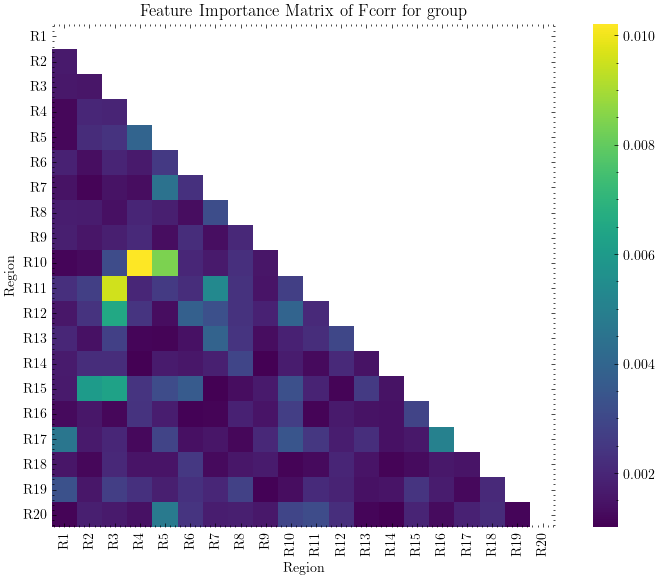

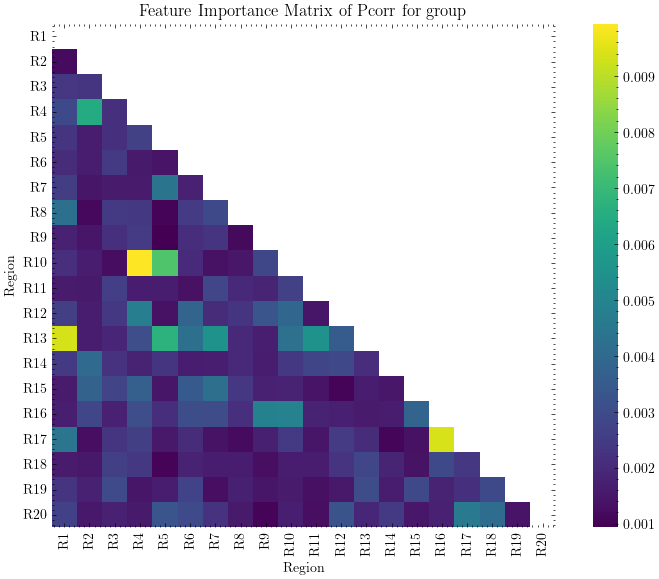

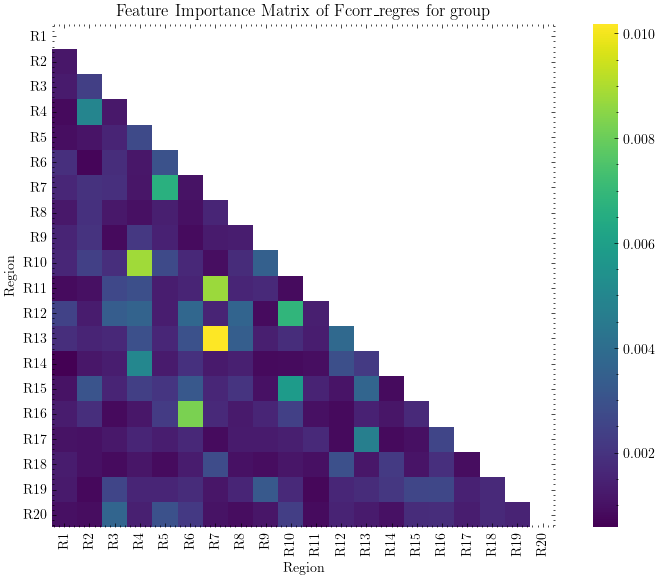

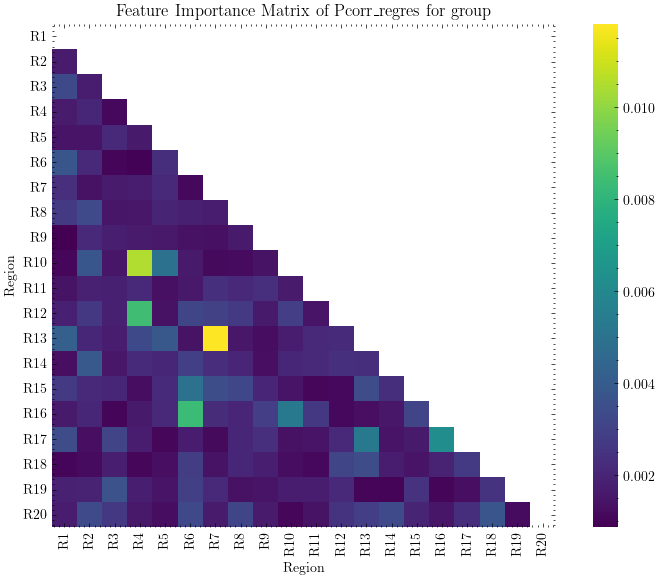

In [82]:
shap_summary = explain_shap(df, summary_classification_results_df)

#### MCNEMAR test (only for classification)

McNemar’s test is a simple way to see if two models really make different kinds of mistakes on the same data.

It looks at where one model gets the answer right but the other gets it wrong, and checks if that happens much more often for one model than the other. If so, it suggests one model is actually better in those situations—not just by chance.

In [83]:
# Build the best pipeline for any possible combination of model+features based on the results of the grid search and PCA
# Now it will be used only for classification models, but it can be extended to regression models as well

def build_best_pipeline(grid_search_results_df, target, feature_set, model_name, task):
    """
    Build a sklearn Pipeline selecting the best parameters and PCA according to a previous grid search for classification or regression.

    Parameters:
        grid_search_results_df - DataFrame with grid search results, including best parameters
        target                 - target variable to match
        feature_set            - which feature set to match
        model_name             - model type to use (e.g., 'SVM', 'Random Forest', etc.)
        task                   - "classification" or "regression"

    Returns:
        sklearn Pipeline with the selected model using its best hyperparameters.
    """
    
    # Filter the grid search results for the specific target, feature set, and model
    row = grid_search_results_df[
        (grid_search_results_df["Target"] == target) &
        (grid_search_results_df["FeatureSet"] == feature_set) &
        (grid_search_results_df["Model"] == model_name)
    ].iloc[0]

    # Copy best parameters
    best_params = row["BestParams"].copy()

    # Filter only the model__ parameters
    model_kwargs = {}
    for full_param, value in best_params.items():
        if full_param.startswith("model__"):
            # Remove the 'model__' prefix to get the actual parameter name
            clean_name = full_param[len("model__"):]
            model_kwargs[clean_name] = value

    # Instantiate the base estimator
    if task == "classification":
        if model_name == "SVM":
            estimator = SVC(**model_kwargs, probability=True, random_state=44) # probability=True for cross_val_predict, needed for soft‐voting ensemble in further steps
        elif model_name == "Random Forest":
            estimator = RandomForestClassifier(**model_kwargs, random_state=44)
        elif model_name == "Logistic Regression":
            estimator = LogisticRegression(**model_kwargs, max_iter=500, random_state=44)
        elif model_name == "Naive Bayes":
            estimator = GaussianNB(**model_kwargs)
        elif model_name == "XGBoost":
            estimator = XGBClassifier(**model_kwargs, eval_metric="logloss", random_state=44)
        elif model_name == "MLP":
            estimator = MLPClassifier(**model_kwargs, max_iter=500, random_state=44)
        else:
            raise ValueError(f"Unknown classification model: {model_name!r}")

    elif task == "regression":
        if model_name == "Linear Regression":
            estimator = LinearRegression(**model_kwargs)
        elif model_name == "ElasticNet":
            estimator = ElasticNet(**model_kwargs, random_state=44)
        elif model_name == "Random Forest Regressor":
            estimator = RandomForestRegressor(**model_kwargs, random_state=44)
        elif model_name == "XGBoost Regressor":
            estimator = XGBRegressor(**model_kwargs, objective="reg:squarederror", random_state=44)
        elif model_name == "MLP Regressor":
            estimator = MLPRegressor(**model_kwargs, max_iter=500, random_state=44)
        else:
            raise ValueError(f"Unknown regression model: {model_name!r}")

    else:
        raise ValueError(f"Unknown task: {task!r}")

    # Build the pipeline
    steps = []
    steps.append(("model", estimator))

    return Pipeline(steps)

In [84]:
def run_mcnemar_analysis(df, results_df, target, feature_sets):
    """
    Perform pairwise McNemar tests across the different classification models and feature sets.

    For each feature set:
      1. Builds best pipelines for all classification models from grid search results.
      2. Obtains cross-validated predictions for each model.
      3. Computes McNemar statistics (p-value) and counts of disagreement errors between every pair of models.

    Returns:
        DataFrame with one row per model pair and feature set, including
        'Feature', 'Target', 'Model', 'p-value', and 'Disagreements'.
    """

    all_results = []
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=44)

    for feature_set in feature_sets:
        X = select_individual_features(df, feature_set)
        y = df[target]

        # Build and store the best pipeline for each model
        pipelines = {}
        for model_name in results_df["Model"].unique():
            # Instantiate the best pipeline for this model
            pipeline = build_best_pipeline(results_df, target, feature_set, model_name, "classification")
            pipelines[model_name] = pipeline

        # Generate cross-validated predictions for each pipeline
        preds = {}
        for model_name, pipeline in pipelines.items():
            # Obtain predictions for X under this pipeline cross-validated
            predictions = cross_val_predict(pipeline, X, y, cv=skf)
            preds[model_name] = predictions

        # Pairwise McNemar tests
        # Iterate over all pairs of models
        names = list(preds.keys())
        for i in range(len(names)):
            for j in range(i+1, len(names)):
                # Get the model names
                m1, m2 = names[i], names[j]
                # Get the predictions for each model
                b = np.sum((preds[m1] == y) & (preds[m2] != y)) # m1 correct, m2 wrong
                c = np.sum((preds[m1] != y) & (preds[m2] == y)) # m1 wrong, m2 correct
                total = b + c # Total disagreements
                # If there are no disagreements, assign default p-value=1.0 and skip statistical test, avoiding division by zero
                if total == 0:
                    all_results.append({
                        "Feature": feature_set,
                        "Target": target,
                        "Model": f"{m1} vs {m2}",
                        "p-value": 1.0,
                        "Disagreements": 0
                    })
                    continue
                
                # Create the contingency table for McNemar's test
                tbl = [[0, b], [c, 0]]
                # Perform McNemar's test
                test = mcnemar(tbl, exact=False, correction=True) # `exact=False` is used for larger sample sizes, `exact=True` for smaller ones

                # Row with p-value and total disagreements
                all_results.append({
                    "Feature": feature_set,
                    "Target": target,
                    "Model": f"{m1} vs {m2}",
                    "p-value": test.pvalue,
                    "Disagreements": int(b + c)
                })

    return pd.DataFrame(all_results)

In [85]:
def plot_mcnemar_results(df, target, min_disagreements, alpha=0.05):
    """
    For each feature set, plot a scatter of McNemar p-values vs. total disagreements,
    highlighting pairs of models that may be good ensemble candidates because they
    differ significantly (p < alpha) and disagree often.
    """
    for feature_set in df['Feature'].unique():
        sub = df[(df['Feature'] == feature_set) & (df['Target'] == target)]
        if sub.empty:
            continue

        fig, ax = plt.subplots(figsize=(9, 6))

        # Plot threshold lines for significance and disagreements
        ax.axhline(alpha, linestyle='--', linewidth=1, color='red', label=f'p under {alpha} threshold')
        ax.axvline(min_disagreements, linestyle='--', linewidth=1, color='blue', label=f'Min disagreements = {min_disagreements}')

        # Scatter each comparison
        for _, row in sub.iterrows():
            ax.scatter(
                row['Disagreements'],
                row['p-value'],
                s=80,
                label=row['Model']
            )

        ax.set_xlabel('Total Disagreements Between Models')
        ax.set_ylabel('McNemar Test p-value')
        ax.set_ylim(0, 1.0)
        ax.set_title(f'Model Pair Diversity for Target: {target} — Feature Set: {feature_set}')

        # Highlight "high diversity" region (likely ensemble candidates)
        ax.fill_betweenx(y=[0, alpha], x1=min_disagreements, x2=ax.get_xlim()[1], color='green', alpha=0.1, label='High diversity zone')

        # Legend
        ax.legend(
            bbox_to_anchor=(1.02, 1),
            loc='upper left',
            title='Model Pairs and Thresholds',
            fontsize=8,
            title_fontsize=9
        )
        plt.tight_layout()

        # Save to PDF
        safe_target = str(target).replace(" ", "_")
        safe_feature = str(feature_set).replace(" ", "_")
        plt.savefig(f"mcnemar_diversity_{safe_target}_{safe_feature}.pdf", bbox_inches='tight')
        plt.show()

In [86]:
def suggest_ensemble_pairs(df, max_pvalue=0.05, min_disagreements=50):
    """
    Suggest model pairs per feature set that show:
      1) p-value < max_pvalue (statistically significant difference)
      2) Disagreements >= min_disagreements (enough error complementarity)

    Returns:
        DataFrame with columns ['Feature', 'Target', 'Pair', 'Disagreements', 'p-value'].
    """
    suggestions = []
    for feature_set in df['Feature'].unique():
        sub = df[df['Feature'] == feature_set]

        # Filter by both thresholds: statistically different and diverse
        mask = (sub['p-value'] < max_pvalue) & (sub['Disagreements'] >= min_disagreements)
        diverse_pairs = sub[mask].copy()
        if diverse_pairs.empty:
            continue

        diverse_pairs = diverse_pairs.sort_values('Disagreements', ascending=False)

        for _, row in diverse_pairs.iterrows():
            suggestions.append({
                'Feature':       feature_set,
                'Target':        row['Target'],
                'Pair':          row['Model'],
                'Disagreements': int(row['Disagreements']),
                'p-value':       row['p-value']
            })

    return pd.DataFrame(suggestions)

##### Group

In [87]:
mcnemar_group = run_mcnemar_analysis(df, classification_results_df, "group", feature_sets=individual_feature_set)

In [88]:
print(mcnemar_group.to_string(index=False))

     Feature Target                                Model      p-value  Disagreements
       Fcorr  group                 SVM vs Random Forest 8.638317e-01             34
       Fcorr  group           SVM vs Logistic Regression 8.405245e-05            299
       Fcorr  group                   SVM vs Naive Bayes 5.415342e-14            686
       Fcorr  group                       SVM vs XGBoost 1.440104e-02            171
       Fcorr  group                           SVM vs MLP 2.654029e-03            288
       Fcorr  group Random Forest vs Logistic Regression 1.034506e-04            289
       Fcorr  group         Random Forest vs Naive Bayes 3.485232e-14            662
       Fcorr  group             Random Forest vs XGBoost 2.026151e-02            167
       Fcorr  group                 Random Forest vs MLP 3.408100e-03            280
       Fcorr  group   Logistic Regression vs Naive Bayes 1.040537e-07            579
       Fcorr  group       Logistic Regression vs XGBoost 4.470840

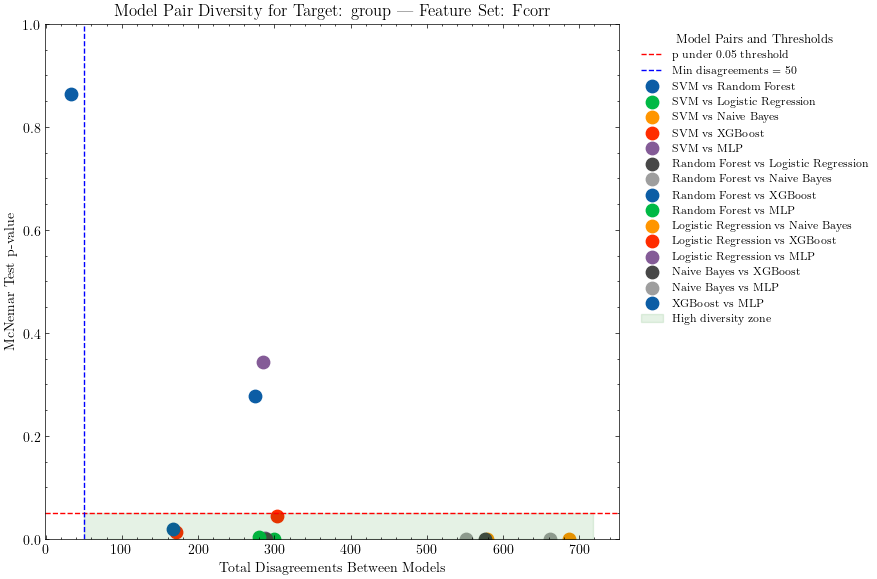

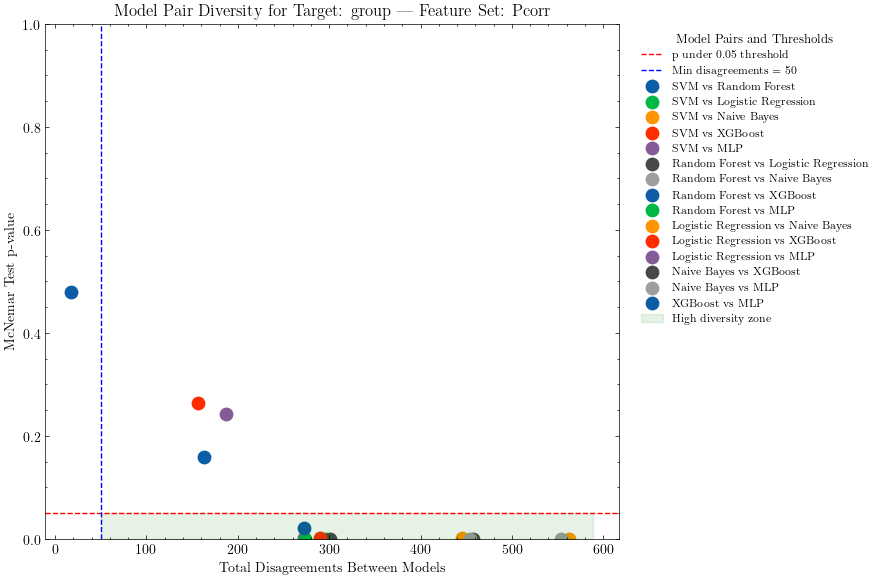

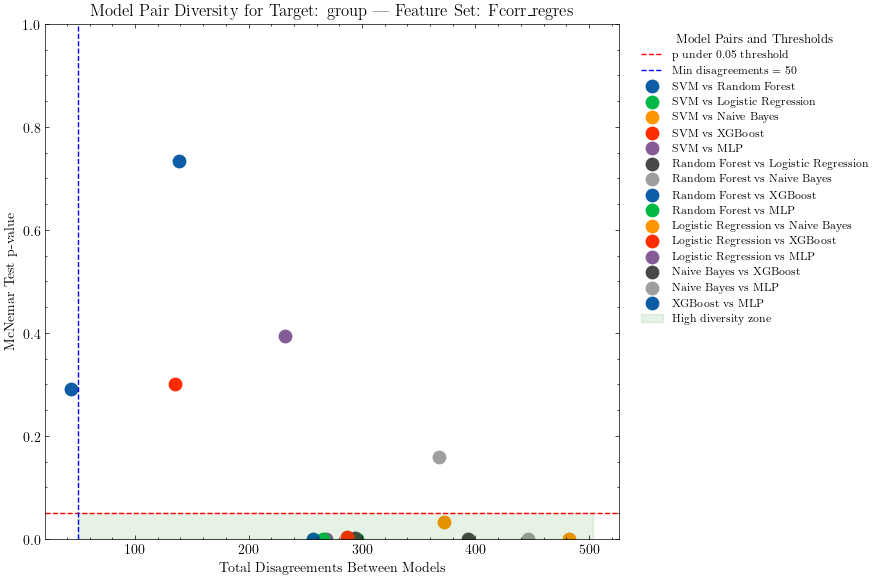

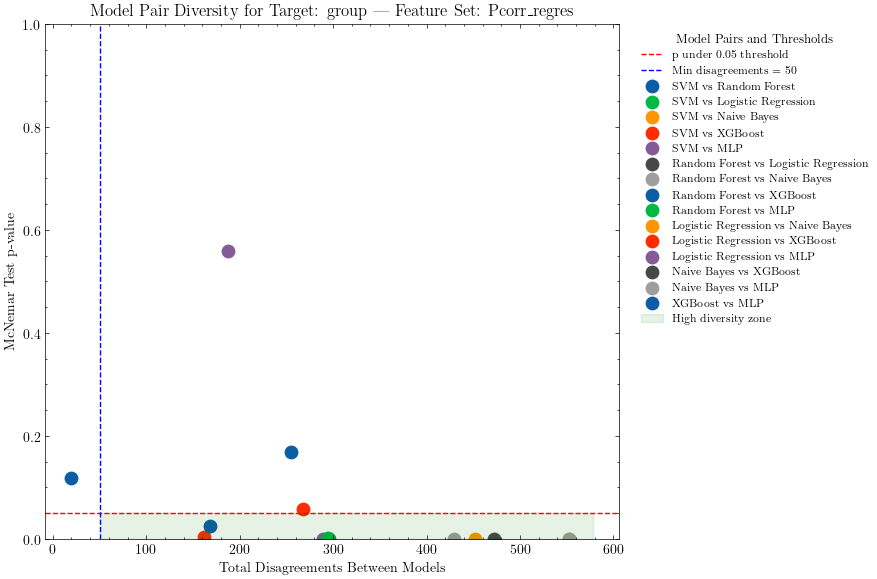

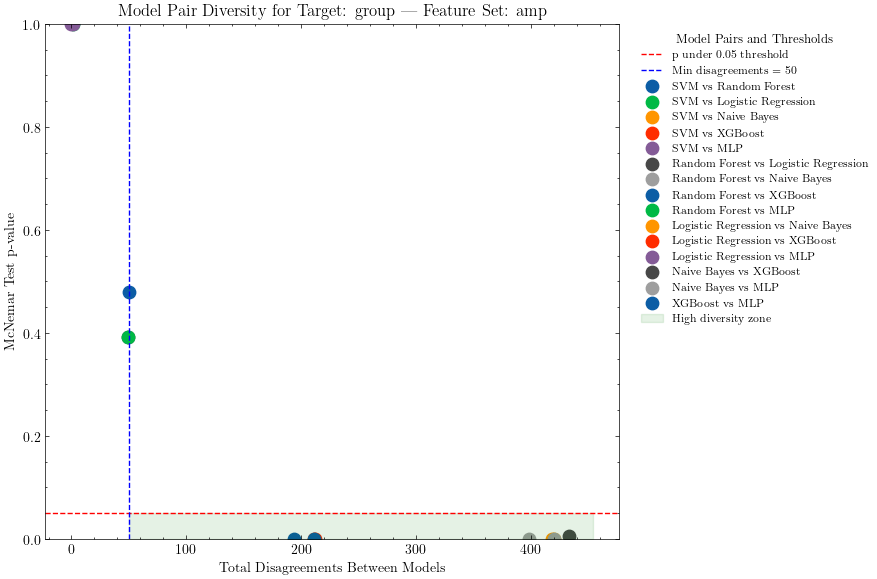

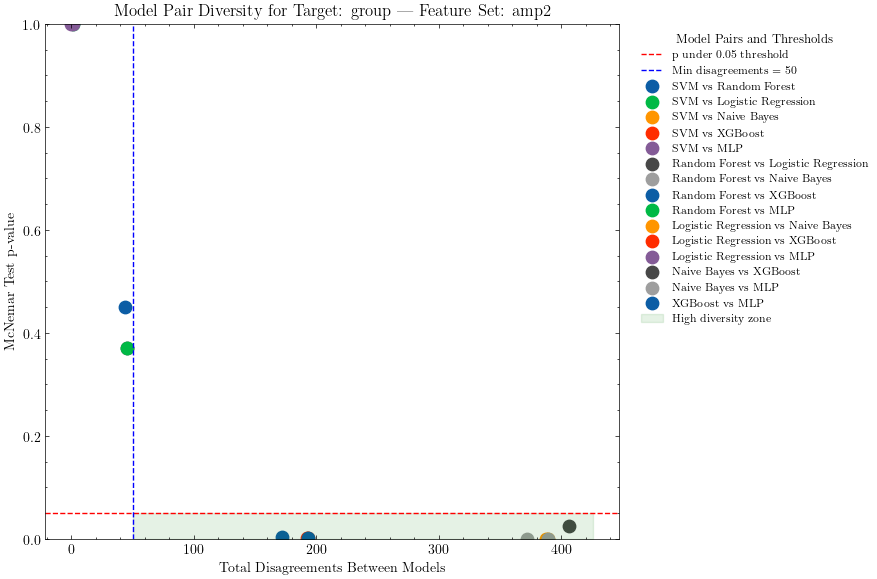

In [89]:
# min_disagreements = 50
plot_mcnemar_results(mcnemar_group, target="group", min_disagreements=50)

In [90]:
ensemble_candidates_group = suggest_ensemble_pairs(mcnemar_group, min_disagreements=50)
print(f'Ensemble candidates for target variable "group" with min_disagreements: 50')
print(f'\n')
print(ensemble_candidates_group.to_string(index=False))

Ensemble candidates for target variable "group" with min_disagreements: 50


     Feature Target                                 Pair  Disagreements      p-value
       Fcorr  group                   SVM vs Naive Bayes            686 5.415342e-14
       Fcorr  group         Random Forest vs Naive Bayes            662 3.485232e-14
       Fcorr  group   Logistic Regression vs Naive Bayes            579 1.040537e-07
       Fcorr  group               Naive Bayes vs XGBoost            577 8.646174e-12
       Fcorr  group                   Naive Bayes vs MLP            552 6.759814e-10
       Fcorr  group       Logistic Regression vs XGBoost            304 4.470840e-02
       Fcorr  group           SVM vs Logistic Regression            299 8.405245e-05
       Fcorr  group Random Forest vs Logistic Regression            289 1.034506e-04
       Fcorr  group                           SVM vs MLP            288 2.654029e-03
       Fcorr  group                 Random Forest vs MLP            280 3

##### Gender

In [91]:
mcnemar_gender = run_mcnemar_analysis(df, classification_results_df, "PTGENDER", feature_sets=individual_feature_set)

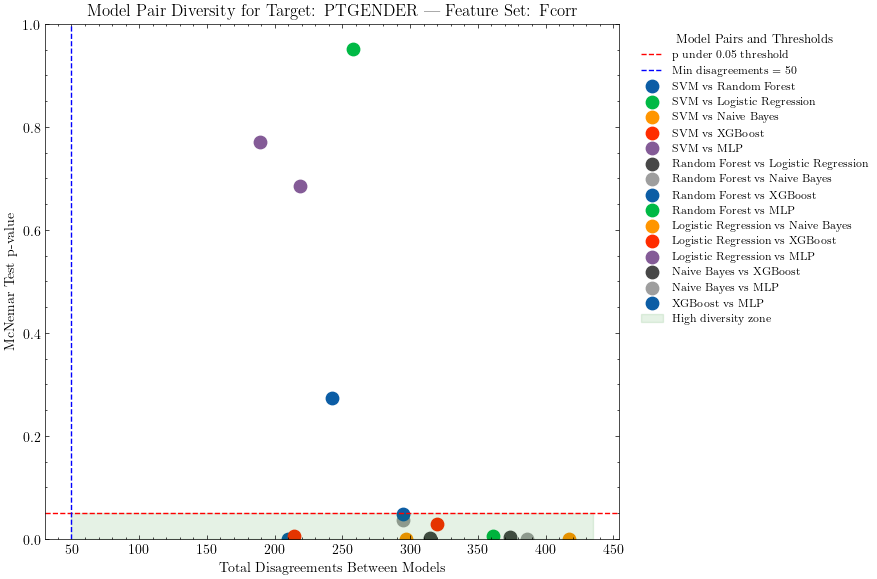

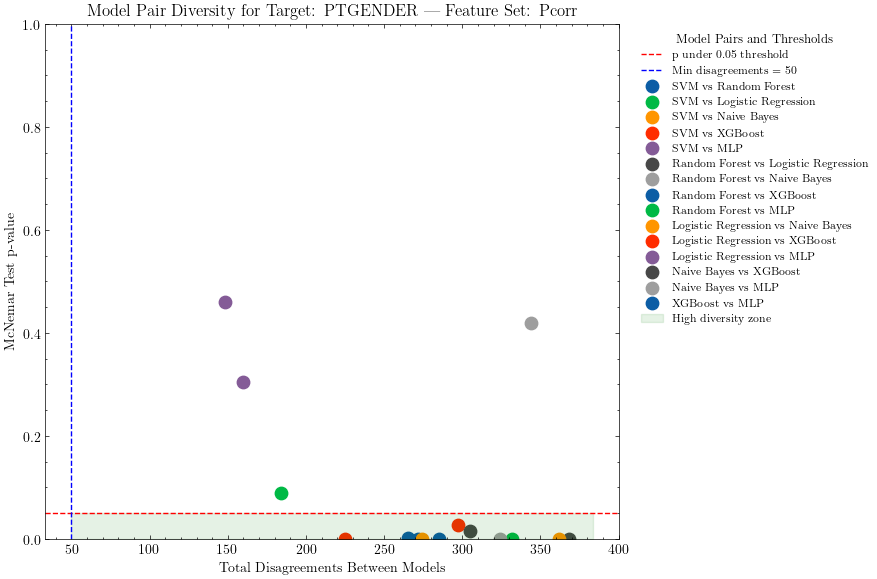

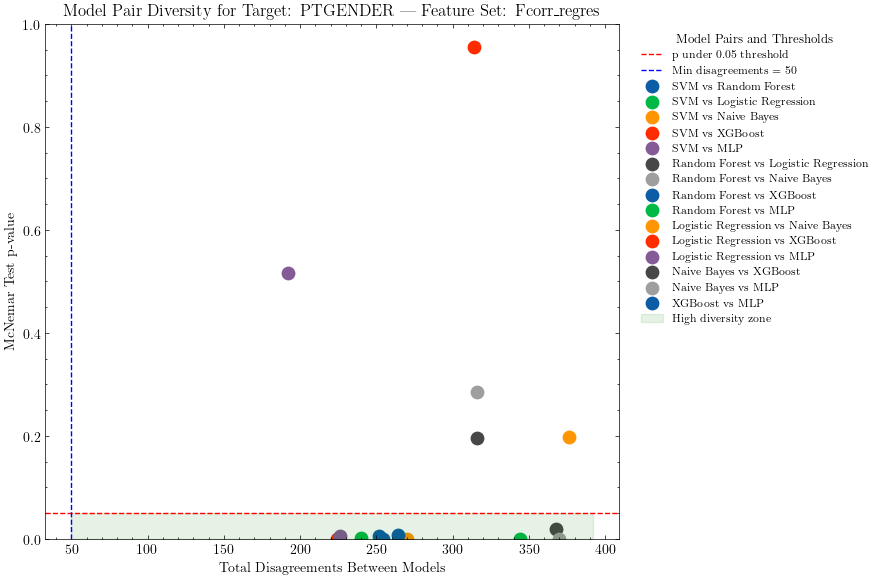

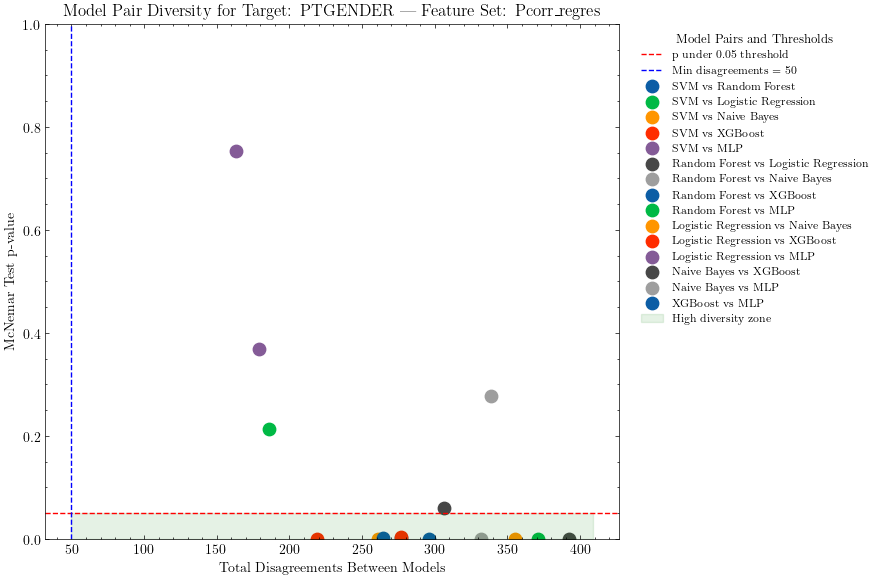

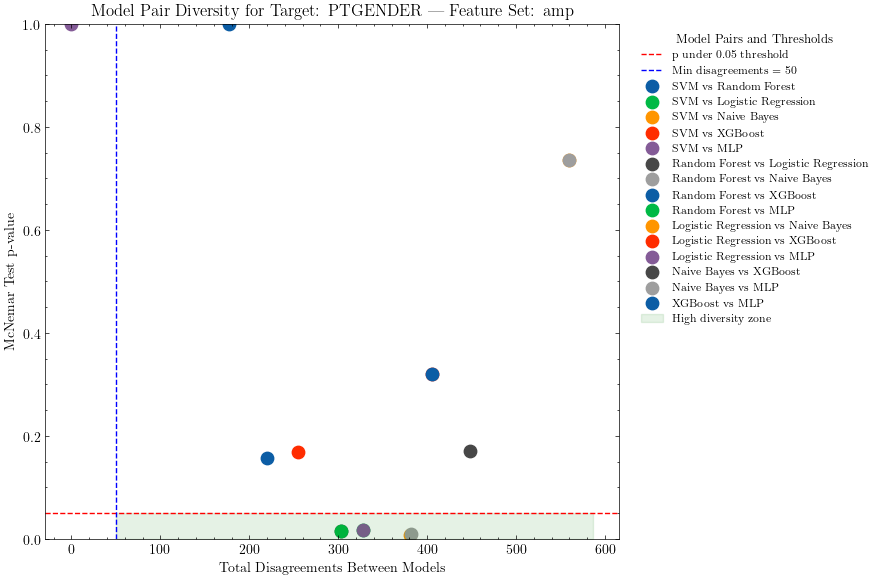

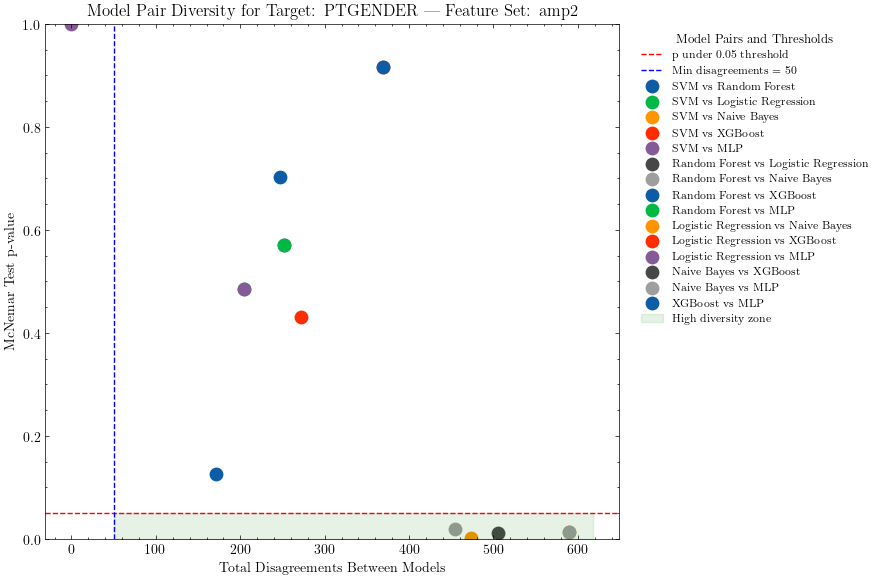

In [92]:
plot_mcnemar_results(mcnemar_gender, target="PTGENDER", min_disagreements=50)

In [93]:
ensemble_candidates_gender = suggest_ensemble_pairs(mcnemar_gender, min_disagreements=50)
print(f'Ensemble candidates for target variable "PTGENDER" with min_disagreements: 50')
print(f'\n')
print(ensemble_candidates_gender.to_string(index=False))

Ensemble candidates for target variable "PTGENDER" with min_disagreements: 50


     Feature   Target                                 Pair  Disagreements      p-value
       Fcorr PTGENDER   Logistic Regression vs Naive Bayes            417 4.160487e-06
       Fcorr PTGENDER                   Naive Bayes vs MLP            386 5.898907e-06
       Fcorr PTGENDER Random Forest vs Logistic Regression            374 3.204586e-03
       Fcorr PTGENDER                 Random Forest vs MLP            361 6.203206e-03
       Fcorr PTGENDER       Logistic Regression vs XGBoost            320 2.924514e-02
       Fcorr PTGENDER               Naive Bayes vs XGBoost            315 2.345787e-03
       Fcorr PTGENDER                   SVM vs Naive Bayes            297 2.540312e-08
       Fcorr PTGENDER         Random Forest vs Naive Bayes            295 3.608210e-02
       Fcorr PTGENDER                       XGBoost vs MLP            295 4.775338e-02
       Fcorr PTGENDER                       SVM vs

#### Ensemble methods (based on Mcnmear results)

When two models make lots of different mistakes (many disagreements, min_disagreements > 50) and this difference is statistically significant (p < 0.05), it means each model is good at things the other is not.

That’s why combining them in an ensemble can be powerful, since the ensemble can take advantage of their different strengths.

In [94]:
def evaluate_possible_ensemble(df, results_df, target, ensemble_candidates, task="classification"):
    """
    For each suggested model pair, builds pipelines for both models and a soft-voting ensemble,
    then evaluates the mean and std accuracy for the base models and the ensemble using cross-validation.

    Returns:
        DataFrame with ['Feature','Pair','Model','MeanAcc','StdAcc'] for each base model and ensemble.
    """
    records = []
    for _, row in ensemble_candidates.iterrows():
        feature_set = row['Feature']
        pair = row['Pair']
        # Extract model names from the "Pair" column (e.g. "SVM vs XGBoost")
        m1, m2 = [s.strip() for s in pair.split('vs')]

        # Build individual pipelines for each model with best parameters from grid search
        pipe1 = build_best_pipeline(results_df, target, feature_set, m1, task)
        pipe2 = build_best_pipeline(results_df, target, feature_set, m2, task)

        # Build a soft-voting ensemble with both pipelines
        ensemble = VotingClassifier(
            estimators=[(m1, pipe1), (m2, pipe2)],
            voting="soft" # soft voting for probabilities
        )

        # Prepare data & CV
        X = select_individual_features(df, feature_set)
        y = df[target]
        skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=44)

        # Evaluate each estimator (both base models and the ensemble)
        for name, estimator in [(m1, pipe1), (m2, pipe2), ('Ensemble', ensemble)]:
            cv_scores = cross_val_score(estimator, X, y, cv=skf, scoring='accuracy')
            records.append({
                'Feature': feature_set,
                'Pair': pair,
                'Model': name,
                'MeanAcc': cv_scores.mean(),
                'StdAcc': cv_scores.std()
            })

    return pd.DataFrame(records)

In [95]:
results_ensemble_group = evaluate_possible_ensemble(df, classification_results_df, "group", ensemble_candidates_group)
print(results_ensemble_group.to_string(index=False))

     Feature                                 Pair               Model  MeanAcc   StdAcc
       Fcorr                   SVM vs Naive Bayes                 SVM 0.693260 0.001730
       Fcorr                   SVM vs Naive Bayes         Naive Bayes 0.539891 0.032093
       Fcorr                   SVM vs Naive Bayes            Ensemble 0.576292 0.025856
       Fcorr         Random Forest vs Naive Bayes       Random Forest 0.691700 0.011932
       Fcorr         Random Forest vs Naive Bayes         Naive Bayes 0.539891 0.032093
       Fcorr         Random Forest vs Naive Bayes            Ensemble 0.573967 0.027287
       Fcorr   Logistic Regression vs Naive Bayes Logistic Regression 0.639804 0.011780
       Fcorr   Logistic Regression vs Naive Bayes         Naive Bayes 0.539891 0.032093
       Fcorr   Logistic Regression vs Naive Bayes            Ensemble 0.586361 0.032631
       Fcorr               Naive Bayes vs XGBoost         Naive Bayes 0.539891 0.032093
       Fcorr               Naive

In [96]:
results_ensemble_gender = evaluate_possible_ensemble(df, classification_results_df, "PTGENDER", ensemble_candidates_gender)

In [97]:
print(results_ensemble_gender.to_string(index=False))

     Feature                                 Pair               Model  MeanAcc   StdAcc
       Fcorr   Logistic Regression vs Naive Bayes Logistic Regression 0.721915 0.018816
       Fcorr   Logistic Regression vs Naive Bayes         Naive Bayes 0.648343 0.032548
       Fcorr   Logistic Regression vs Naive Bayes            Ensemble 0.687839 0.023578
       Fcorr                   Naive Bayes vs MLP         Naive Bayes 0.648343 0.032548
       Fcorr                   Naive Bayes vs MLP                 MLP 0.718054 0.020915
       Fcorr                   Naive Bayes vs MLP            Ensemble 0.706441 0.033355
       Fcorr Random Forest vs Logistic Regression       Random Forest 0.676990 0.007388
       Fcorr Random Forest vs Logistic Regression Logistic Regression 0.721915 0.018816
       Fcorr Random Forest vs Logistic Regression            Ensemble 0.724252 0.011662
       Fcorr                 Random Forest vs MLP       Random Forest 0.676990 0.007388
       Fcorr                 Ran

#### Regression

In [98]:
regression_models = {
    "Linear Regression": LinearRegression(),
    "ElasticNet": ElasticNet(random_state=44),
    "Random Forest Regressor": RandomForestRegressor(random_state=44),
    "XGBoost Regressor": XGBRegressor(objective='reg:squarederror', random_state=44),
    "MLP Regressor": MLPRegressor(max_iter=500, random_state=44)
}

In [99]:
regression_param_grids = {
    "ElasticNet": {
        "alpha": [0.1, 1.0],
        "l1_ratio": [0.1, 0.5]
    },
    "Random Forest Regressor": {
        "n_estimators": [100, 200],
        "max_depth": [None, 10]
    },
    "XGBoost Regressor": {
        "n_estimators": [100, 200],
        "max_depth": [3, 6]
    },
    "MLP Regressor": {
        "hidden_layer_sizes": [(64, 32), (128, 64)],
        "alpha": [0.0001, 0.001]
    }
}

In [100]:
regression_results_df = evaluate_grid_search(df, individual_feature_set, continuous_variables, regression_models, regression_param_grids, "regression")
print(regression_results_df.to_string(index=False))

                  Model    Score      Std                                         BestParams   FeatureSet    Target
      Linear Regression 1.031610 0.018072                                                 {}        Fcorr     PTAGE
             ElasticNet 0.972690 0.022214                    {'alpha': 0.1, 'l1_ratio': 0.5}        Fcorr     PTAGE
Random Forest Regressor 0.977061 0.031782           {'max_depth': None, 'n_estimators': 200}        Fcorr     PTAGE
      XGBoost Regressor 1.010495 0.038469              {'max_depth': 6, 'n_estimators': 200}        Fcorr     PTAGE
          MLP Regressor 1.183652 0.032671  {'alpha': 0.001, 'hidden_layer_sizes': (128, 64)}        Fcorr     PTAGE
      Linear Regression 1.072247 0.057106                                                 {}        Fcorr centiloid
             ElasticNet 0.993477 0.046456                    {'alpha': 1.0, 'l1_ratio': 0.1}        Fcorr centiloid
Random Forest Regressor 0.995906 0.041823             {'max_depth': 10, 

In [101]:
summary_regression_results_df = summarize_results(regression_results_df, "regression")
print(summary_regression_results_df.to_string(index=False))

   Target   FeatureSet                   Model                                    Hyperparameters     RMSE      Std
    PTAGE        Fcorr       Linear Regression                                                 {} 1.031610 0.018072
    PTAGE        Fcorr              ElasticNet                    {'alpha': 0.1, 'l1_ratio': 0.5} 0.972690 0.022214
    PTAGE        Fcorr Random Forest Regressor           {'max_depth': None, 'n_estimators': 200} 0.977061 0.031782
    PTAGE        Fcorr       XGBoost Regressor              {'max_depth': 6, 'n_estimators': 200} 1.010495 0.038469
    PTAGE        Fcorr           MLP Regressor  {'alpha': 0.001, 'hidden_layer_sizes': (128, 64)} 1.183652 0.032671
centiloid        Fcorr       Linear Regression                                                 {} 1.072247 0.057106
centiloid        Fcorr              ElasticNet                    {'alpha': 1.0, 'l1_ratio': 0.1} 0.993477 0.046456
centiloid        Fcorr Random Forest Regressor             {'max_depth':

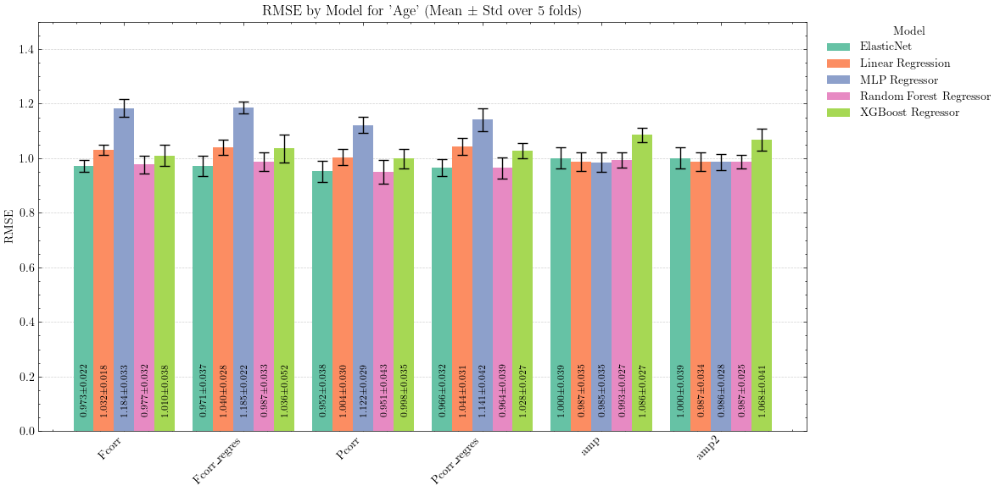

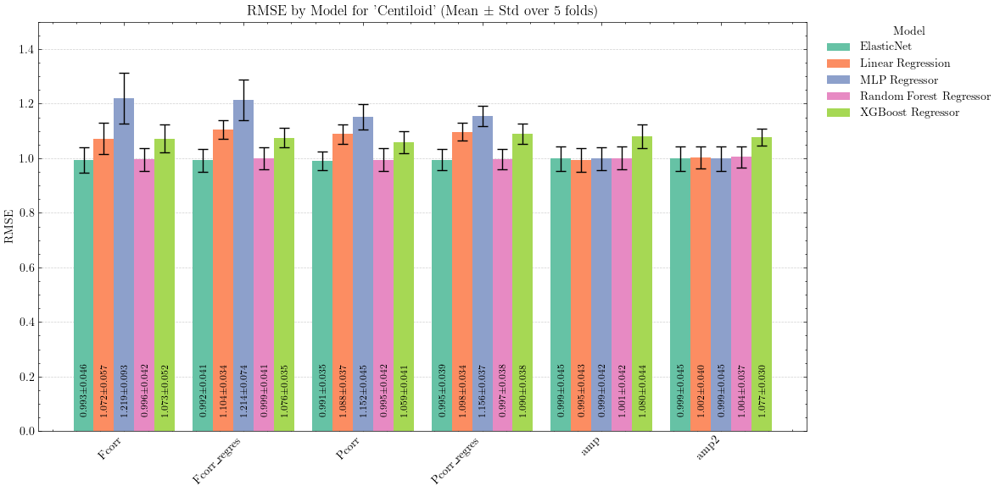

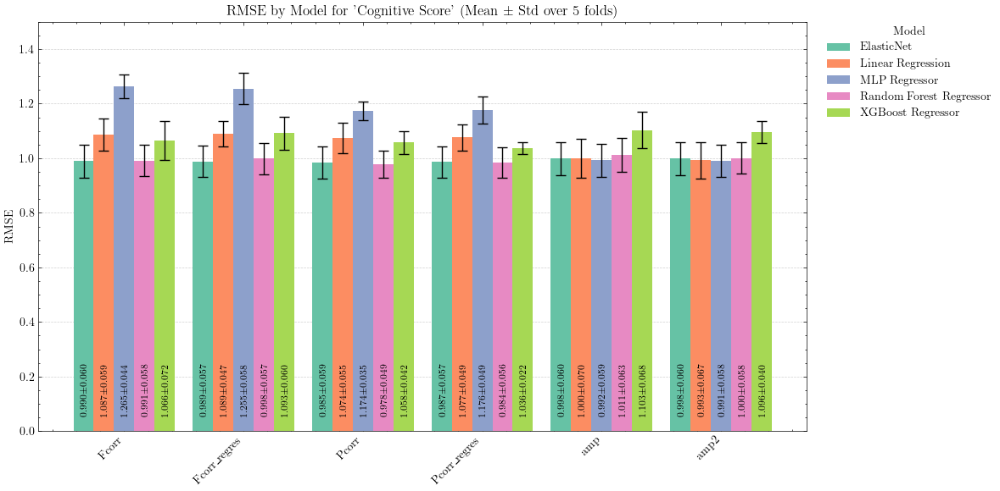

In [102]:
plot_grid_search_results(regression_results_df, "regression")

In [103]:
# Save the regression results to a CSV file
# regression_results_df.to_csv("regression_results.csv", index=False)

#### Save the best model for every possible combination: Feature + Target

In [104]:
def get_best_models(results_df, task):
    """
    Given the results DataFrame from classification or regression grid search, select the best row (highest accuracy or lowest RMSE) for each combination of FeatureSet and Target.
    """
    # Choose selection criterion depending on task
    if task == "classification":
        # Accuracy: higher is better
        best_rows = (
            results_df
            .sort_values("Score", ascending=False)   # Sort so the highest score (best model) is on top
            .groupby(["FeatureSet", "Target"], as_index=False)
            .first()                                # For each group, take the top (best) row
        )
        metric_name = "Accuracy"
    else:
        # RMSE: lower is better
        best_rows = (
            results_df
            .sort_values("Score", ascending=True)
            .groupby(["FeatureSet", "Target"], as_index=False)
            .first()
        )
        metric_name = "RMSE"

    # Rename columns for clarity
    best_rows = best_rows.rename(columns={"Score": metric_name, "Std": f"{metric_name}_Std"})

    # Select only the main columns
    cols = ["FeatureSet", "Target", "Model", "BestParams", metric_name, f"{metric_name}_Std"]

    return best_rows[cols]

In [105]:
best_class_models = get_best_models(classification_results_df, "classification")
best_reg_models = get_best_models(regression_results_df, "regression")
# Save as CSV:
# best_class_models.to_csv("best_classification_models.csv", index=False)
# best_reg_models.to_csv("best_regression_models.csv", index=False)


---

In [49]:
import torch
import torch.nn as nn
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
from torch_geometric.nn import GINEConv, global_mean_pool
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from itertools import product
import h2o
from h2o.automl import H2OAutoML
import networkx as nx
from torch_geometric.utils import to_networkx

### Exploring Convolutional Neural Networks (CNNs)

The first dataset, without the removal of the lower-triangle part of the matrix, is the one used here.

In [50]:
print(df_original.shape)

(1291, 1656)


In [51]:
variables = ["group", "PTAGE", "PTGENDER", "centiloid", "PACCRN"]
full_fslnets_amp_ic = [col for col in df_original.columns if col.startswith("fslnets_amp_ic")]
full_fslnets_amp2_ic = [col for col in df_original.columns if col.startswith("fslnets_amp2_ic")]
full_fslnets_Fcorr_regres_ = [col for col in df_original.columns if col.startswith("fslnets_Fcorr_regres_")]
full_fslnets_Pcorr_regres_ = [col for col in df_original.columns if col.startswith("fslnets_Pcorr_regres_")]
full_fslnets_Fcorr_ = [col for col in df_original.columns if col.startswith("fslnets_Fcorr_") and "regres" not in col]
full_fslnets_Pcorr_ = [col for col in df_original.columns if col.startswith("fslnets_Pcorr_") and "regres" not in col]

In [52]:
# Run the same analysis for each group of columns (previously done)
results = [
    analyze_matrix(df_original, full_fslnets_Fcorr_, "fslnets_Fcorr_"),
    analyze_matrix(df_original, full_fslnets_Pcorr_, "fslnets_Pcorr_"),
    analyze_matrix(df_original, full_fslnets_Fcorr_regres_, "fslnets_Fcorr_regres_"),
    analyze_matrix(df_original, full_fslnets_Pcorr_regres_, "fslnets_Pcorr_regres_")
]

# Print summary table
summary_df = summarize_matrix_analyses(results)
print(summary_df.to_string(index=False))

               Matrix  Complete  Symmetric  Zero Diagonal
       fslnets_Fcorr_      True       True           True
       fslnets_Pcorr_      True       True           True
fslnets_Fcorr_regres_      True       True           True
fslnets_Pcorr_regres_      True       True           True


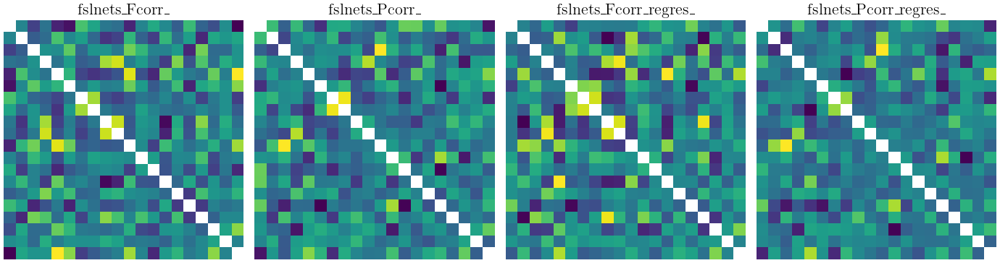

In [53]:
plot_matrices(results)

In [54]:
# Dictionary grouping all full feature sets
full_feature_sets = {
    "Fcorr": full_fslnets_Fcorr_,
    "Pcorr": full_fslnets_Pcorr_,
    "Fcorr_regres": full_fslnets_Fcorr_regres_,
    "Pcorr_regres": full_fslnets_Pcorr_regres_
}

In [55]:
# Get all feature columns to scale
all_feature_columns = (
    full_feature_sets["Fcorr"] +
    full_feature_sets["Pcorr"] +
    full_feature_sets["Fcorr_regres"] +
    full_feature_sets["Pcorr_regres"]
)
# Standarization
scaler = StandardScaler()
df_original[all_feature_columns] = scaler.fit_transform(df_original[all_feature_columns])

In [56]:
def reconstruct_matrices(row, columns, size=20):
    """
    Reconstructs a flat vector (row) into a square 2D matrix (20x20).
    Fills the matrix with values from the input row based on index encoding.
    """
    # Initialize an empty square matrix
    mat = np.zeros((size,size), dtype=np.float32)
    for col in columns:
        # Extract the flat index (e.g. “fslnets_Pcorr_345” → 345) (string divided by "_", gets the most right part)
        idx = int(col.split('_')[-1])
        # Convert to 2D indices (i,j) for the matrix
        # 'divmod' gives us the quotient and remainder of the division
        # e.g. 345 // 20 = 17, 345 % 20 = 5 → (17,5)
        i,j = divmod(idx, size)
        # Fill the matrix with the value from the row
        mat[i,j] = row[col]
        
    return mat

2 different architecture aproaches:

- SingleCNN: A classic CNN that processes a single $20\times20$ feature matrix at a time (i.e., each input is $[N, 1, 20, 20]$). This architecture is applied separately to each type of connectivity feature, analogous to the feature-set-specific approaches in previous sections.

- JointCNN: all four main feature matrices (Fcorr, Pcorr, Fcorr\_regres, Pcorr\_regres) are stacked as different channels in a single CNN input (input shape $[N, 4, 20, 20]$), analogous to how the RGB channels work in a color image.

In [57]:
class JointCNN(nn.Module):
    """
    JointCNN: Processes all four feature matrices as separate channels of a single input
    (i.e., input shape [N, 4, 20, 20]).  This enables the network to learn from the combined information across all feature sets.
    """
    def __init__(self, output_dim, in_channels=4):
        super().__init__()
        self.conv = nn.Sequential(
            # First convolutional layer.
            # in_channels=4 (number of feature matrices), out_channels=16 filters.
            nn.Conv2d(in_channels, 16, kernel_size=3, padding=1),
            nn.ReLU(), # inputs non-linearity
            nn.MaxPool2d(2), # MaxPool2d: reduces 20x20 to 10x10 by taking max in each 2x2 block. 
            # Second convolutional block: 16 -> 32 feature maps
            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2) # Now 10x10 -> 5x5.
        )
        # Fully connected layers for final prediction
        self.fc = nn.Sequential(
            nn.Flatten(),               # Flatten feature maps to a vector (row)
            nn.Linear(32 * 5 * 5, 64),  # Input: flattened features, Output: 64 units
            nn.ReLU(),
            nn.Linear(64, output_dim)   # Output: 2 for binary classification or regression units
        )
    def forward(self, x):
        x = self.conv(x)  # Pass input through all conv/ReLU/MaxPool layers
        x = self.fc(x)    # Flatten, then through fully connected layers
        return x

In [58]:
class SingleCNN(nn.Module):
    """
    Simple CNN for one connectivity matrix (shape [N, 1, 20, 20]).
    This can be used on Fcorr only, Pcorr only, etc.
    """
    def __init__(self, output_dim):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(32 * 5 * 5, 64),
            nn.ReLU(),
            nn.Linear(64, output_dim)
        )
    def forward(self, x):
        x = self.conv(x)
        x = self.fc(x)
        return x

In [59]:
# Build matrices for each feature set (SingleCNN: one per run)
def build_single_feature_tensor(df, columns, size=20):
    """
    Used for SingleCNN.
    Returns a tensor of shape [N, 1, 20, 20]
    """
    mats = [reconstruct_matrices(row, columns, size) for _, row in df.iterrows()]
    X = np.stack(mats, axis=0)[:, None, :, :]  # Add channel dimension (1)
    return X

In [60]:
def build_joint_tensor(df, list_of_feature_sets, size=20):
    """
    Used for JointCNN.
    For multiple feature sets, build a single tensor stacking each as a channel.
    Returns a tensor of shape [N, 4, 20, 20].
    """
    mats = []
    # For each feature set, reconstruct all matrices and stack them
    for columns in list_of_feature_sets:
        mat = [reconstruct_matrices(row, columns, size) for _, row in df.iterrows()]
        mats.append(np.stack(mat, axis=0))
    # Stack all feature sets along a new channel axis
    X = np.stack(mats, axis=1)
    return X

In [61]:
def run_cnn_cv(X, y, model_class, output_dim, task='classification', n_splits=5, epochs=10, batch_size=32):
    """
    Trains and evaluates a CNN model using cross-validation.
    Arguments:
        X: numpy array of input data, shape [N, C, H, W]
        y: target values (2 labels or regression targets)
        model_class: model to instate
        output_dim: output dimension (number of classes (2) or 1 for regression)
        task: 'classification' or 'regression'
        n_splits: number of cross-validation folds -> 5
        epochs: training epochs per fold
        batch_size: batch size for DataLoader

    Returns:
        List of scores (accuracy or RMSE) for each fold.
    """
    # device = "cuda" if torch.cuda.is_available() else "cpu"
    device = "cpu"
    results = []
    # Select cross-validation method dpending on task
    if task == 'classification':
        cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=44)
    else:
        cv = KFold(n_splits=n_splits, shuffle=True, random_state=44)

    for fold, (train_idx, val_idx) in enumerate(cv.split(X, y if task == 'classification' else np.zeros(len(y)))):
        # Instantiate a new model for each fold
        model = model_class(output_dim).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
        # For classification use CrossEntropyLoss.
        # For regression use Mean Squared Error Loss
        criterion = nn.CrossEntropyLoss() if task == 'classification' else nn.MSELoss()

        # Prepare data tensors for this fold
        x_train = torch.tensor(X[train_idx], dtype=torch.float32).to(device)
        y_train = torch.tensor(y[train_idx], dtype=torch.long if task == 'classification' else torch.float32).to(device) # integers for classification, floats for regression
        x_val = torch.tensor(X[val_idx], dtype=torch.float32).to(device)
        y_val = torch.tensor(y[val_idx], dtype=torch.long if task == 'classification' else torch.float32).to(device)

        train_loader = DataLoader(TensorDataset(x_train, y_train), batch_size=batch_size, shuffle=True)

        # Training loop
        model.train()
        for epoch in range(epochs):
            for xb, yb in train_loader:
                optimizer.zero_grad()
                outputs = model(xb)
                # For regression, squeeze the output for correct shape
                # For classification: outputs shape is [batch, num_classes], which is correct for CrossEntropyLoss.
                # For regression: outputs shape is often [batch, 1], but nn.MSELoss expects [batch].
                # squeeze() to remove the singleton dimension (convert [batch, 1] -> [batch]).
                loss = criterion(outputs if task == 'classification' else outputs.squeeze(), yb)
                loss.backward()
                optimizer.step()

        # Validation
        model.eval()
        with torch.no_grad():
            outputs = model(x_val)
            if task == 'classification':
                # dim=1: finds the index of the maximum value along the class dimension (which class has the highest score)
                preds = outputs.argmax(dim=1).cpu().numpy()
                score = accuracy_score(y_val.cpu().numpy(), preds)
            else:
                preds = outputs.squeeze().cpu().numpy()
                score = root_mean_squared_error(y_val.cpu().numpy(), preds)  # RMSE
            results.append(score)

    return results

In [62]:
results_summary = []

# SingleCNN: For each feature set and each target
for fs_name, fs_cols in full_feature_sets.items():

    # Build tensor for current feature set
    X = build_single_feature_tensor(df_original, fs_cols, size=20)
    
    # Classification
    for tgt in binary_variables:
        y = df_original[tgt].astype(int).values
        scores = run_cnn_cv(X, y, SingleCNN, output_dim=2, task='classification', n_splits=5, epochs=10)
        results_summary.append({
            'Model': 'SingleCNN',
            'FeatureSet': fs_name,
            'Target': tgt,
            'Task': 'classification',
            'MeanScore': np.mean(scores),
            'StdScore': np.std(scores)
        })

    # Regression
    for tgt in continuous_variables:
        y = df_original[tgt].astype(float).values
        scores = run_cnn_cv(X, y, SingleCNN, output_dim=1, task='regression', n_splits=5, epochs=10)
        results_summary.append({
            'Model': 'SingleCNN',
            'FeatureSet': fs_name,
            'Target': tgt,
            'Task': 'regression',
            'MeanScore': np.mean(scores),
            'StdScore': np.std(scores)
        })

In [63]:
# JointCNN: All 4 feature sets as channels, for each target
X_joint = build_joint_tensor(
    df_original,
    [full_fslnets_Fcorr_, full_fslnets_Pcorr_, full_fslnets_Fcorr_regres_, full_fslnets_Pcorr_regres_],
    size=20
)

for tgt in binary_variables:
    y = df_original[tgt].astype(int).values
    scores = run_cnn_cv(X_joint, y, JointCNN, output_dim=2, task='classification', n_splits=5, epochs=10)
    results_summary.append({
        'Model': 'JointCNN',
        'FeatureSet': 'All',
        'Target': tgt,
        'Task': 'classification',
        'MeanScore': np.mean(scores),
        'StdScore': np.std(scores)
    })

for tgt in continuous_variables:
    y = df_original[tgt].astype(float).values
    scores = run_cnn_cv(X_joint, y, JointCNN, output_dim=1, task='regression', n_splits=5, epochs=10)
    results_summary.append({
        'Model': 'JointCNN',
        'FeatureSet': 'All',
        'Target': tgt,
        'Task': 'regression',
        'MeanScore': np.mean(scores),
        'StdScore': np.std(scores)
    })

In [64]:
results_df = pd.DataFrame(results_summary)
print(results_df)

        Model    FeatureSet     Target            Task  MeanScore  StdScore
0   SingleCNN         Fcorr      group  classification   0.623537  0.061948
1   SingleCNN         Fcorr   PTGENDER  classification   0.676996  0.016707
2   SingleCNN         Fcorr      PTAGE      regression   7.803432  2.079747
3   SingleCNN         Fcorr  centiloid      regression  39.335140  1.659674
4   SingleCNN         Fcorr     PACCRN      regression   2.720953  0.144970
5   SingleCNN         Pcorr      group  classification   0.646787  0.013010
6   SingleCNN         Pcorr   PTGENDER  classification   0.665353  0.034918
7   SingleCNN         Pcorr      PTAGE      regression   7.099750  0.377808
8   SingleCNN         Pcorr  centiloid      regression  39.075775  1.787450
9   SingleCNN         Pcorr     PACCRN      regression   2.790559  0.148680
10  SingleCNN  Fcorr_regres      group  classification   0.630571  0.038292
11  SingleCNN  Fcorr_regres   PTGENDER  classification   0.649861  0.054153
12  SingleCN

In [65]:
def plot_results_cnn_comparison(best_class_models, separate_cnn_results, joint_cnn_results, task="classification"):
    """
    For each feature set (except amp/amp2), plots grouped bars:
    - BestML: best classical model for that feature set
    - SingleCNN: best CNN for that feature set
    - JointCNN: JointCNN with all channels, shown in every feature set row
    """
    y_label = "Accuracy" if task == "classification" else "RMSE"
    palette = "Set2"

    # Define main feature sets (exclude any with amp/amp2)
    main_feature_sets = [
        fs for fs in best_class_models["FeatureSet"].unique()
        if ("amp" not in fs and "amp2" not in fs)
    ]
    # Get the JointCNN results per target (they are global, but will be shown in every row)
    joint_cnn_by_target = {
        row["Target"]: (row["MeanScore"], row["StdScore"])
        for _, row in joint_cnn_results.iterrows()
        if row["Task"] == task
    }

    metric = "Accuracy" if task == "classification" else "RMSE"
    metric_std = metric + "_Std"
    targets = best_class_models["Target"].unique()

    for target in targets:
        data = []
        for fs in main_feature_sets:
            # BestML (was 'Classical')
            row_bestml = best_class_models[(best_class_models["FeatureSet"] == fs) & (best_class_models["Target"] == target)]
            val_bestml = row_bestml[metric].values[0] if not row_bestml.empty else np.nan
            std_bestml = row_bestml[metric_std].values[0] if not row_bestml.empty and metric_std in row_bestml else np.nan
            # SingleCNN (was 'CNN')
            row_singlecnn = separate_cnn_results[
                (separate_cnn_results["FeatureSet"] == fs) &
                (separate_cnn_results["Target"] == target) &
                (separate_cnn_results["Task"] == task)
            ]
            val_singlecnn = row_singlecnn["MeanScore"].values[0] if not row_singlecnn.empty else np.nan
            std_singlecnn = row_singlecnn["StdScore"].values[0] if not row_singlecnn.empty else np.nan
            # JointCNN (always the same for each feature set, repeated)
            if target in joint_cnn_by_target:
                val_jointcnn, std_jointcnn = joint_cnn_by_target[target]
            else:
                val_jointcnn, std_jointcnn = np.nan, np.nan
            data.append({
                "FeatureSet": fs,
                "BestML": val_bestml,
                "BestMLStd": std_bestml,
                "SingleCNN": val_singlecnn,
                "SingleCNNStd": std_singlecnn,
                "JointCNN": val_jointcnn,
                "JointCNNStd": std_jointcnn
            })
        # Build DataFrame for plotting
        plot_df = pd.DataFrame(data)
        feature_sets = plot_df["FeatureSet"].tolist()
        bar_width = 0.22
        x = np.arange(len(feature_sets))
        fig, ax = plt.subplots(figsize=(10, 5))

        # Plot the three bars per group
        bars1 = ax.bar(x - bar_width, plot_df["BestML"], bar_width,
                       yerr=plot_df["BestMLStd"], capsize=4, label="BestML", color=sns.color_palette(palette)[0])
        bars2 = ax.bar(x, plot_df["SingleCNN"], bar_width,
                       yerr=plot_df["SingleCNNStd"], capsize=4, label="SingleCNN", color=sns.color_palette(palette)[1])
        bars3 = ax.bar(x + bar_width, plot_df["JointCNN"], bar_width,
                       yerr=plot_df["JointCNNStd"], capsize=4, label="JointCNN", color=sns.color_palette(palette)[2])

        # Annotate each bar with mean ± std
        for bars, values, stds in zip(
            [bars1, bars2, bars3],
            [plot_df["BestML"], plot_df["SingleCNN"], plot_df["JointCNN"]],
            [plot_df["BestMLStd"], plot_df["SingleCNNStd"], plot_df["JointCNNStd"]]
        ):
            for bar, m, e in zip(bars, values, stds):
                cx = bar.get_x() + bar.get_width() / 2
                if not np.isnan(m):
                    ax.text(
                        cx, 0.05 if y_label == "Accuracy" else m + e + 0.01,
                        f"{m:.3f}±{e:.3f}",
                        ha="center", va="bottom",
                        rotation=90,
                        color="black",
                        fontsize=10,
                        clip_on=True,
                        zorder=5
                    )
        # Formatting
        ax.set_xticks(x)
        ax.set_xticklabels(feature_sets, rotation=45, ha="right")
        if y_label == "Accuracy":
            ax.set_ylim(0, 1)
        else:
            max_y = np.nanmax(plot_df[["BestML", "SingleCNN", "JointCNN"]].values + 
                              plot_df[["BestMLStd", "SingleCNNStd", "JointCNNStd"]].values)
            ax.set_ylim(0, max_y * 1.3)
        pretty_target = clean_names.get(target, str(target))
        ax.set_title(f"{y_label} of CNN and BestML models for '{pretty_target}' (Mean ± Std over 5 folds)")
        ax.grid(axis="y", linestyle="--", alpha=0.6)
        ax.legend(title="Model", loc="upper right")
        safe_target = str(target).replace(" ", "_").replace("/", "_")
        plt.tight_layout()
        plt.savefig(f"cnn_comparison_{task}_{safe_target}.pdf")
        plt.show()



In [66]:
separate_cnn_results = results_df[results_df['Model'] == 'SingleCNN'].copy()
joint_cnn_results = results_df[results_df['Model'] == 'JointCNN'].copy()

In [67]:
# For classification:
plot_results_cnn_comparison(best_class_models, separate_cnn_results, joint_cnn_results, task="classification")

# For regression:
plot_results_cnn_comparison(best_reg_models, separate_cnn_results, joint_cnn_results, task="regression")

NameError: name 'best_class_models' is not defined

---

In [68]:
from torch_geometric.loader import DataLoader

### Graph Neural Network

In [69]:
def visualize_graph(data, edge_feature_idx=0, node_labels=None, cmap="viridis"):
    """
    Visualize a PyTorch Geometric Data graph using NetworkX and Matplotlib.

    Args:
        data: PyG Data object
        edge_feature_idx: index of edge_attr to plot if it is multichannel (one channel per feature) (default: 0)
        title: title of the plot
        node_labels: dict or list of node labels (optional, for coloring)
        cmap: color map for node coloring
    """
    # Convert PyG graph to NetworkX
    G = to_networkx(data, edge_attrs=['edge_attr'], to_undirected=True) # It is an undirected network

    plt.figure(figsize=(9, 9))
    #pos = nx.spring_layout(G, seed=44)
    pos = nx.kamada_kawai_layout(G)

    # Node color (default: all blue)
    node_color = "skyblue"
    nx.draw_networkx_nodes(G, pos, node_size=400, node_color=node_color, cmap=cmap)

    # --- Robust edge coloring ---
    # Build mapping: (i, j) -> edge index
    edge_tuples = [(int(i), int(j)) for i, j in data.edge_index.t().tolist()]
    # PyG undirected graphs have both (i, j) and (j, i); NetworkX only unique.
    edge2idx = {}
    for idx, (i, j) in enumerate(edge_tuples):
        # Store only once per undirected edge
        if (i, j) not in edge2idx and (j, i) not in edge2idx:
            edge2idx[(i, j)] = idx

    edges = []
    edge_weights = []
    for (i, j) in G.edges:
        idx = edge2idx.get((i, j), edge2idx.get((j, i)))
        edges.append((i, j))
        edge_weights.append(float(data.edge_attr[idx][edge_feature_idx]))

    # Thickness scaling
    max_w = max(abs(w) for w in edge_weights) if edge_weights else 1
    edge_weights_scaled = [0.5 + 2.5 * abs(w) / max_w if max_w != 0 else 0.5 for w in edge_weights]

    # Draw edges with color and thickness, mapping negatives and positives
    nx.draw_networkx_edges(
        G, pos,
        edgelist=edges,
        width=edge_weights_scaled,
        edge_color=edge_weights,
        edge_cmap=plt.cm.coolwarm,
        edge_vmin=min(edge_weights),
        edge_vmax=max(edge_weights),
    )

    nx.draw_networkx_labels(G, pos, font_size=12)
    plt.title("Single-channel Fcorr graph for first subject")
    plt.axis("off")
    plt.savefig("Network.pdf", bbox_inches="tight")
    plt.savefig("Network.svg", bbox_inches="tight")
    plt.show()


In [70]:
def subject_to_graph_multicanal(row, feature_keys_dict, size=20, label=None):
    """
    Convert a subject into a PyTorch Geometric graph with multiple edge features.
    - feature_keys_dict: {"Fcorr": [...], "Pcorr": [...], ...}
    - Each edge's attributes are a vector (e.g., [fcorr, pcorr, ...]).
    """
    # Reconstruct all feature matrices for this subject
    mats = {k: reconstruct_matrices(row, v, size) for k, v in feature_keys_dict.items()}
    edge_index, edge_attr = [], []
    for i in range(size):
        for j in range(size):
            if i != j:
                edge_index.append([i, j])   # Directed edge from i to j
                # For each edge, collect all features as a vector
                edge_attr.append([mats[k][i, j] for k in feature_keys_dict.keys()])
                
    # Convert edge lists to PyTorch tensors (shape [2, num_edges] and [num_edges, num_features])
    edge_index = torch.tensor(edge_index, dtype=torch.long).t().contiguous()
    edge_attr = torch.tensor(edge_attr, dtype=torch.float)
    # Node features: here just ones (shape: [num_nodes, 1])
    x = torch.ones((size, 1), dtype=torch.float)
    # PyTorch Geometric Data object
    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr, y=label)
    return data

In [71]:
def subject_to_graph_single(row, columns, size=20, label=None):
    """
    Convert a subject (row) into a PyTorch Geometric graph with a single edge feature per edge.
    """
    mat = reconstruct_matrices(row, columns, size)
    edge_index, edge_attr = [], []
    for i in range(size):
        for j in range(size):
            if i != j:
                edge_index.append([i, j])
                edge_attr.append([mat[i, j]])    # Single value per edge
    edge_index = torch.tensor(edge_index, dtype=torch.long).t().contiguous()
    edge_attr = torch.tensor(edge_attr, dtype=torch.float)
    x = torch.ones((size, 1), dtype=torch.float)
    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr, y=label)
    return data

In [72]:
def build_dataset_multichannel(df, feature_keys_dict, target_col, size=20):
    """
    Build a list of graphs for all subjects in the DataFrame (multichannel).
    Each subject is converted to a graph using all feature sets as edge attributes.
    """
    data_list = []
    for _, row in df.iterrows():
        data = subject_to_graph_multicanal(row, feature_keys_dict, size=size, label=int(row[target_col]))
        data_list.append(data)
    return data_list

In [73]:
def build_dataset_single(df, columns, target_col, size=20):
    """
    Build a list of Data objects (graphs) for all subjects in the DataFrame (single channel).
    Each subject is converted to a graph using one feature set as edge attributes.
    """
    data_list = []
    for _, row in df.iterrows():
        data = subject_to_graph_single(row, columns, size=size, label=int(row[target_col]))
        data_list.append(data)
    return data_list

In [74]:
class GINENet(nn.Module):
    """
    Graph Neural Network for classification using two GINEConv layers.
    - edge_dim: number of edge features (channels) per edge
    - hidden_channels: hidden dimension for node embeddings and MLP
    - n_classes: number of output classes (for classification)
    """
    def __init__(self, edge_dim, hidden_channels, n_classes):
        super().__init__()
        # MLP for the first GINEConv layer: 1 input -> hidden_channels
        self.nn1 = nn.Sequential(
            nn.Linear(1, hidden_channels),
            nn.ReLU(),
            nn.Linear(hidden_channels, hidden_channels)
        )
        # MLP for the second GINEConv layer
        self.nn2 = nn.Sequential(
            nn.Linear(hidden_channels, hidden_channels),
            nn.ReLU(),
            nn.Linear(hidden_channels, hidden_channels)
        )
        # GINEConv layers, each using edge attributes
        self.conv1 = GINEConv(self.nn1, edge_dim=edge_dim)
        self.conv2 = GINEConv(self.nn2, edge_dim=edge_dim)
        # Final linear layer to predict class from pooled graph embedding
        self.lin = nn.Linear(hidden_channels, n_classes)

    def forward(self, x, edge_index, edge_attr, batch):
        x = self.conv1(x, edge_index, edge_attr)
        x = F.relu(x)
        x = self.conv2(x, edge_index, edge_attr)
        x = F.relu(x)
        x = global_mean_pool(x, batch)    # Pool node embeddings to a graph-level vector
        x = self.lin(x)
        return x

In [75]:
def train(model, loader, optimizer, criterion, device):
    """
    Train the model for one epoch over the DataLoader (mini-batch of graphs).
    Returns the average loss per sample.
    """
    model.train()
    total_loss = 0
    for data in loader:
        data = data.to(device)  # Move batch to device (CPU/GPU)
        optimizer.zero_grad()
        out = model(data.x, data.edge_index, data.edge_attr, data.batch)
        loss = criterion(out, data.y)  # Compute classification loss
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * data.num_graphs  # Multiply by batch size
    return total_loss / len(loader.dataset)

In [76]:
def test(model, loader, device):
    """
    Evaluate the model and return accuracy, true labels, and predictions.
    """
    model.eval()
    correct = 0
    y_true, y_pred = [], []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out = model(data.x, data.edge_index, data.edge_attr, data.batch)
            pred = out.argmax(dim=1)  # Predicted class for each graph
            correct += int((pred == data.y).sum())
            y_true.extend(data.y.cpu().numpy())
            y_pred.extend(pred.cpu().numpy())
    acc = correct / len(loader.dataset)
    return acc, y_true, y_pred

In [77]:
def crossval_gnn(data_list, y, n_classes, edge_dim, epochs=30, batch_size=32, n_splits=5):
    """
    Perform stratified k-fold cross-validation for GNN.
    For each fold, trains and evaluates a new model.
    """
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=44)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    results = []
    for fold, (train_idx, test_idx) in enumerate(skf.split(np.zeros(len(y)), y)):
        train_list = [data_list[i] for i in train_idx]
        test_list = [data_list[i] for i in test_idx]
        train_loader = DataLoader(train_list, batch_size=batch_size, shuffle=True)
        test_loader = DataLoader(test_list, batch_size=batch_size)
        model = GINENet(edge_dim=edge_dim, hidden_channels=64, n_classes=n_classes).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
        criterion = nn.CrossEntropyLoss()
        for epoch in range(epochs):
            _ = train(model, train_loader, optimizer, criterion, device)
        acc, y_true, y_pred = test(model, test_loader, device)
        results.append(acc)
    return np.mean(results), np.std(results), results

In [78]:
# Multichannel: all feature sets together (edge_attr.shape[1] = number of features)
joint_gnn_results = []
for target in binary_variables:
    data_list = build_dataset_multichannel(df_original, full_feature_sets, target)
    y = df_original[target].values
    n_classes = len(np.unique(y))
    mean_acc, std_acc, accs = crossval_gnn(data_list, y, n_classes, edge_dim=len(full_feature_sets))
    joint_gnn_results.append({
        "Target": target,
        "Task": "classification",
        "Mean": mean_acc,
        "Std": std_acc
    })
joint_gnn_results = pd.DataFrame(joint_gnn_results)

In [79]:
# Single-channel: one model per feature set (edge_attr.shape[1] = 1)
separate_gnn_results = []
for feature_name, columns in full_feature_sets.items():
    for target in binary_variables:
        data_list = build_dataset_single(df_original, columns, target)
        y = df_original[target].values
        n_classes = len(np.unique(y))
        mean_acc, std_acc, accs = crossval_gnn(data_list, y, n_classes, edge_dim=1)
        separate_gnn_results.append({
            "FeatureSet": feature_name,
            "Target": target,
            "Task": "classification",
            "Mean": mean_acc,
            "Std": std_acc
        })
separate_gnn_results = pd.DataFrame(separate_gnn_results)

In [80]:
def plot_results_gnn_comparison(best_class_models, separate_gnn_results, joint_gnn_results):
    """
    For each feature set (except amp/amp2), plots grouped bars:
    - BestML: best classical model for that feature set
    - SingleGNN: best GNN (single-channel) for that feature set
    - JointGNN: multichannel GNN (the same for all feature sets, per target)
    """
    y_label = "Accuracy"
    palette = "Set2"

    # Main feature sets (exclude amp/amp2)
    main_feature_sets = [
        fs for fs in best_class_models["FeatureSet"].unique()
        if ("amp" not in fs and "amp2" not in fs)
    ]
    joint_gnn_by_target = {
        row["Target"]: (row["Mean"], row["Std"])
        for _, row in joint_gnn_results.iterrows()
    }
    metric = "Accuracy"
    metric_std = "Accuracy_Std"
    targets = best_class_models["Target"].unique()

    for target in targets:
        data = []
        for fs in main_feature_sets:
            row_bestml = best_class_models[
                (best_class_models["FeatureSet"] == fs) & (best_class_models["Target"] == target)
            ]
            val_bestml = row_bestml[metric].values[0] if not row_bestml.empty else np.nan
            std_bestml = row_bestml[metric_std].values[0] if not row_bestml.empty and metric_std in row_bestml else np.nan

            row_singlegnn = separate_gnn_results[
                (separate_gnn_results["FeatureSet"] == fs) & (separate_gnn_results["Target"] == target)
            ]
            val_singlegnn = row_singlegnn["Mean"].values[0] if not row_singlegnn.empty else np.nan
            std_singlegnn = row_singlegnn["Std"].values[0] if not row_singlegnn.empty else np.nan

            if target in joint_gnn_by_target:
                val_jointgnn, std_jointgnn = joint_gnn_by_target[target]
            else:
                val_jointgnn, std_jointgnn = np.nan, np.nan

            data.append({
                "FeatureSet": fs,
                "BestML": val_bestml,
                "BestMLStd": std_bestml,
                "SingleGNN": val_singlegnn,
                "SingleGNNStd": std_singlegnn,
                "JointGNN": val_jointgnn,
                "JointGNNStd": std_jointgnn
            })
        plot_df = pd.DataFrame(data)
        feature_sets = plot_df["FeatureSet"].tolist()
        bar_width = 0.22
        x = np.arange(len(feature_sets))
        fig, ax = plt.subplots(figsize=(10, 5))

        bars1 = ax.bar(x - bar_width, plot_df["BestML"], bar_width,
                       yerr=plot_df["BestMLStd"], capsize=4, label="BestML", color=sns.color_palette(palette)[0])
        bars2 = ax.bar(x, plot_df["SingleGNN"], bar_width,
                       yerr=plot_df["SingleGNNStd"], capsize=4, label="SingleGNN", color=sns.color_palette(palette)[1])
        bars3 = ax.bar(x + bar_width, plot_df["JointGNN"], bar_width,
                       yerr=plot_df["JointGNNStd"], capsize=4, label="JointGNN", color=sns.color_palette(palette)[2])

        # Annotate bars
        for bars, values, stds in zip(
            [bars1, bars2, bars3],
            [plot_df["BestML"], plot_df["SingleGNN"], plot_df["JointGNN"]],
            [plot_df["BestMLStd"], plot_df["SingleGNNStd"], plot_df["JointGNNStd"]]
        ):
            for bar, m, e in zip(bars, values, stds):
                cx = bar.get_x() + bar.get_width() / 2
                if not np.isnan(m):
                    ax.text(
                        cx, 0.05, f"{m:.3f}±{e:.3f}",
                        ha="center", va="bottom",
                        rotation=90, color="black", fontsize=10,
                        clip_on=True, zorder=5
                    )
        ax.set_xticks(x)
        ax.set_xticklabels(feature_sets, rotation=45, ha="right")
        ax.set_ylim(0, 1)
        ax.set_ylabel(y_label)
        pretty_target = clean_names.get(target, str(target))
        ax.set_title(f"{y_label} of GNN and BestML models for '{pretty_target}' (Mean ± Std over 5 folds)")
        ax.grid(axis="y", linestyle="--", alpha=0.6)
        ax.legend(title="Model", loc="upper right")
        safe_target = str(target).replace(" ", "_").replace("/", "_")
        plt.tight_layout()
        plt.savefig(f"gnn_comparison_{safe_target}.pdf")
        plt.show()

In [81]:
plot_results_gnn_comparison(best_class_models, separate_gnn_results, joint_gnn_results)

NameError: name 'best_class_models' is not defined

c:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\networkx\drawing\nx_pylab.py:450: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


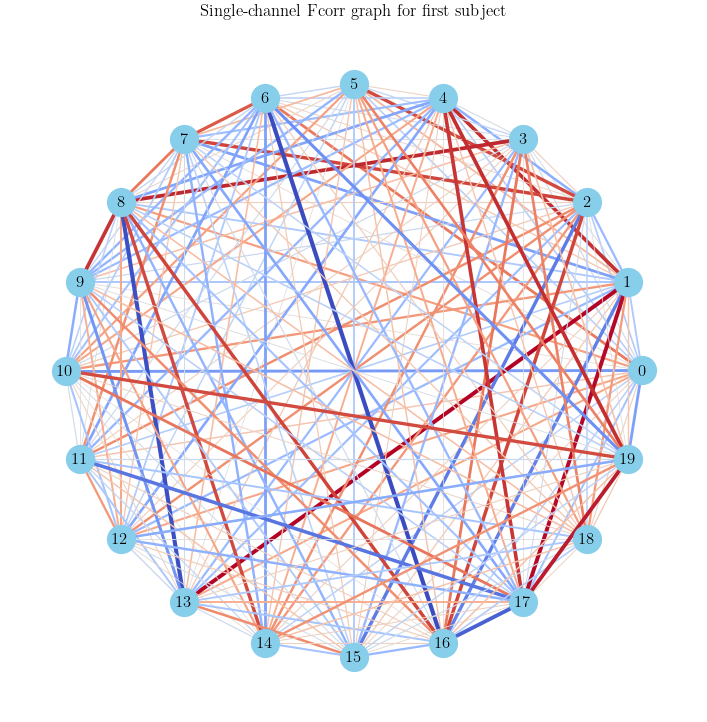

In [82]:
# Visualization of the first subject (single-channel)
row0 = df_original.iloc[0]
columns = full_feature_sets["Fcorr"]
data0 = subject_to_graph_single(row0, columns, size=20)
visualize_graph(data0, edge_feature_idx=0)

---

### Non-Supervised Clustering

Median age: 70.45


C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


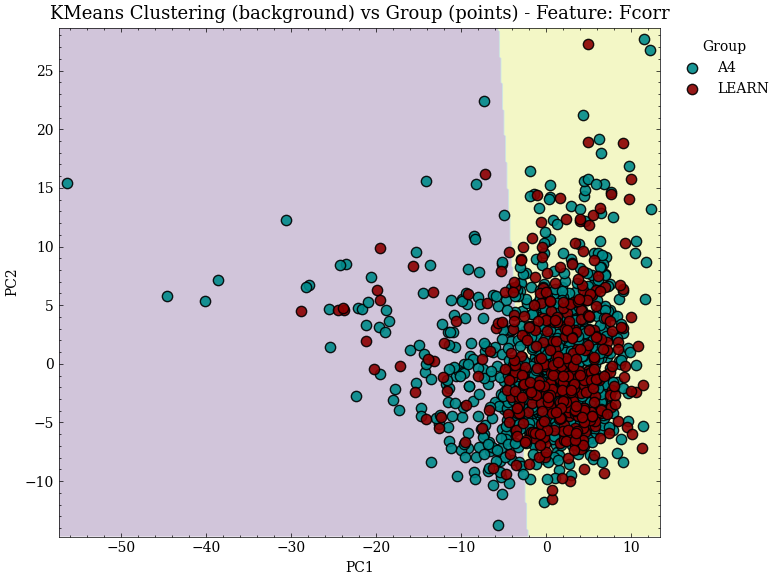

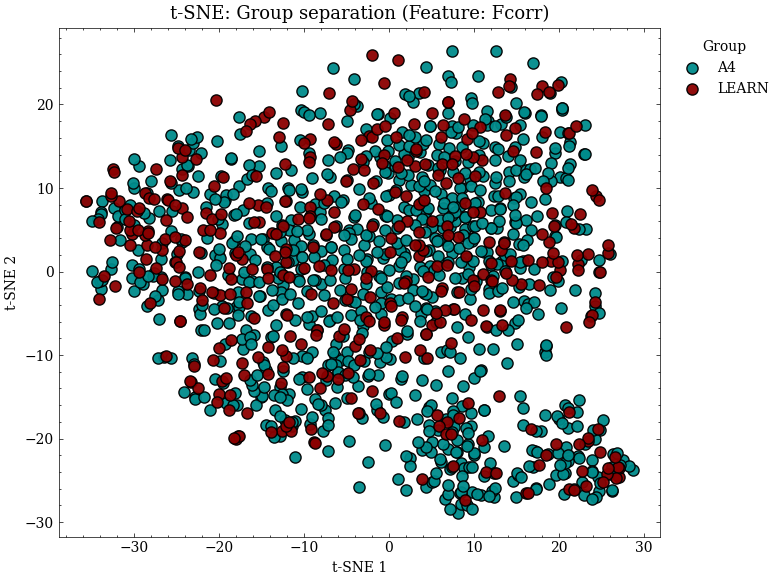

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


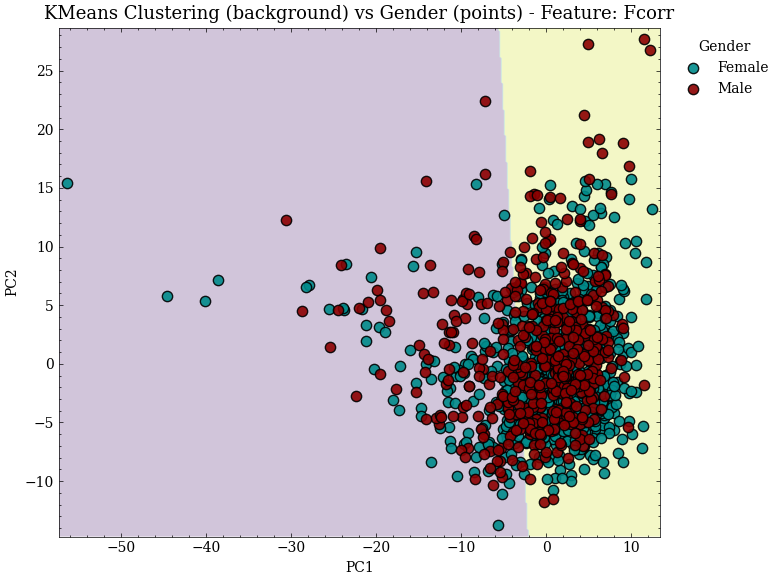

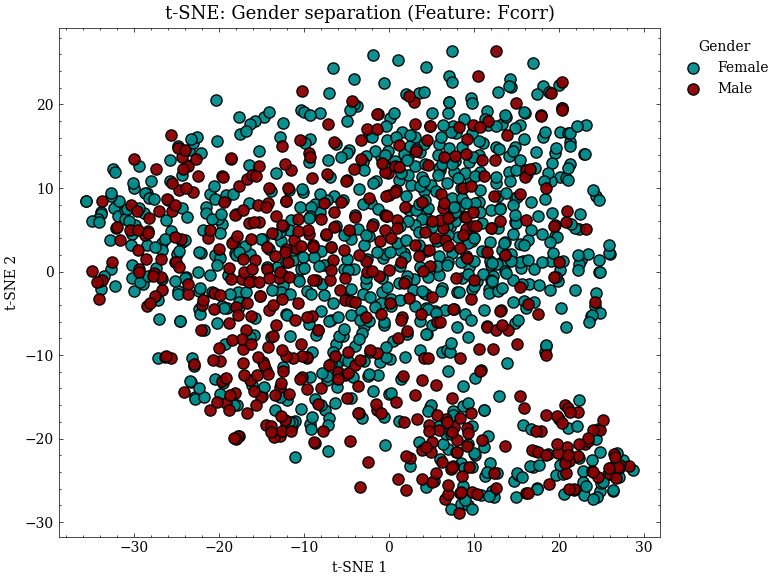

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


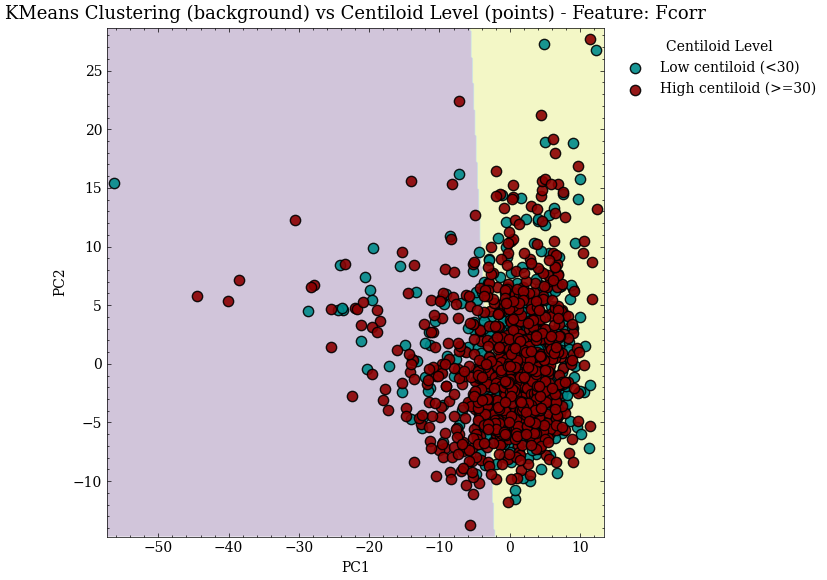

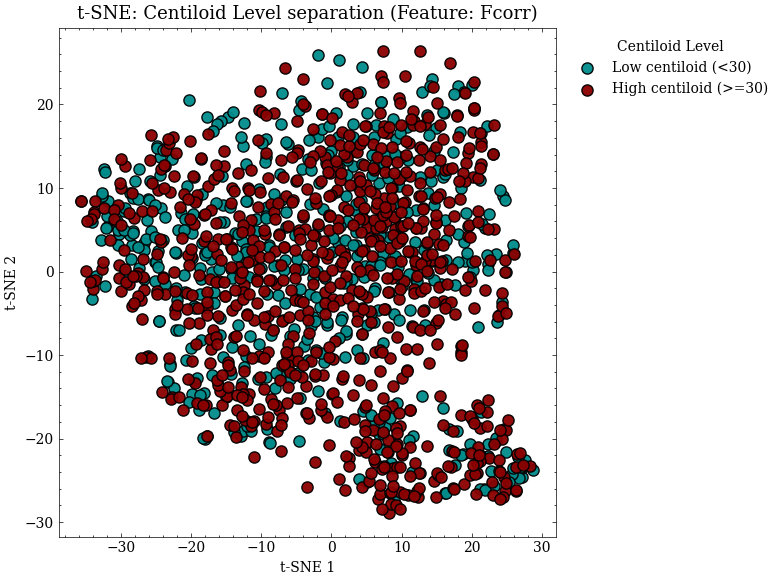

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


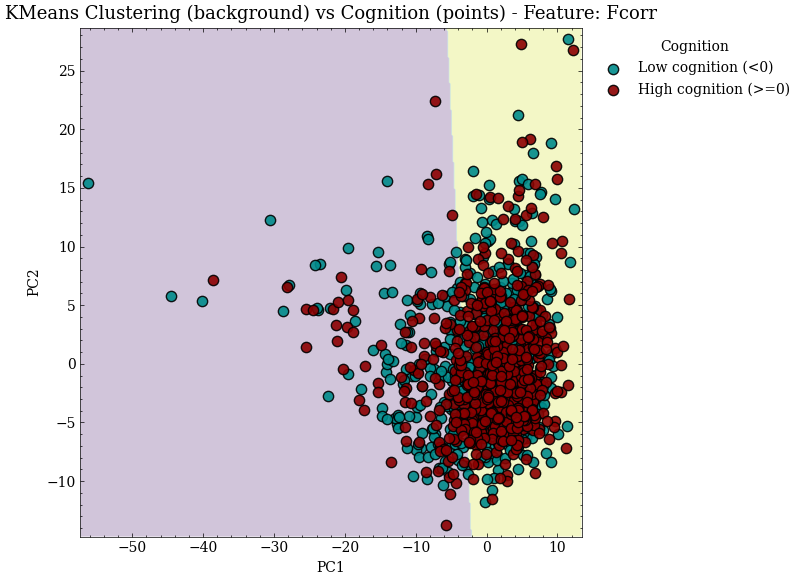

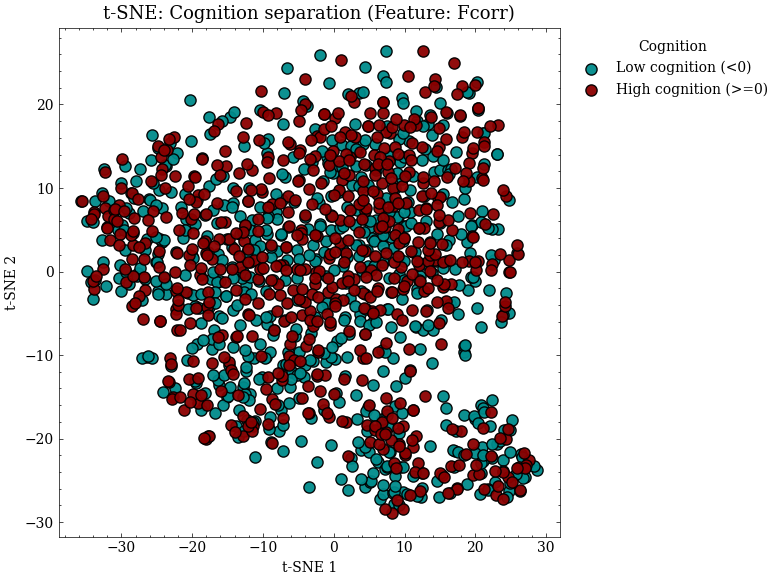

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


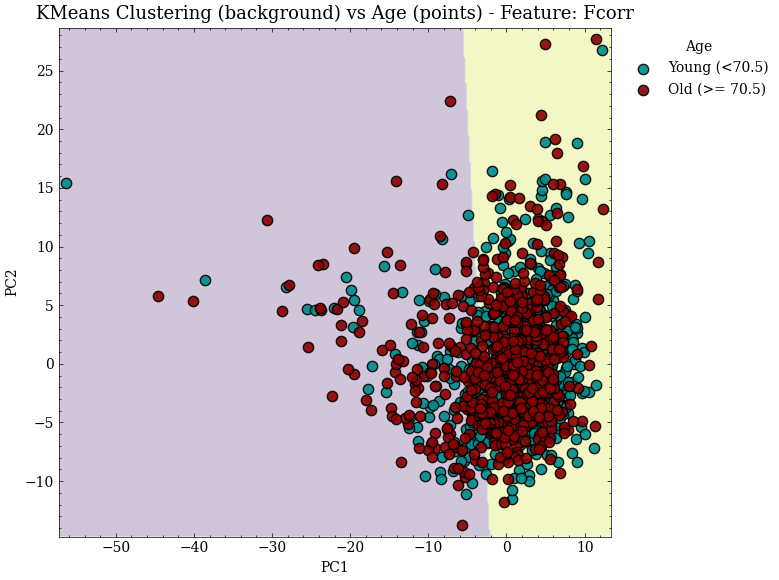

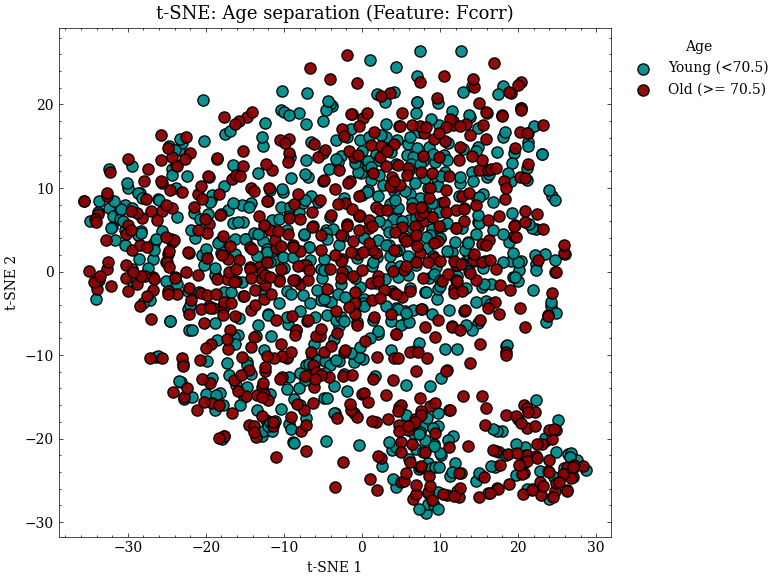

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


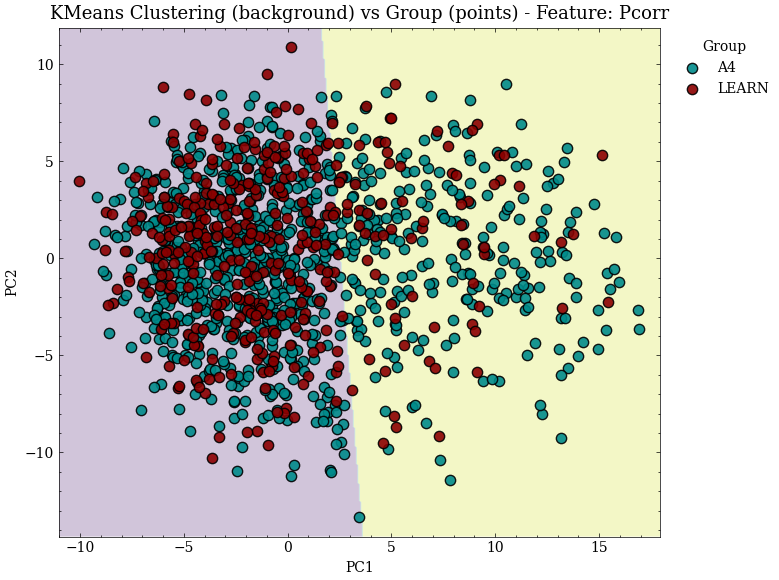

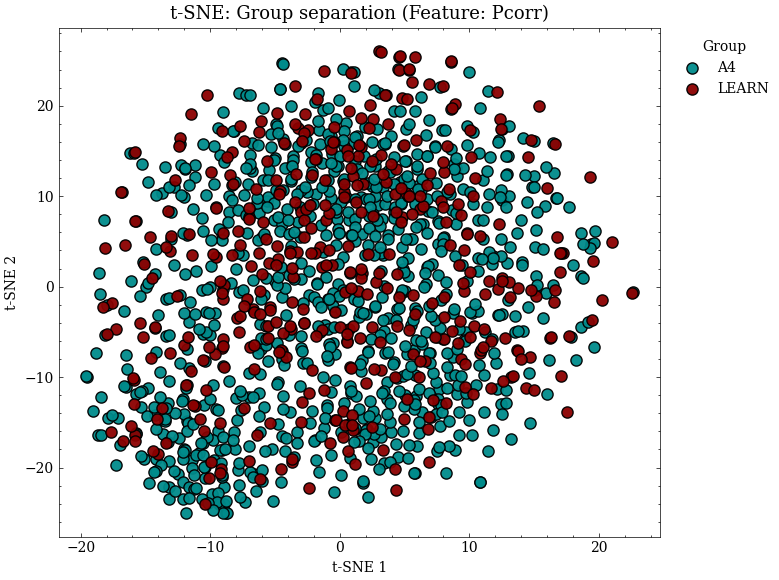

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


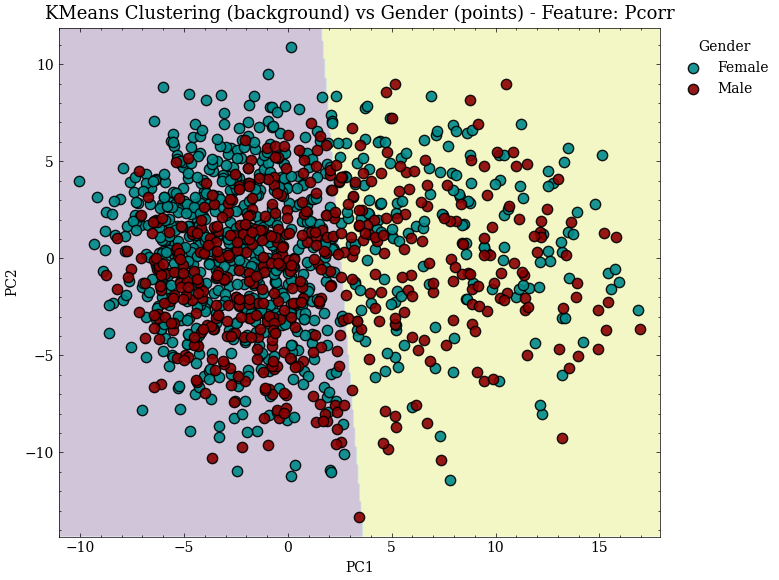

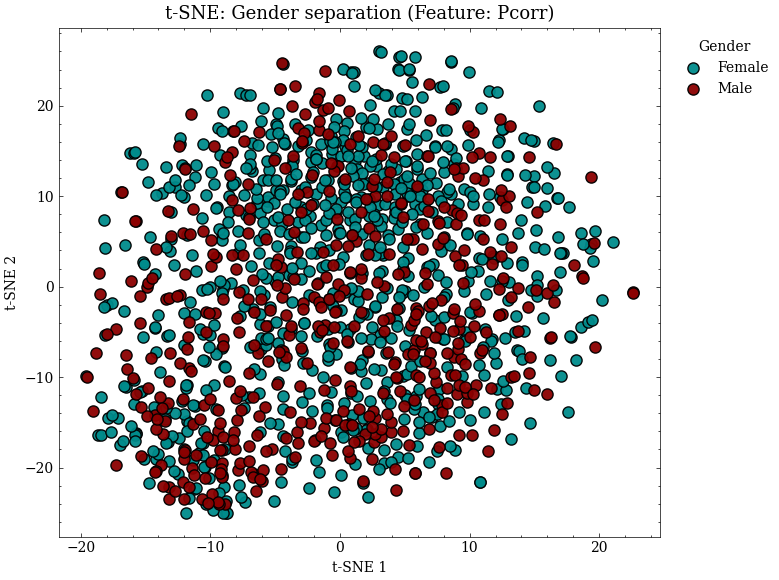

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


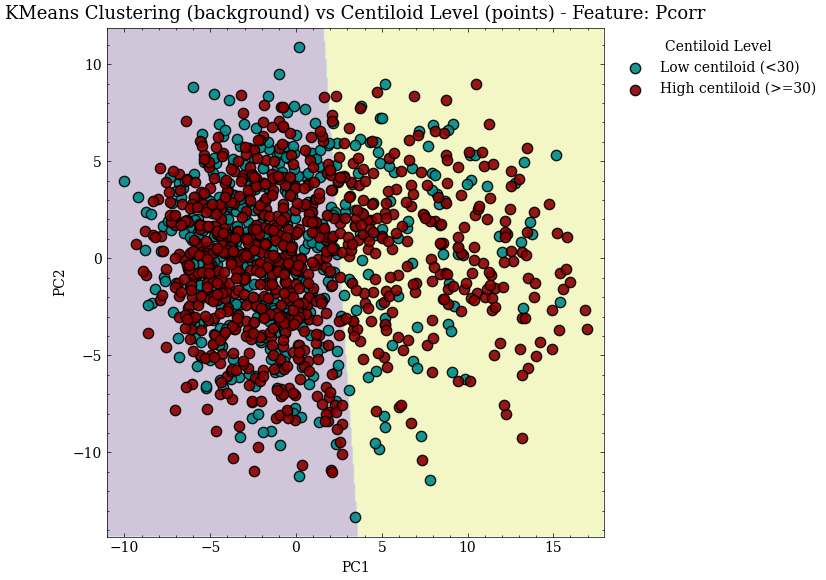

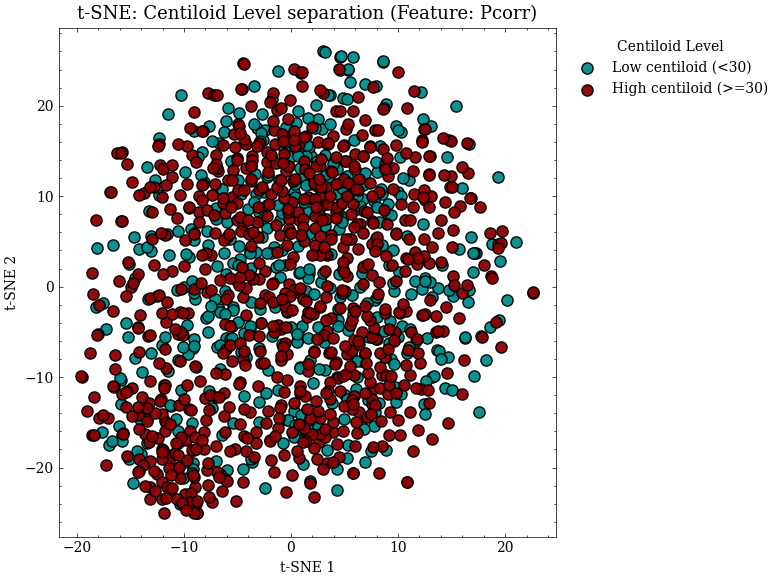

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


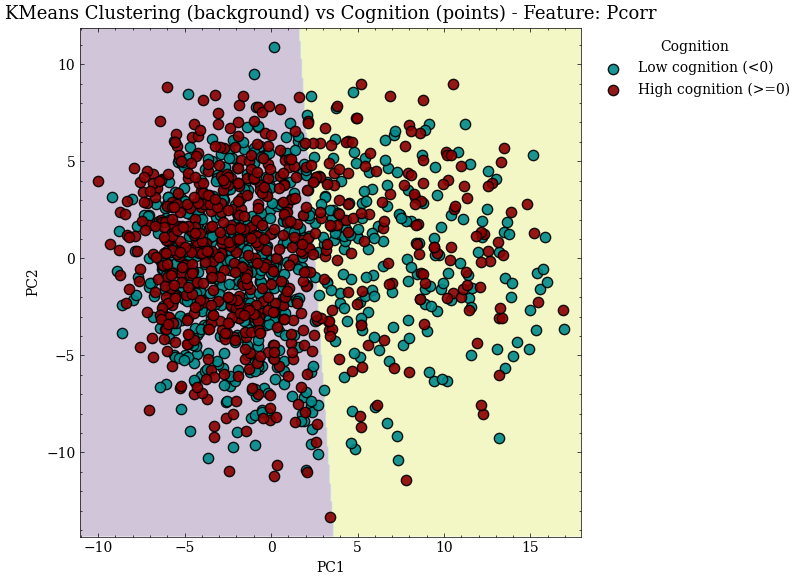

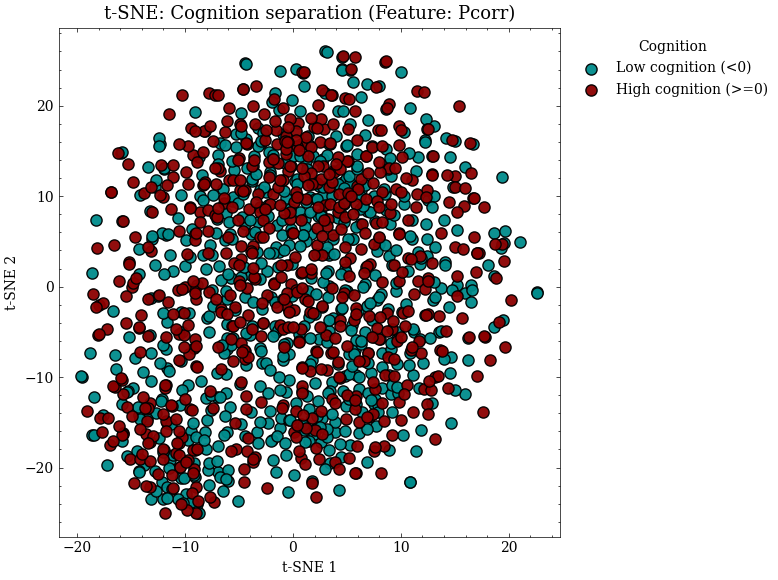

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


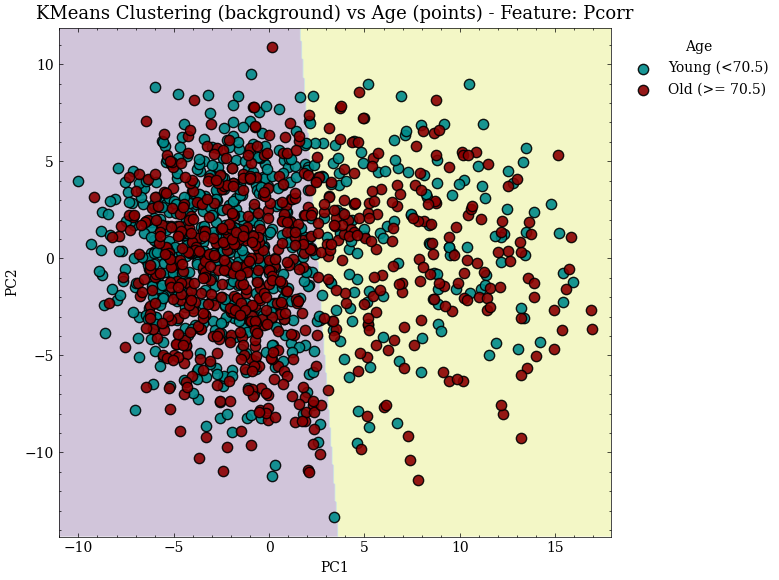

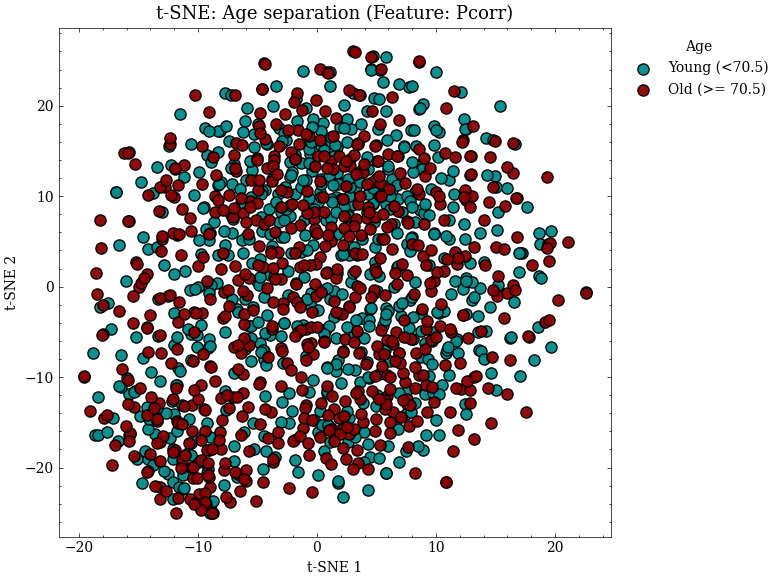

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


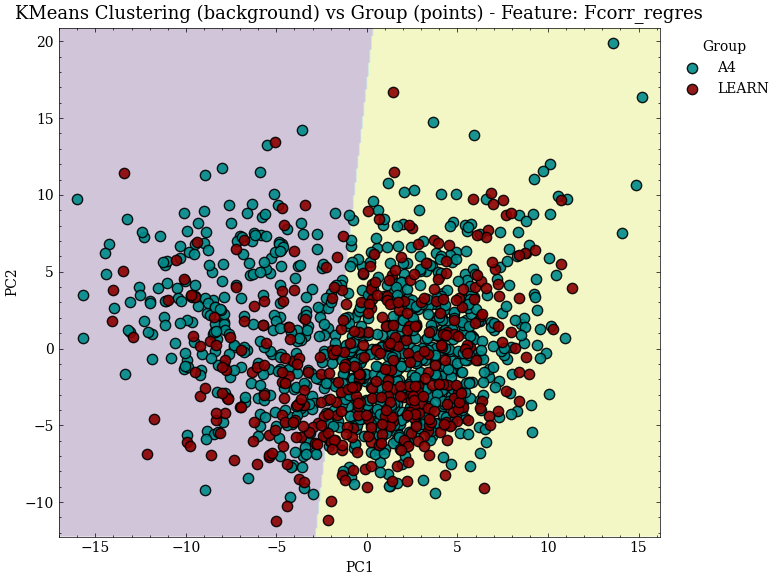

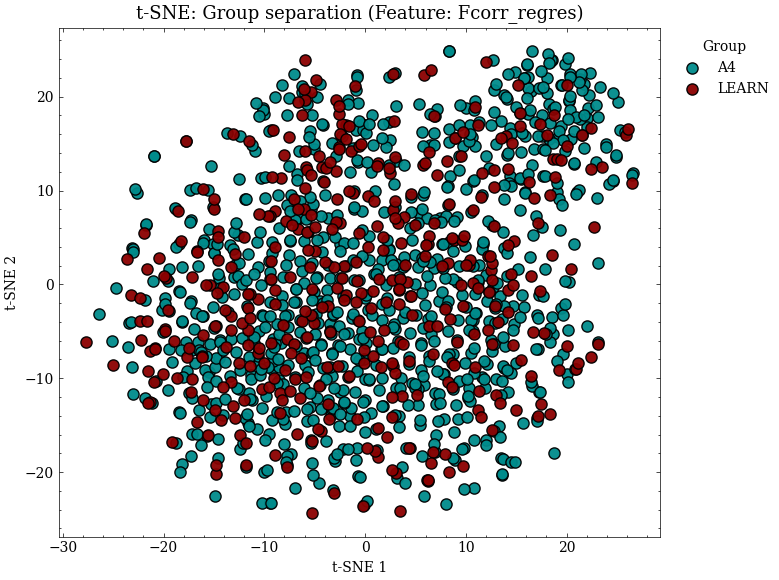

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


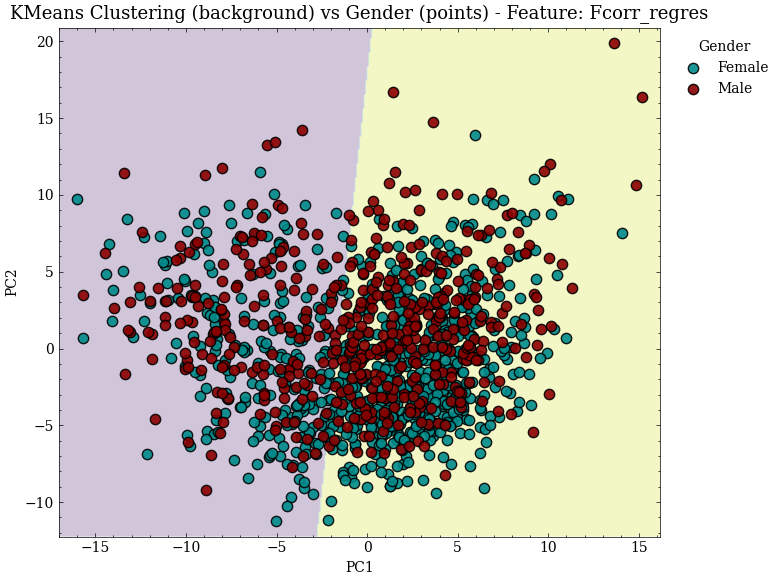

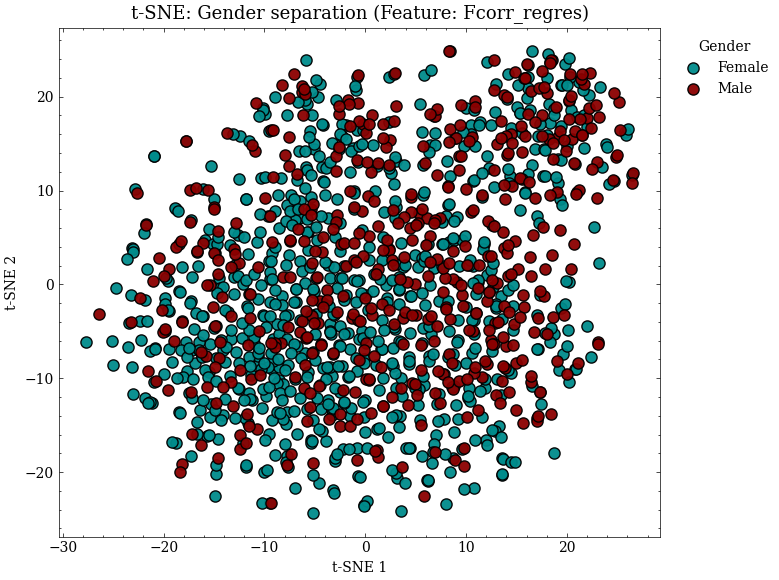

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


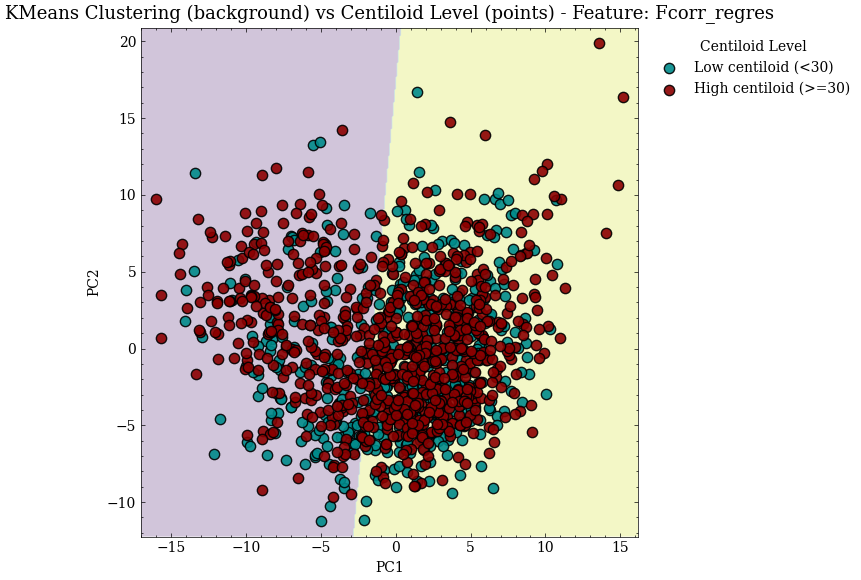

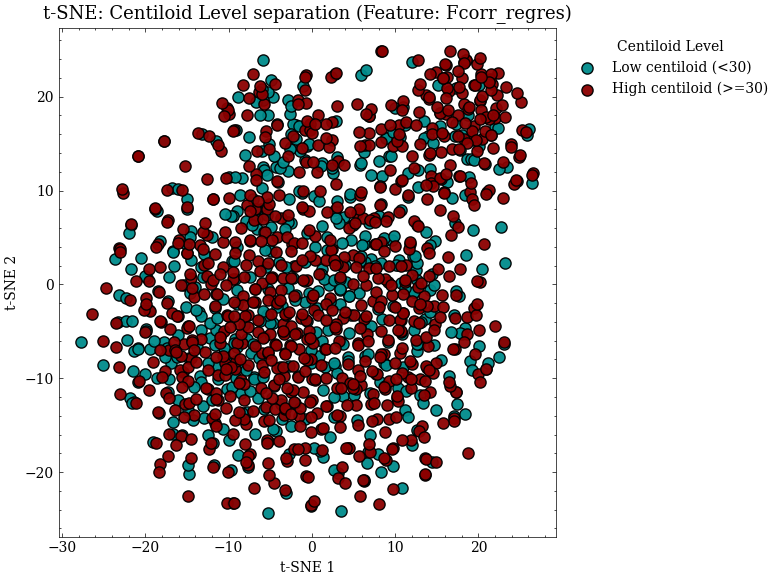

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


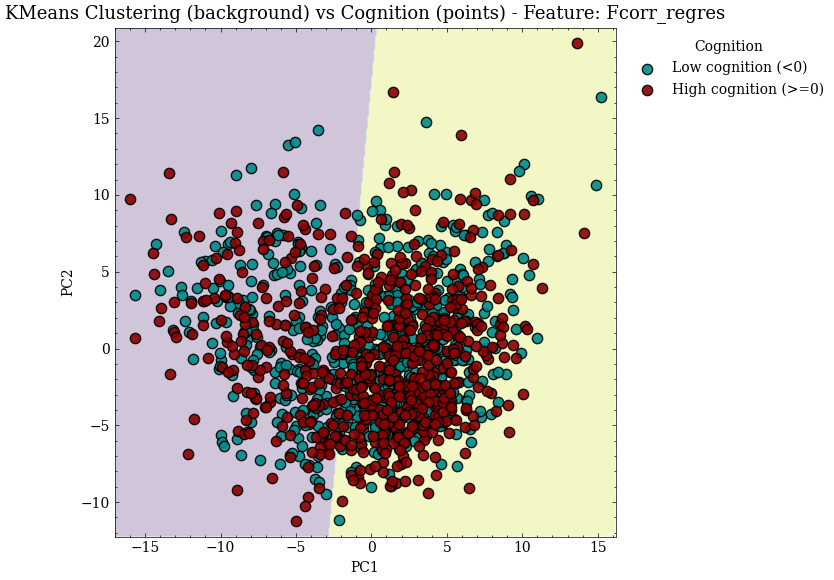

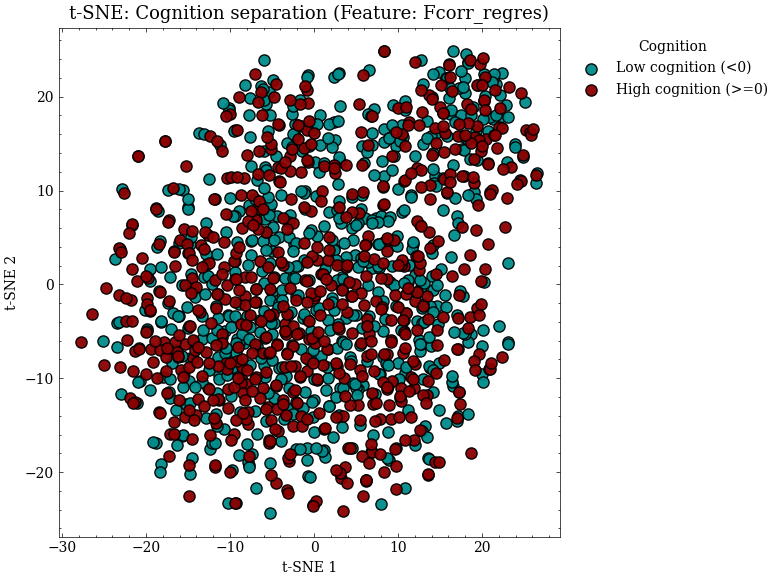

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


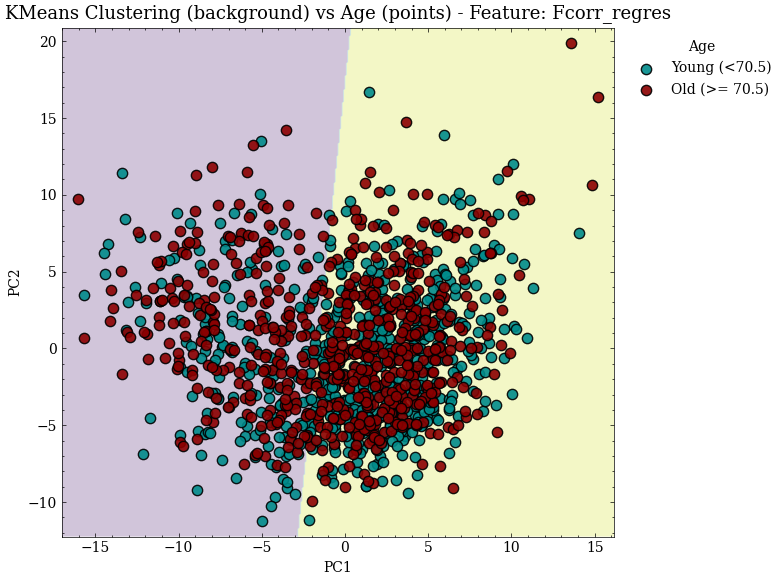

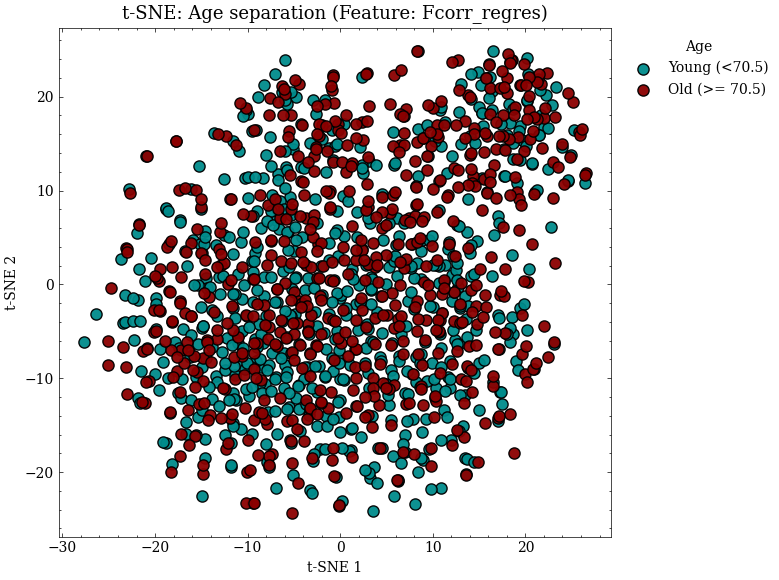

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


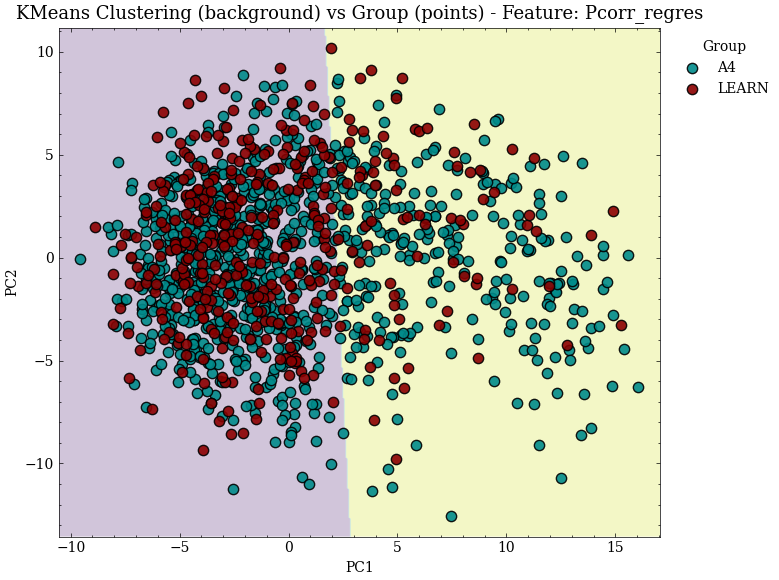

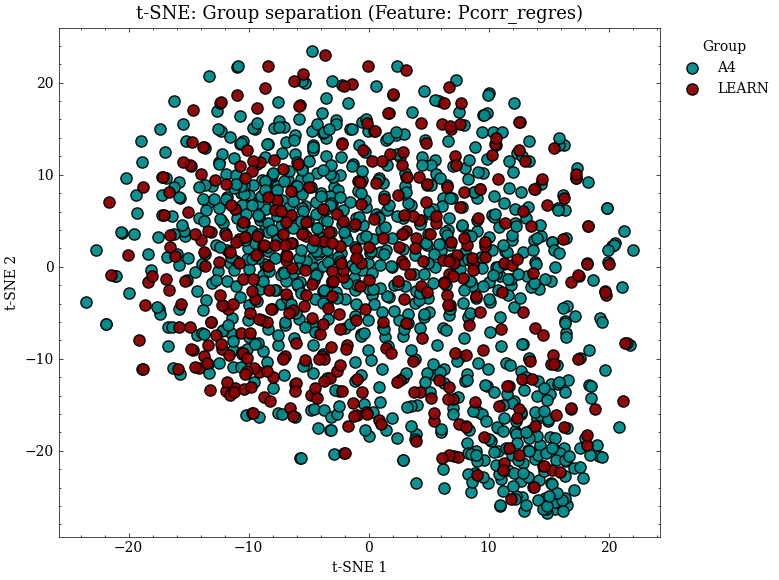

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


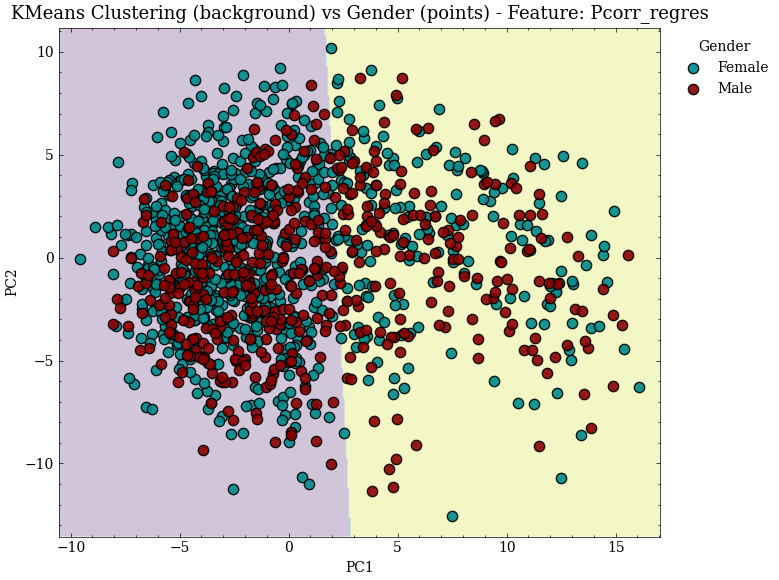

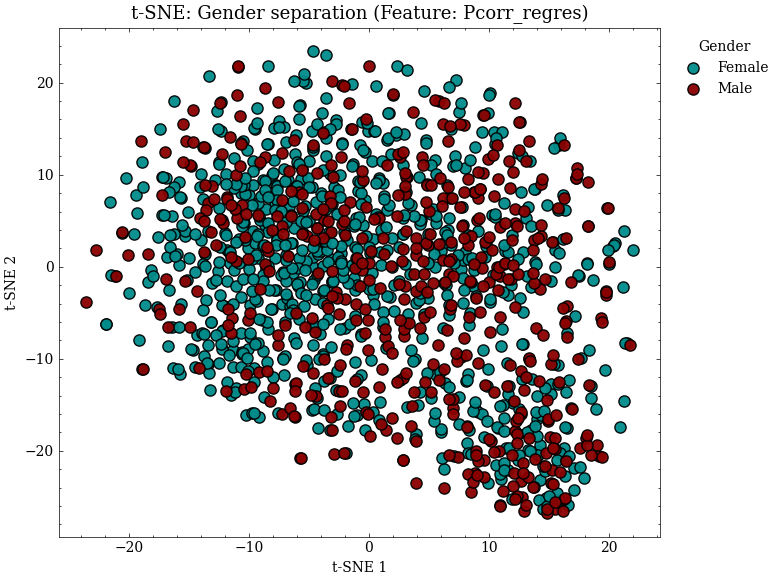

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


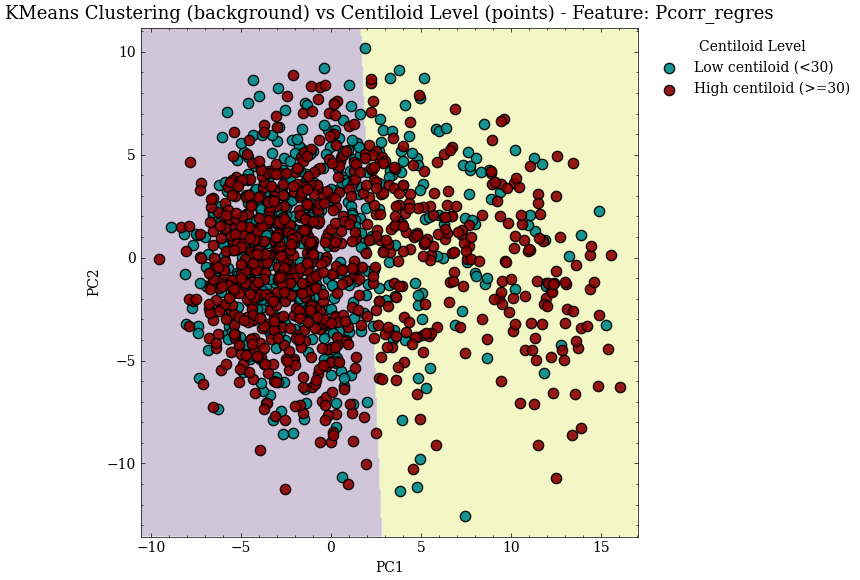

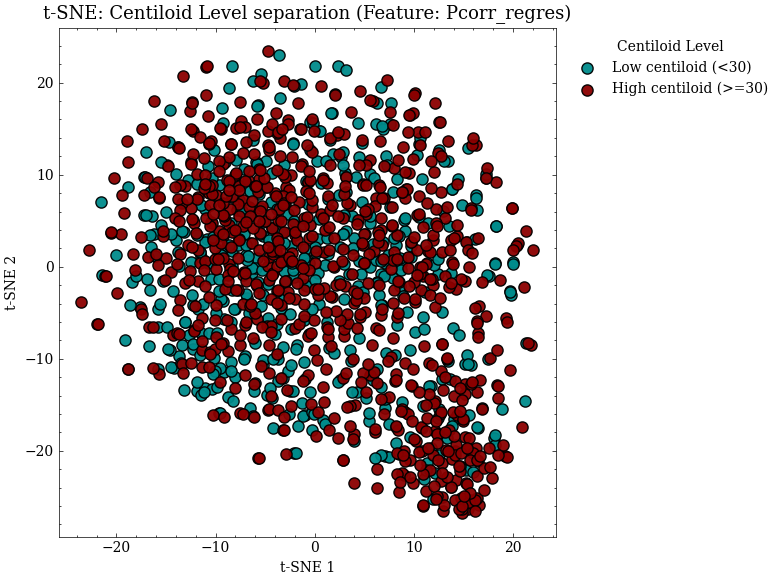

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


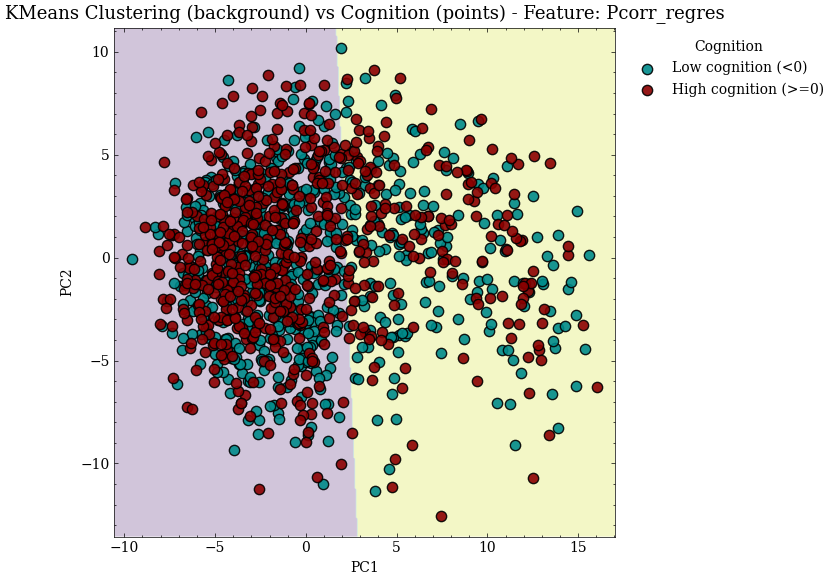

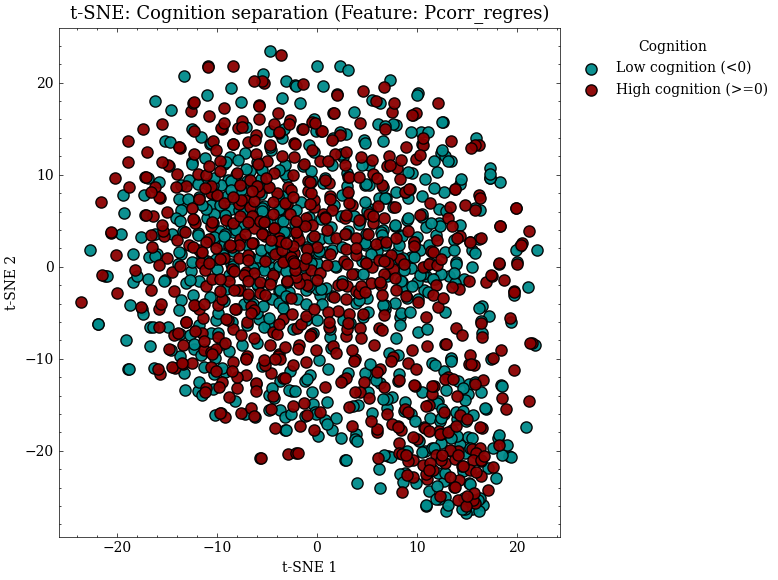

C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\3337120661.py:90: UserWarning: The following kwargs were not used by contour: 'cmaps'
  plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)


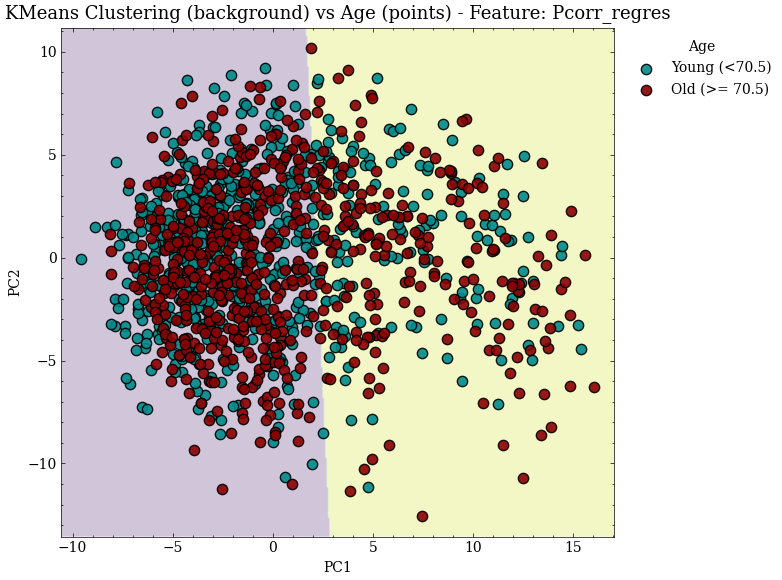

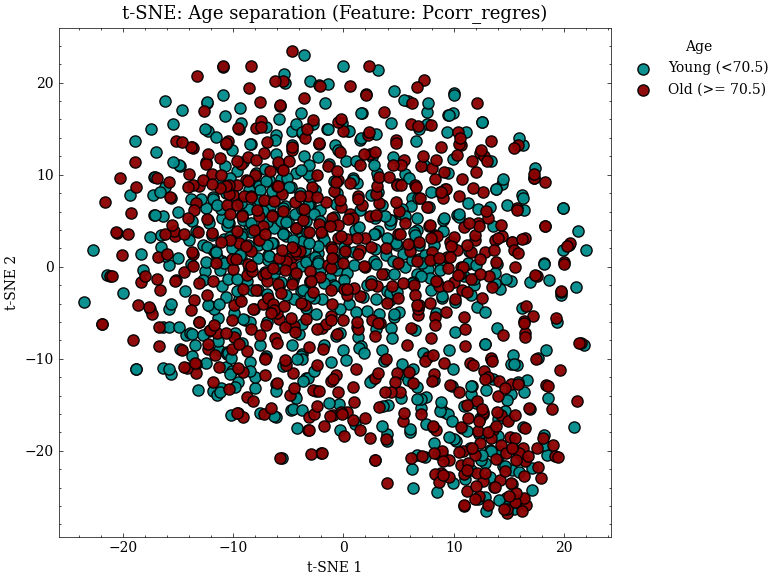

In [ ]:
# Ensure LaTeX is not used for text rendering, avoids unicode issues
matplotlib.rcParams['text.usetex'] = False

df_cluster = df_original.copy()

# List of feature sets to try for clustering/visualization
cluster_feature_set = ["Fcorr", "Pcorr", "Fcorr_regres", "Pcorr_regres"]

color_map = {0: "darkcyan", 1: "darkred"}
background_colors = ["#B2DFDB", "#F8BFBF"]
background_cmap = ListedColormap(background_colors)

renames_dict = {
    "group": "Group",
    "PTGENDER": "Gender",
    "centiloid_bin": "Centiloid Level",
    "PACCRN_bin": "Cognition",
    "PTAGE_bin": "Age"
}

# Define binarization thresholds for age, cognition and centiloid
age_threshold = df_original['PTAGE'].median()
print("Median age:", age_threshold)
pacc_threshold = 0
centiloid_threshold = 30

# Binarize continuous variables based on thresholds
df_cluster['PTAGE_bin'] = (df_cluster['PTAGE'] >= age_threshold).astype(int)
df_cluster['PACCRN_bin'] = (df_cluster['PACCRN'] >= pacc_threshold).astype(int)
df_cluster['centiloid_bin'] = (df_cluster['centiloid'] >= centiloid_threshold).astype(int)

label_mappings = {
    "group": group_mapping,
    "PTGENDER": gender_mapping,
    "centiloid_bin": {0: "Low centiloid (<30)", 1: "High centiloid (>=30)"},
    "cognition_bin": {0: "Low cognition (<0)", 1: "High cognition (>=0)"},
    "age_bin": {0: f"Young (<{age_threshold:.1f})", 1: f"Old (>= {age_threshold:.1f})"}
}

# Define binary targets and label mapping for plotting
binary_targets = [
    ("group", "group_label", group_mapping),
    ("PTGENDER", "PTGENDER_label", gender_mapping),
    ("centiloid_bin", None, {0: "Low centiloid (<30)", 1: "High centiloid (>=30)"}),
    ("PACCRN_bin", None, {0: "Low cognition (<0)", 1: "High cognition (>=0)"}),
    ("PTAGE_bin", None, {0: f"Young (<{age_threshold:.1f})", 1: f"Old (>= {age_threshold:.1f})"})
]

for feature_set in cluster_feature_set:
    # Select and standardize features for clustering
    X = select_individual_features(df_cluster, feature_set)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    for target_variable, target_label_variable, label_mapping in binary_targets:
        # Select binary target for coloring points
        y = df_cluster[target_variable]

        # Prepare label mapping for legend if it is provided
        if label_mapping:
            label_map = label_mapping
        else:
            label_map = {k: str(k) for k in np.unique(y)}

        n_clusters = 2

        # 1. PCA plot with cluster background
        # Project features to 2D with PCA
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)

        # Fit k-means to 2D PCA
        kmeans_2d = KMeans(n_clusters=n_clusters, random_state=44)
        kmeans_2d.fit(X_pca)

        # Create 2D mesh grid for background clustering
        x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
        y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
        xx, yy = np.meshgrid(
            np.linspace(x_min, x_max, 400),
            np.linspace(y_min, y_max, 400)
        )
        mesh_points = np.c_[xx.ravel(), yy.ravel()]

        # Predict cluster for each point in the grid
        Z = kmeans_2d.predict(mesh_points)
        Z = Z.reshape(xx.shape)

        plt.figure(figsize=(8, 6))
        plt.contourf(xx, yy, Z, cmaps=background_cmap, alpha=0.25, antialiased=True)
        for grp in np.unique(y):
            idx = (y == grp)
            plt.scatter(
                X_pca[idx, 0], X_pca[idx, 1],
                c=color_map[grp],
                label=label_map[grp],
                s=55, edgecolor='k', alpha=0.9
            )

        title_var = renames_dict.get(target_variable, target_variable)
        plt.title(f"KMeans Clustering (background) vs {title_var} (points) - Feature: {feature_set}", fontsize=13)
        plt.xlabel("PC1")
        plt.ylabel("PC2")
        plt.legend(title=title_var, bbox_to_anchor=(1.01, 1), loc='upper left')
        plt.tight_layout()
        plt.savefig(f"kmeans_clusters_bg_vs_{target_variable}_{feature_set}.pdf", bbox_inches="tight")
        plt.show()


        # 2. t-SNE plot, colored by true class only
        # Project features to 2D with t-SNE
        tsne = TSNE(n_components=2, random_state=44)
        X_tsne = tsne.fit_transform(X_scaled)

        plt.figure(figsize=(8, 6))
        for grp in np.unique(y):
            idx = (y == grp)
            plt.scatter(
                X_tsne[idx, 0], X_tsne[idx, 1],
                c=color_map[grp],
                label=label_map[grp],
                s=65, edgecolor='k', alpha=0.95
            )
        plt.title(f"t-SNE: {title_var} separation (Feature: {feature_set})", fontsize=13)
        plt.xlabel("t-SNE 1")
        plt.ylabel("t-SNE 2")
        plt.legend(title=title_var, bbox_to_anchor=(1.01, 1), loc='upper left')
        plt.tight_layout()
        plt.savefig(f"tsne_{target_variable}_{feature_set}.pdf", bbox_inches="tight")
        plt.show()

---

### AutoML H2O

In [ ]:
def get_feature_names(df, feature_set):
    if feature_set == 'Fcorr':
        return [col for col in df.columns if col.startswith("fslnets_Fcorr_") and not col.startswith("fslnets_Fcorr_regres_")]
    if feature_set == 'Pcorr':
        return [col for col in df.columns if col.startswith("fslnets_Pcorr_") and not col.startswith("fslnets_Pcorr_regres_")]
    if feature_set == 'Fcorr_regres':
        return [col for col in df.columns if col.startswith("fslnets_Fcorr_regres_")]
    if feature_set == 'Pcorr_regres':
        return [col for col in df.columns if col.startswith("fslnets_Pcorr_regres_")]
    if feature_set == 'amp':
        return [col for col in df.columns if col.startswith("fslnets_amp_ic")]
    if feature_set == 'amp2':
        return [col for col in df.columns if col.startswith("fslnets_amp2_ic")]
    return []

In [ ]:


# Parameters
N_FOLDS = 5
SEED = 44

h2o.init(max_mem_size='4G', nthreads=-1)

results = []

all_targets = binary_variables + continuous_variables

for target in all_targets:
    is_classification = target in binary_variables
    for fs in individual_feature_set:
        feature_names = get_feature_names(df, fs)
        if not feature_names:
            continue
        X = df[feature_names]
        y = df[target]
        # Prepare folds
        kf = KFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
        fold_metrics = []
        fold_leader_models = []
        print(f"\n=== {target} | Feature set: {fs} ===")
        for fold, (train_idx, test_idx) in enumerate(kf.split(X), 1):
            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
            df_train = pd.concat([X_train, y_train], axis=1)
            df_test = pd.concat([X_test, y_test], axis=1)
            h2o_train = h2o.H2OFrame(df_train)
            h2o_test = h2o.H2OFrame(df_test)
            # Cast target type
            if is_classification:
                h2o_train[target] = h2o_train[target].asfactor()
                h2o_test[target] = h2o_test[target].asfactor()
            else:
                h2o_train[target] = h2o_train[target].asnumeric()
                h2o_test[target] = h2o_test[target].asnumeric()
            # AutoML
            aml = H2OAutoML(
                max_runtime_secs=600, 
                max_models=12, 
                seed=SEED, 
                balance_classes=is_classification
            )
            aml.train(x=feature_names, y=target, training_frame=h2o_train)
            perf = aml.leader.model_performance(h2o_test)
            # Metric
            if is_classification:
                acc = perf.accuracy()
                acc = acc[0][1] if isinstance(acc, list) else acc
                fold_metrics.append(acc)
                print(f"  Fold {fold}: accuracy = {acc:.4f} | model: {aml.leader.algo}")
            else:
                rmse = perf.rmse()
                fold_metrics.append(rmse)
                print(f"  Fold {fold}: RMSE = {rmse:.4f} | model: {aml.leader.algo}")
            fold_leader_models.append(aml.leader)  # Store the model
        # Aggregate and save results
        avg_metric = np.mean(fold_metrics)
        std_metric = np.std(fold_metrics)
        # Best fold index and model
        if is_classification:
            best_idx = int(np.argmax(fold_metrics))
        else:
            best_idx = int(np.argmin(fold_metrics))
        best_model = fold_leader_models[best_idx]
        best_model_name = best_model.algo if hasattr(best_model, 'algo') else str(best_model)
        results.append({
            'target': target,
            'feature_set': fs,
            'num_features': len(feature_names),
            'metric_mean': avg_metric,
            'metric_std': std_metric,
            'metric_name': 'accuracy' if is_classification else 'RMSE',
            'fold_metrics': fold_metrics,
            'best_model_name': best_model_name
        })
        print(f"Mean 5-fold {'accuracy' if is_classification else 'RMSE'} for {target}-{fs}: {avg_metric:.4f} ± {std_metric:.4f} (best model: {best_model_name})")

# Shutdown cluster after use
h2o.cluster().shutdown(prompt=False)

# Results DataFrame
results_df = pd.DataFrame(results)
display(results_df.sort_values(['target', 'metric_mean'], ascending=[True, False]))

# Print a summary table with best model for each feature set and target
for t in results_df['target'].unique():
    print(f"\n=== {t} ===")
    sub = results_df[results_df['target'] == t]
    for _, row in sub.iterrows():
        print(f"{row['feature_set']}: mean {row['metric_name']} = {row['metric_mean']:.4f} ± {row['metric_std']:.4f} | best model: {row['best_model_name']}")

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
; OpenJDK 64-Bit Server VM Temurin-21.0.7+6 (build 21.0.7+6-LTS, mixed mode, sharing)
  Starting server from C:\Users\satcr\AppData\Local\Programs\Python\Python312\Lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\satcr\AppData\Local\Temp\tmpsv1xk5u3
  JVM stdout: C:\Users\satcr\AppData\Local\Temp\tmpsv1xk5u3\h2o_Usuario_started_from_python.out
  JVM stderr: C:\Users\satcr\AppData\Local\Temp\tmpsv1xk5u3\h2o_Usuario_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,01 secs
H2O_cluster_timezone:,Europe/Madrid
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.7
H2O_cluster_version_age:,2 months and 2 days
H2O_cluster_name:,H2O_from_python_Usuario_6j33g1
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.984 Gb
H2O_cluster_total_cores:,0
H2O_cluster_allowed_cores:,0
H2O_cluster_status:,"locked, healthy"



=== group | Feature set: Fcorr ===
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
06:32:25.976: AutoML: XGBoost is not available; skipping it.

███████████████████████████████████████████████████████████████| (done) 100%
  Fold 1: accuracy = 0.6988 | model: stackedensemble
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
06:33:41.9: AutoML: XGBoost is not available; skipping it.

███████████████████████████████████████████████████████████████| (done) 100%
  Fold 2: accuracy = 0.7016 | model: glm
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████

,target,feature_set,num_features,metric_mean,metric_std,metric_name,fold_metrics,best_model_name
28,PACCRN,amp,20,0.992421,0.065683,RMSE,"[1.0413240091945175, 0.9292052610728679, 0.972...",glm
24,PACCRN,Fcorr,190,0.989175,0.061979,RMSE,"[1.0530887012663763, 0.9180138579167788, 0.968...",glm
29,PACCRN,amp2,20,0.988312,0.063062,RMSE,"[1.0345859577699368, 0.927419418659266, 0.9690...",glm
27,PACCRN,Pcorr_regres,190,0.988098,0.052780,RMSE,"[1.0327593686110077, 0.9247609417151408, 0.964...",glm
26,PACCRN,Fcorr_regres,190,0.986647,0.059650,RMSE,"[1.0385823631782194, 0.9199113848586631, 0.965...",glm
25,PACCRN,Pcorr,190,0.982538,0.052016,RMSE,"[1.0276598108882502, 0.9382872467510285, 0.951...",stackedensemble
16,PTAGE,amp,20,0.984271,0.038075,RMSE,"[0.9689389931535028, 0.9660477552643265, 0.953...",glm
17,PTAGE,amp2,20,0.982968,0.038533,RMSE,"[0.9706445386646794, 0.9586828659086318, 0.951...",gbm
12,PTAGE,Fcorr,190,0.971518,0.032514,RMSE,"[0.9599390622692962, 0.9425010535664863, 0.946...",stackedensemble
14,PTAGE,Fcorr_regres,190,0.968423,0.032872,RMSE,"[0.9761307807693148, 0.945785321862825, 0.9304...",glm



=== group ===
Fcorr: mean accuracy = 0.7049 ± 0.0048 | best model: glm
Pcorr: mean accuracy = 0.7064 ± 0.0149 | best model: stackedensemble
Fcorr_regres: mean accuracy = 0.7088 ± 0.0126 | best model: glm
Pcorr_regres: mean accuracy = 0.7088 ± 0.0177 | best model: glm
amp: mean accuracy = 0.7010 ± 0.0096 | best model: glm
amp2: mean accuracy = 0.7018 ± 0.0049 | best model: stackedensemble

=== PTGENDER ===
Fcorr: mean accuracy = 0.7599 ± 0.0255 | best model: glm
Pcorr: mean accuracy = 0.7816 ± 0.0156 | best model: stackedensemble
Fcorr_regres: mean accuracy = 0.7405 ± 0.0043 | best model: stackedensemble
Pcorr_regres: mean accuracy = 0.7552 ± 0.0108 | best model: glm
amp: mean accuracy = 0.6979 ± 0.0159 | best model: glm
amp2: mean accuracy = 0.6638 ± 0.0104 | best model: stackedensemble

=== PTAGE ===
Fcorr: mean RMSE = 0.9715 ± 0.0325 | best model: stackedensemble
Pcorr: mean RMSE = 0.9427 ± 0.0349 | best model: stackedensemble
Fcorr_regres: mean RMSE = 0.9684 ± 0.0329 | best model: 

---

## ADNI Dataset Testing

In [ ]:
# Load Excel
file_path = 'df_dr_amplitude_and_fslnets.xlsx'
xls = pd.ExcelFile(file_path)

In [ ]:
# Load sheets individually
df_amp = pd.read_excel(file_path, sheet_name='amplitudes')
df_fc = pd.read_excel(file_path, sheet_name='Full_Corr')
df_pc = pd.read_excel(file_path, sheet_name='Partial_Corr')
df_fc_reg = pd.read_excel(file_path, sheet_name='Full_Corr_ts_regressed')
df_pc_reg = pd.read_excel(file_path, sheet_name='Partial_Corr_ts_regressed')

In [ ]:
# Rename the first column as a unique identifier
# In this sample there are repeated subjects -> the same subject (same subject_id) may appear at ‘time zero’ or baseline and also at m6 (6 months), m12, m180... (session_id)
# They are treated as 294 different samples
unique_id = 'unique_id'
dfs = [df_amp, df_fc, df_pc, df_fc_reg, df_pc_reg]
for df_i in dfs:
    df_i.rename(columns={df_i.columns[0]: unique_id}, inplace=True)

In [ ]:
# Main variables
clinical_vars = ['unique_id', 'group_bl', 'age_bl', 'sex']
clinical_df = df_amp[clinical_vars].copy()

In [ ]:
# From each matrix, only leave ‘unique_id’ and the columns that start with the correct prefix
def keep_only_data_columns(df, prefix):
    cols = [col for col in df.columns if col == 'unique_id' or col.startswith(prefix)]
    return df[cols]

df_amp_feats = keep_only_data_columns(df_amp, 'fslnets_amp')
df_fc_feats = keep_only_data_columns(df_fc, 'fslnets_Fcorr_')
df_pc_feats = keep_only_data_columns(df_pc, 'fslnets_Pcorr_')
df_fc_reg_feats = keep_only_data_columns(df_fc_reg, 'fslnets_Fcorr_regres_')
df_pc_reg_feats = keep_only_data_columns(df_pc_reg, 'fslnets_Pcorr_regres_')

In [ ]:
# Merge all sheets into a single dataframe
df_adni = clinical_df.merge(df_amp_feats, on='unique_id') \
                .merge(df_fc_feats, on='unique_id') \
                .merge(df_pc_feats, on='unique_id') \
                .merge(df_fc_reg_feats, on='unique_id') \
                .merge(df_pc_reg_feats, on='unique_id')

print(f"Combined DataFrame has {df_adni.shape[0]} rows and {df_adni.shape[1]} columns.")

Combined DataFrame has 294 rows and 934 columns.


In [ ]:
# Count columns by type
prefixes = {
    'amplitudes': 'amp',
    'Full_Corr': 'Full_Corr',
    'Partial_Corr': 'Partial_Corr',
    'Full_Corr_ts_regressed': 'Full_Corr_ts_regressed',
    'Partial_Corr_ts_regressed': 'Partial_Corr_ts_regressed'
}

column_counts = {
    'amplitudes': len([col for col in df_adni.columns if col.startswith('fslnets_amp_ic') or col.startswith('fslnets_amp2_ic')]),
    'Full_Corr': len([col for col in df_adni.columns 
                      if col.startswith('fslnets_Fcorr_') and not col.startswith('fslnets_Fcorr_regres_')]),
    'Partial_Corr': len([col for col in df_adni.columns 
                         if col.startswith('fslnets_Pcorr_') and not col.startswith('fslnets_Pcorr_regres_')]),
    'Full_Corr_ts_regressed': len([col for col in df_adni.columns if col.startswith('fslnets_Fcorr_regres_')]),
    'Partial_Corr_ts_regressed': len([col for col in df_adni.columns if col.startswith('fslnets_Pcorr_regres_')])
}

# To DataFrame
column_counts_df = pd.DataFrame(list(column_counts.items()), columns=['Group', 'Number of columns'])
display(column_counts_df)

,Group,Number of columns
0,amplitudes,30
1,Full_Corr,225
2,Partial_Corr,225
3,Full_Corr_ts_regressed,225
4,Partial_Corr_ts_regressed,225


In [ ]:
print("Number of subjects by clinical group:")
print(df_adni['group_bl'].value_counts())

Number of subjects by clinical group:
group_bl
MCI         147
CN          135
Dementia     12
Name: count, dtype: int64


In [ ]:
# Group distribution as a printed table
print("Number of subjects by sex")
print(df_adni['sex'].value_counts())

Number of subjects by sex
sex
Female    152
Male      142
Name: count, dtype: int64


C:\Users\satcr\AppData\Local\Temp\ipykernel_7140\2399649483.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='group_bl', y='age_bl', data=df_adni, palette='Set2')


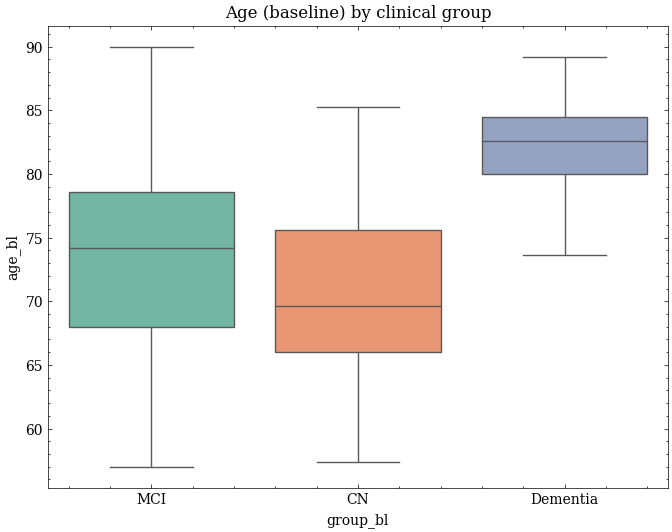

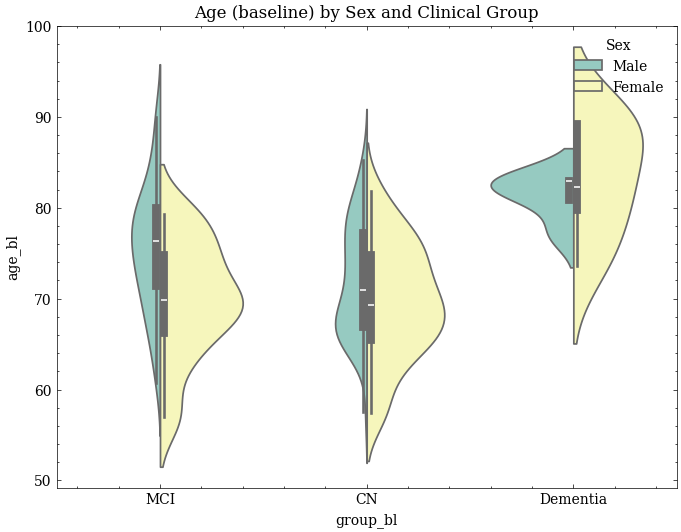

In [ ]:
# Age distribution by group
plt.figure(figsize=(8,6))
sns.boxplot(x='group_bl', y='age_bl', data=df_adni, palette='Set2')
plt.title('Age (baseline) by clinical group')
plt.show()

# Violin plot: age by sex and clinical group
plt.figure(figsize=(8,6))
sns.violinplot(x='group_bl', y='age_bl', hue='sex', data=df_adni, split=True, palette='Set3')
plt.title('Age (baseline) by Sex and Clinical Group')
plt.legend(title='Sex')
plt.show()

In [ ]:
# Keep only CN and MCI for group classification
df_adni = df_adni[df_adni['group_bl'].isin(['CN', 'MCI'])]
print(f"Shape after keeping only CN and MCI: {df_adni.shape}")

Shape after keeping only CN and MCI: (282, 934)


In [ ]:
null_counts = df_adni.isna().sum() # Count NaNs by column
null_percent = (null_counts / len(df_adni)) * 100 # Calculate percentage of NaNs

# Summary
summary = pd.DataFrame({
    "Nº of NaNs": null_counts,
    "% of NaNs": null_percent.round(2)
})

# See first columns with NaNs
print(summary[summary["Nº of NaNs"] > 0].head(20))

        Nº of NaNs  % of NaNs
age_bl           2       0.71


In [ ]:
# Remove instances with NaNs in age_bl
print(f"Original shape of the dataframe DataFrame: {df_adni.shape}")
df_adni = df_adni[df_adni['age_bl'].notna()]
print(f"Shape after eliminating NaNs from age_bl: {df_adni.shape}")

Original shape of the dataframe DataFrame: (282, 934)
Shape after eliminating NaNs from age_bl: (280, 934)


In [ ]:
# Encode categorical variables
le_group = LabelEncoder()
df_adni['group_bl_label'] = le_group.fit_transform(df_adni['group_bl'])
le_sex = LabelEncoder()
df_adni['sex_label'] = le_sex.fit_transform(df_adni['sex'])

# Scale age
scaler = StandardScaler()
df_adni['age_bl_norm'] = scaler.fit_transform(df_adni[['age_bl']])

In [ ]:
def classify_columns(df): 
    full_Corr = [col for col in df.columns if col.startswith("fslnets_Fcorr_") and not col.startswith("fslnets_Fcorr_regres_")]
    partial_Corr = [col for col in df.columns if col.startswith("fslnets_Pcorr_") and not col.startswith("fslnets_Pcorr_regres_")]
    full_Corr_ts_regressed = [col for col in df.columns if col.startswith("fslnets_Fcorr_regres_")]
    partial_Corr_ts_regressed = [col for col in df.columns if col.startswith("fslnets_Pcorr_regres_")]
    return full_Corr, partial_Corr, full_Corr_ts_regressed, partial_Corr_ts_regressed

fslnets_Fcorr_adni, fslnets_Pcorr_adni, fslnets_Fcorr_regres_adni, fslnets_Pcorr_regres_adni = classify_columns(df_adni)

In [ ]:
# These matrices are 15x15
matrix_analyses_results = [
    analyze_matrix(df_adni, fslnets_Fcorr_adni, "fslnets_Fcorr_", size=15),
    analyze_matrix(df_adni, fslnets_Pcorr_adni, "fslnets_Pcorr_", size=15),
    analyze_matrix(df_adni, fslnets_Fcorr_regres_adni, "fslnets_Fcorr_regres_", size=15),
    analyze_matrix(df_adni, fslnets_Pcorr_regres_adni, "fslnets_Pcorr_regres_", size=15)
]

matrix_analyses_results_df = summarize_matrix_analyses(matrix_analyses_results)
print(matrix_analyses_results_df.to_string(index=False))

               Matrix  Complete  Symmetric  Zero Diagonal
       fslnets_Fcorr_      True       True           True
       fslnets_Pcorr_      True       True           True
fslnets_Fcorr_regres_      True       True           True
fslnets_Pcorr_regres_      True       True           True


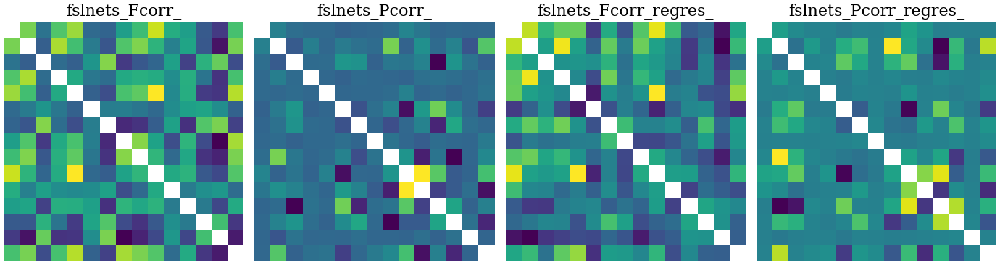

In [ ]:
plot_matrices(matrix_analyses_results)

In [ ]:
# Reduce dimensionality
filtered_Fcorr_adni = get_lower_triangle_columns(fslnets_Fcorr_adni, size=15)
filtered_Pcorr_adni = get_lower_triangle_columns(fslnets_Pcorr_adni, size=15)
filtered_Fcorr_regres_adni = get_lower_triangle_columns(fslnets_Fcorr_regres_adni, size=15)
filtered_Pcorr_regres_adni = get_lower_triangle_columns(fslnets_Pcorr_regres_adni, size=15)

In [ ]:
# Exclude the original columns of Fcorr/Pcorr (leave only lower-triangle + other features)
cols_to_exclude = fslnets_Fcorr_adni + fslnets_Pcorr_adni + fslnets_Fcorr_regres_adni + fslnets_Pcorr_regres_adni
other_columns = [col for col in df_adni.columns if col not in cols_to_exclude]

columns_to_keep = other_columns + filtered_Fcorr_adni + filtered_Pcorr_adni + filtered_Fcorr_regres_adni + filtered_Pcorr_regres_adni
df_adni = df_adni[columns_to_keep]

# Verify the new reduced DataFrame
print("Verifying number of columns per type (expecting 105 each):")
print(f"Full_Corr:                 {len(filtered_Fcorr_adni)} columns")
print(f"Partial_Corr:              {len(filtered_Pcorr_adni)} columns")
print(f"Full_Corr_ts_regressed:    {len(filtered_Fcorr_regres_adni)} columns")
print(f"Partial_Corr_ts_regressed: {len(filtered_Pcorr_regres_adni)} columns")

Verifying number of columns per type (expecting 105 each):
Full_Corr:                 105 columns
Partial_Corr:              105 columns
Full_Corr_ts_regressed:    105 columns
Partial_Corr_ts_regressed: 105 columns


In [ ]:
df_adni = df_adni.rename(columns={
    "group_bl_label": "group",
    "sex_label": "PTGENDER"
})

In [ ]:
datasets = {
    "ADNI": df_adni,
    "A4": df
}

In [ ]:
feature_sets_dict = {
    "A4": {  # (20x20)
        "Fcorr": filtered_Fcorr,
        "Fcorr_regres": filtered_Fcorr_regres,
        "Pcorr": filtered_Pcorr,
        "Pcorr_regres": filtered_Pcorr_regres
    },
    "ADNI": { # (15x15)
        "Fcorr": filtered_Fcorr_adni,
        "Fcorr_regres": filtered_Fcorr_regres_adni,
        "Pcorr": filtered_Pcorr_adni,
        "Pcorr_regres": filtered_Pcorr_regres_adni
    }
}

In [ ]:
classification_targets_dict = {
    "A4": ["group", "PTGENDER"],
    "ADNI": ["group", "PTGENDER"]
}

In [ ]:
results = []

for dataset_name, df_dataset in datasets.items():
    feature_sets = feature_sets_dict[dataset_name]
    targets = classification_targets_dict[dataset_name]
    for feature_set_name, columns in feature_sets.items():
        X = df_dataset[columns]
        for target in targets:
            y = df_dataset[target]
            skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=44)
            model = SVC()
            scores = cross_val_score(model, X, y, cv=skf, scoring='accuracy')
            results.append({
                "Dataset": dataset_name,
                "FeatureSet": feature_set_name,
                "Target": target,
                "Task": "Classification",
                "Metric": "Accuracy",
                "Mean": scores.mean(),
                "Std": scores.std()
            })

results_adni_df = pd.DataFrame(results)
print(results_adni_df)

   Dataset    FeatureSet    Target            Task    Metric      Mean  \
0     ADNI         Fcorr     group  Classification  Accuracy  0.610714   
1     ADNI         Fcorr  PTGENDER  Classification  Accuracy  0.675000   
2     ADNI  Fcorr_regres     group  Classification  Accuracy  0.685714   
3     ADNI  Fcorr_regres  PTGENDER  Classification  Accuracy  0.603571   
4     ADNI         Pcorr     group  Classification  Accuracy  0.607143   
5     ADNI         Pcorr  PTGENDER  Classification  Accuracy  0.671429   
6     ADNI  Pcorr_regres     group  Classification  Accuracy  0.632143   
7     ADNI  Pcorr_regres  PTGENDER  Classification  Accuracy  0.592857   
8       A4         Fcorr     group  Classification  Accuracy  0.693260   
9       A4         Fcorr  PTGENDER  Classification  Accuracy  0.723453   
10      A4  Fcorr_regres     group  Classification  Accuracy  0.697133   
11      A4  Fcorr_regres  PTGENDER  Classification  Accuracy  0.725794   
12      A4         Pcorr     group  Cl

In [ ]:
def plot_comparison_dataframes_adni(comparison_df, hue_order, palette):

    for (task, target), df_t in comparison_df.groupby(["Task", "Target"]):
        mean_pivot = df_t.pivot(index="FeatureSet", columns="Dataset", values="Mean")
        std_pivot  = df_t.pivot(index="FeatureSet", columns="Dataset", values="Std")
        feature_sets = mean_pivot.index.tolist()
        datasets     = hue_order
        x = np.arange(len(feature_sets))
        width = 0.8 / len(datasets)
        fig, ax = plt.subplots(figsize=(10, 5))
        for i, ds in enumerate(datasets):
            means = mean_pivot[ds]
            errs = std_pivot[ds]
            bars = ax.bar(
                x + i * width,
                means,
                width,
                label=ds,
                yerr=errs,
                capsize=4,
                color=palette[i],
                zorder=2
            )
            for bar, m, e in zip(bars, means, errs):
                cx = bar.get_x() + bar.get_width() / 2
                y_label = bar.get_y() + 0.05 * bar.get_height()
                ax.text(
                    cx, y_label,
                    f"{m:.3f}±{e:.3f}",
                    ha="center", va="bottom",
                    rotation=90,
                    color="black",
                    fontsize=10,
                    clip_on=True,
                    zorder=5
                )

        ax.set_xticks(x + width * (len(datasets) - 1) / 2)
        ax.set_xticklabels(feature_sets, rotation=45, ha="right")

        # Set label/title based on the metric
        metric = df_t['Metric'].iloc[0] if 'Metric' in df_t.columns else "Accuracy"
        ylabel = "Accuracy" if metric.lower() == "accuracy" else "RMSE"
        if ylabel == "Accuracy":
            ax.set_ylim(0, 1)
        else:
            max_y = (mean_pivot.values + std_pivot.values).max()
            ax.set_ylim(0, max_y * 1.15)
        ax.set_ylabel(ylabel)

        pretty_target = clean_names.get(target, str(target))
        ax.set_title(f"{ylabel} by Dataset for '{pretty_target}' (Mean ± Std over 5 folds)")
        ax.grid(axis="y", linestyle="--", alpha=0.6)
        ax.legend(title="Dataset", loc="upper right")
        plt.tight_layout()
        safe_target = str(target).replace(" ", "_").replace("/", "_")
        plt.savefig(f"comparison_{task}_{safe_target}.pdf")
        plt.show()
        plt.show()

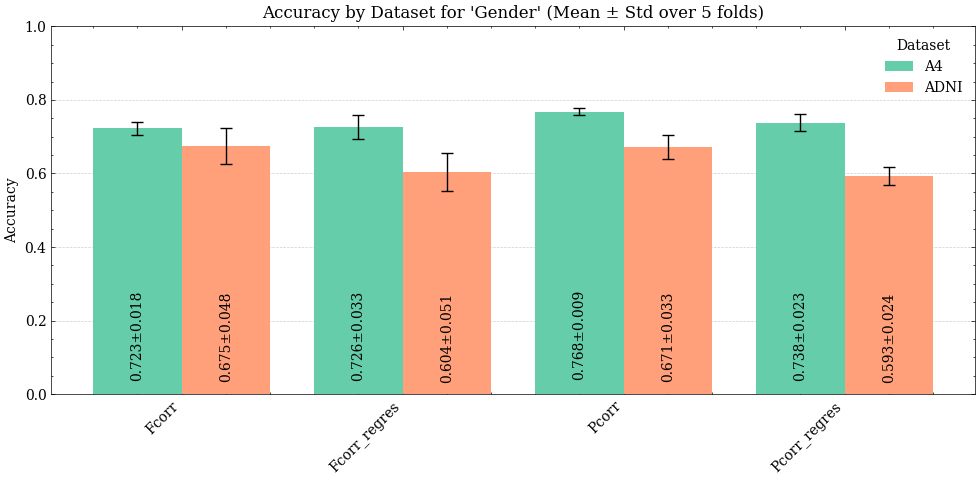

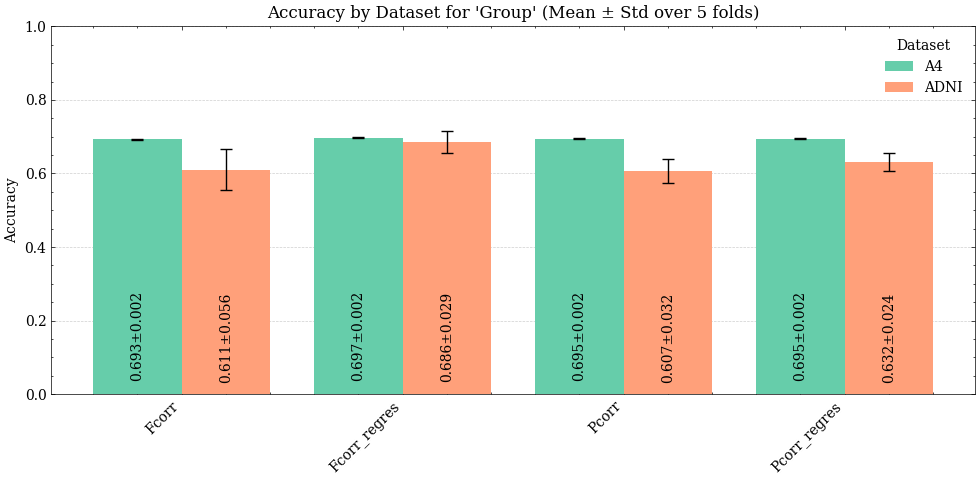

In [ ]:
hue_order = ["A4", "ADNI"]

plot_comparison_dataframes_adni(results_adni_df, hue_order, comparison_palette)